# **Проект: Анализ данных компании Gectaro"**

## **00. Вводная часть: описание проекта (информационный раздел)**

**ЗАКАЗЧИК:**

***Gectaro*** – облачный сервис для автоматизации управления строительством и ремонтом.

**СФЕРА ДЕЯТЕЛЬНОСТИ ЗАКАЗЧИКА:**

Продажа софта с платной подпиской в сегменте B2B (наиболее частый срок подписки 12-24 месяца), предназначенного для управления процессами в сфере
строительства и ремонта.

**ЦЕЛЬ ПРОЕКТА:**

- составить портреты типичных клиентов,
- определить ключевые признаки,влияющие на подписку.
- установить причины оттока клиентов,
- предложить решения по минимизации оттока клиентов.

**ЗАДАЧА ПРОЕКТА:**

1. Провести исследовательский анализ данных;
2. Сформулировать и проверить гипотезы, основываясь на имеющихся признаках;
3. Сформулировать выводы по полученным результатам;
4. Подготовить презентацию.

**ИСТОЧНИК ДАННЫХ:**
- исходные данные, предоставлены компанией Gectaro:
  - файл activities.csv - файл с активностями клиентов;
  - файл billing.csv - файл с платежами клиентов;
  - файл companies.csv - файл с данными о клиетах;
  - файл people.csv - файл с данными о сотрудниках клиентов.

**ПЛАН РЕАЛИЗАЦИИ ПРОЕКТА:**

1. Загрузить данные
2. Предобработать данные
3. Провести исследовательский анализ данных
4. Сформулировать выводы
5. Подготовить презентацию

**СТЕК:**

Python, pandas, matplotlib, seaborn, numpy, phik, scipy.stats


## **0. Импорт библиотек, объявление функций (технический раздел)**

Цветовые схемы

https://matplotlib.org/stable/users/explain/colors/colormaps.html

https://matplotlib.org/stable/users/explain/colors/colors.html

https://mljar.com/blog/matplotlib-colors/

https://stackoverflow.com/questions/22408237/named-colors-in-matplotlib

https://jenyay.net/Matplotlib/Colors

https://seaborn.pydata.org/tutorial/color_palettes.html

https://www.practicalpythonfordatascience.com/ap_seaborn_palette


### **0.1. Импорт библиотек**

In [1]:
# Загрузим стандартные библиотеки
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
from datetime import datetime, timedelta
import plotly.express as px
from plotly import graph_objects as go
import re
import string
import warnings
import math as mth
from scipy import stats as st
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:,.2f}'.format)
#pd.set_option('display.max_colwidth', None)
#plt.style.use('dark_background')

In [2]:
# Установка pandas-profiling
%%capture
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [3]:
# Импорт ProfileReport изи библиотеки pandas_profiling

from pandas_profiling import ProfileReport

### **0.2. Создание функций**

In [4]:
# Объявим функцию по построению круговых диаграмм
def maker_pie(df, col1, col2, t, n=8):
    plt.figure(figsize=(10, 10))
    explode = [0.1]*df[col2].nunique()
    colors = sns.color_palette('GnBu')
    plt.pie(df[col1],
        labels = df[col2].unique(),
        colors = colors,
        autopct = '%0.1f%%',
        explode = explode,
        shadow = 'True',
        startangle = 90,
        textprops = {'color': 'black','fontsize':n},
        wedgeprops = {'linewidth': 7},
        #frame = 'true',
        center = (0.1,0.1),
        rotatelabels = False)
    plt.title(t, loc='center', size=18, color='darkblue', pad=40)
    #plt.legend(df[col2].unique(), bbox_to_anchor=(0.8, 1), loc='upper left', borderaxespad= 0)
    plt.show()

In [5]:
# Объявим функцию для построения boxplot по столбцам датафрейма
def maker_boxplot(df, column, ax, ylabel, i=True):
    ax.boxplot(df[column], notch=True,
               patch_artist = True,
               showfliers = i ,
               boxprops=dict(facecolor='darkblue', alpha = 1),
               flierprops=dict(marker='o',
                               markersize=5,
                               markerfacecolor='red'),
               whiskerprops=dict(color='black'),
               medianprops=dict(color='yellow'))
    ax.set_xlabel(ylabel)
    ax.set_ylabel('Количество, ед.')
    ax.set_title(f'Boxplot {column}')

In [6]:
# Объявим функцию col_hist для построения гистограмм числовых столбцов датафрейма
def maker_hist(col, n=10):
    plt.figure(figsize=(13, 3))
    sns.histplot(x = col, bins=n, kde=True, color='blue')
    plt.xlabel(f'{col.name}')
    plt.ylabel('Количество')
    plt.title(f'Гистограмм по столбцу {col.name}', size=14, color='darkblue')
    plt.show()

In [7]:
# Объявим функцию maker_value_counts для изучения столбцов датафрейма с помощью метда value_counts()
def maker_value_counts(df, col):
    s1 = df[col].value_counts()
    s2 = df[col].value_counts(normalize=True)
    display(pd.concat([s1, s2], axis=1))

## **1. Загрузка и первичная обработка данных (подготовительный раздел)**

### **1.00. Задачи раздела (информационный подраздел)**

**Задача раздела:** загрузить данные.

- данные хранятся в csv файлах,

- разделитель - запятая,

- можно использовать кодировку по умолчанию (utf-8),

- данные должны быть очищены от компаний, пользующихся
пробными, промо и бесплатными тарифами (1, 18, 22)(рекомендуется
перепроверить, что это действительно так),
- после загрузки нужно проверить индексы
строк (не требуется ли сбросить старые индексы).

***!!! Будьте внимательны:***

в датасетах могут содержаться индексы в столбце “0” (можно указать этот столбец как столбец
индексов при загрузке).

### **1.0. Описание данных (информационный подраздел)**

**Файл активностей (activities.csv)**

файл сгруппирован по компаниям,

отсортирован по компаниям, а в пределах каждой компании - по месяцам

| Столбец | Описание |
|:------- | :------- |
|Company_id | Идентификатор компании |
|Month| Отчетный месяц|
|Company-month-billing | Количество счетов, выставленных в приложении, компанией за месяц|
|Company-month-stocks | Месячное количество складов (аренда, заказы и т.д.), используемых компанией |
|Company-month-backups| Месячное количество бэкапов компании|
|Company-month-projects | Месячное количество проектов компании|
|Company-month-contractors | Месячное количество контрагентов компании |
|Company-month-resource_orders | Месячное количество заказов материалов компании |

**Файл платежей (billing.csv)**


|Столбец | Описание | Примечание |
| :----- | :------| :------|
|Unnamed:0 | Старый индекс | Использовать как индекс – index_col=0 при загрузке датасета |
| User_id | Идентификатор пользователя | |
| Company_id | Идентификатор компании пользователя | |
| Billing_tariff_id | Тарифный план | тарифы 1,8, 22 - тестовые, бесплатные и пробные. |
|||Если такие есть - при анализе не должны использоваться. |
|||для остальных тарифов - основное различие - разное количество пользователей|
||| тарифы 4, 7, 8, 11, 19 - группа “старт”|
||| тарифы 2, 17 - группа “базовый” |
||| тарифы 9, 20 - группа “бизнес” |
||| тарифы 3, 10, 13, 21 - группа “Профи”|
|Payed_until | Дата, до которой подписка компании действует | |
| Is_payed | Статус оплаты | |
| Created_at | Дата создания | |
| Updated_at | Дата обновления | |
| Billing_tariff_price_id | id стоимости тарифа | в разное время или для разных клиентов один и тот же тариф может стоить по-разному |
|Comment | Комментарии ||
|Pay_date |Дата платежа ||

**Файл компаний (companies.csv)**

|Столбец |Описание |Примечание|
| :---- | :---- | :----- |
| Id | id компании ||
|Working_direction |сфера деятельности ||
|Employer_count_interval | id количества сотрудников |По возрастающей id от 1 до 8, количество сотрудников -|
||| (1-4, 5-10, 11-20, 21-30, 31-50, 51-100, 101-200, >201) |
| Created_at | дата создания компании в системе |
| Updated_at | дата обновления информации о компании |
| Billing_tariff_id | id тарифа | см. выше |
|Billing_is_over |истекла ли оплата ||

**Файл сотрудников (people.csv)**

|Столбец | Описание |
| :---- | :---- |
| Id | индекс |
| Company_id | id компании |
| User_id | id пользователя |
| Role_id |id роли (должности)|
| Created_at | дата создания пользователя |
| Updated_at | дата обновления информации о пользователе |
| Is_deleted | удален ли пользователь |
| Deleted_at | дата удаления |

### **1.1. Загрузка файлов**

In [8]:
# Создадим список в с названием будущих датафреймов
dfs = ['activities', 'billing', 'companies', 'people']

# Создадим список в с именами файлов загрузки
names = ['activities.csv', 'billing.csv', 'companies.csv', 'people.csv']

# Загрузим файлы с github и создадим на их основе исходные датафреймы
for df, name in zip(dfs, names):
    try:
        print(f"Загрузим файл - {name} и создадим на его основе датафрейм {df}:")
        url = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/08_Gectaro/' + name
        vars()[df] = pd.read_csv(url, index_col=0).reset_index(drop=True)
        if 'Unnamed: 0' in vars()[df].columns:
          vars()[df] = vars()[df].drop('Unnamed: 0', axis= 1)
        print(f'Выведем первые строки датафрейма {df}')
        display(vars()[df].head(2))
        print()
        print()
    except:
        print("Что-то пошло не так!!!")

Загрузим файл - activities.csv и создадим на его основе датафрейм activities:
Выведем первые строки датафрейма activities


,company_id,month,company-month-billing,company-month-stocks,company-month-backups,company-month-projects,company-month-contractors,company-month-resource_orders
0,1,2019-09-01 00:00:00+00:00,1.00,0.00,0.00,7.00,0.00,0.00
1,1,2019-12-01 00:00:00+00:00,1.00,0.00,0.00,2.00,1.00,0.00




Загрузим файл - billing.csv и создадим на его основе датафрейм billing:
Выведем первые строки датафрейма billing


,id,user_id,company_id,billing_tariff_id,payed_until,is_payed,created_at,updated_at,billing_tariff_price_id,comment,pay_date
0,3050,567,512,3,1640153302,False,1608617302,1608617302,12.00,NaN,NaN
1,3051,2861,2474,7,1640131200,True,1608626162,1608626181,23.00,NaN,"1,608,626,181.00"




Загрузим файл - companies.csv и создадим на его основе датафрейм companies:
Выведем первые строки датафрейма companies


,id,working_direction,employer_count_interval,created_at,updated_at,billing_tariff_id,billing_is_over
0,514,-,1.00,1571316635,1670298314,4.00,True
1,383,Строительство,2.00,1564142565,1676550050,7.00,False




Загрузим файл - people.csv и создадим на его основе датафрейм people:
Выведем первые строки датафрейма people


,id,company_id,user_id,role_id,created_at,updated_at,is_deleted,deleted_at
0,6601,495,NaN,7133,1570535962,1570535962,True,"1,594,066,768.00"
1,7025,1,NaN,1,1594120484,1594120484,True,"1,594,120,488.00"


## **2. Исследовательский анализ данных (EDA - основной раздел)**

### **2.0. Задачи раздела**

Можно использовать **средства автоматической генерации EDA- отчетов (pandas
profiling или аналоги)**, если это целесообразно.
https://habr.com/ru/companies/ruvds/articles/451478/

https://skillbox.ru/media/code/biblioteka-pandas-profiling/

https://github.com/ydataai/ydata-profiling/issues/499

**В ходе EDA необходимо провести:**

**Анализ столбцов (признаков)**:
- выяснить что они означают;
- оценить важность каждого столбца для цели задачи;
- выделить наиболее/наименее значимые признаки.

**Анализ дубликатов:**
- выяснить есть ли полные дубликаты в датасете;
- выяснить есть ли столбцы, все значения в
которых должны быть уникальны.

**Анализ пропусков:**
- установить наличие пропусков в столбцах;
- рассчитать процентное соотношение пропусков к
общему количеству строк;
- установить природу пропусков (MCAR, MAR,
MNAR);
- заполнить/удалить пропуски, если это целесообразно.

** Анализ типов данных:**
- проанализироватьтип данных в каждом столбце;
- откорректировать тип данных при необходимости.

**Работу с датасетами:**
- проверить целесообразность объединения датасетов;
- выявить поле - ключ для объединения датасетов;
- провести необходимые агрегации и преобразования.

**Подготовку целевой переменной:**

- целевая переменная, должна иметь значение “клиент ушел” / “клиент не ушел”.
- необходимо изучить стабильность оплат в прошлом;
- в качестве базового варианта целевой переменной предлагается использовать
наиболее позднее значение поля payed_until для компании и сравнивать его с сегодняшней датой:
  - если payed_until больше, чем сегодняшняя дата - компания может считаться ***действующим клиентом***,
  - в противном случае - компания считается ***ушедшей по непродлению оплаты***.

Описанный выше вариант - не единственно возможный вариант формирования целевой переменной.

Нужно выяснить, что еще может являться целевой переменной.

***!!! Обратите внимание:***

- в датасете billing по каждой компании каждая операция, связанная с оплатой (продление оплаты, непродление оплаты, смена тарифа) отражается отдельной строкой.

- поле is_payed (также как и поле billing_is_over) не
является достоверным признаком ухода по непродлению оплаты, поскольку на момент формирования датасета компания могла себе продлить подписку на будущее, но оплата еще не прошла (например, payed_until=2024-06-01, is_payed=False).


**Анализ числовых признаков:**

- провести базовый анализ (максимум, минимум, среднее, медиана);
- выявить аномалии (выбросы);
- выявить абсурдные значения;
- постройте гистограммы, диаграммы рассеяния,
боксплоты;
- проверить нормальность распределения;
- выявить причины "ненормальности" полученного распределения;
- выявить корреляцию признака  с целевой переменной (можно ли увидеть её "на глаз", какие метрики корреляции, какова природа корреляций).

**Анализ категориальных признаков:**
- определить категориальные признаки;
- выделить наименее частотные неупорядоченных
категории в категорию “Прочие”;
- проанализировать количество уникальных значений в
категориальных переменных;
- найти странности, предложите объяснение их
природы;
- исследовать корреляцию с целевой переменной;
- обосновать выбор методов исследования корреляций.

### **2.1. EDA датафрейм activities**

#### **2.1.1. Анализ столбцов (признаков) датафрейма activities**

In [9]:
# Проведем визуальный анализ датафрейма
activities.head(2)

,company_id,month,company-month-billing,company-month-stocks,company-month-backups,company-month-projects,company-month-contractors,company-month-resource_orders
0,1,2019-09-01 00:00:00+00:00,1.00,0.00,0.00,7.00,0.00,0.00
1,1,2019-12-01 00:00:00+00:00,1.00,0.00,0.00,2.00,1.00,0.00


In [10]:
# Сократим длинные названия столбцов
activities.columns = ['company_id', 'month', 'billing', 'stocks', 'backups', 'projects', 'contractors', 'resource_orders']

_________________
_________________
**Промежуточный вывод:**

В датафрейме даны суммарные за месяц данные в разрезе компаний:

- ***billing***  - количество счетов,
выставленных в приложении

- ***stocks*** - количество
используемых складов

- ***backups*** - количество
бэкапов

- ***projects*** - количество
проектов

- ***contractors*** - количество контрагентов

- ***resource_orders*** -  количество заказов материалов

На данном этапе сложно оценить значимость отдельных признаков.

Пока оставим этот вопрос открытым.
_____________________
_____________________


#### **2.1.2. Анализ типов данных столбцов датафрейма activities**

In [11]:
# Изучим общую информацию по датафрейму
activities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6316 entries, 0 to 6315
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   company_id       6316 non-null   int64  
 1   month            6316 non-null   object 
 2   billing          6316 non-null   float64
 3   stocks           6316 non-null   float64
 4   backups          6316 non-null   float64
 5   projects         6316 non-null   float64
 6   contractors      6316 non-null   float64
 7   resource_orders  6316 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 394.9+ KB


_____________
______________

Приведем тип данных в соответствие с характером данных:

- в столбце 'month' заменим тип данных с object на datetime;
- в столбцах с признаками заменим тип данных с float64 на int32.

____________
___________

In [12]:
# Выполним и проконтролируем замену типа данных в столбцах
activities['month'] = pd.to_datetime(activities['month'])
activities[['billing', 'stocks', 'backups', 'projects', 'contractors', 'resource_orders']] = (
           activities[['billing', 'stocks', 'backups', 'projects', 'contractors', 'resource_orders']].astype('int32')
       )
activities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6316 entries, 0 to 6315
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   company_id       6316 non-null   int64              
 1   month            6316 non-null   datetime64[ns, UTC]
 2   billing          6316 non-null   int32              
 3   stocks           6316 non-null   int32              
 4   backups          6316 non-null   int32              
 5   projects         6316 non-null   int32              
 6   contractors      6316 non-null   int32              
 7   resource_orders  6316 non-null   int32              
dtypes: datetime64[ns, UTC](1), int32(6), int64(1)
memory usage: 246.8 KB


#### **2.1.3. Автоматический EDA датафрейма activities (pandas profiling )**

In [13]:
# Сформируем отчет pandas profiling
profile = ProfileReport(activities, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

___________________
__________________
**Промежуточные выводы:**

- датафрейм содержит 8 столбцов;
- в датафрейме 6316 строк;
- пропусков нет;
- полных дубликатов нет;
- 716 уникальных id компаний;
- данные с 01.01.2019 по 01.03.2024 гг (63 месяца);
- столбец billing:
  - значения от 0 до 16;
  - 74,5% строк имеют значение 0;
- столбец stocks:
  - значения от 0 до 166;
  - 22,4% строк имеют значение 0;
- столбец backups:
  - значения от 0 до 22;
  - 81,1% строк имеют значение 0;
- столбец projects:
  - значения от 0 до 221;
  - 20,8% строк имеют значение 0;
- столбец contractors:
  - значения от 0 до 1014;
  - 32,6% строк имеют значение 0;
- столбец resource_orders:
  - значения от 0 до 1182;
  - 61,8% строк имеют значение 0;
- значимая положительная корреляция прослеживается:
  - между столбцами stocks и projects - 0.841;
  - между столбцами stocks и contractors - 0.469;
- все столбцы с признаками являются числовыми.

Если EDA нужно провести быстро и/или в датафрейме много полей, то библиотека pandas profiling - оптимальный выбор.

Минусы pandas profiling:
- не позволяет произвести ручные настройки;
- часть информации можно считать избыточной;
- плохие визуализации (неинтересные для презентаций).

В следующем подразделе в ручном режиме проанализируем количественные признаки.
__________________
_________________

#### **2.1.4. Расширенный EDA датафрейма activities (в ручном режиме)**

_____
_____
**Задачи подраздела:**

В датафрейме activities все признаки числовые.

Проанализируем:

- базовые метрики (максимум, минимум, среднее, медиана);
- аномалии (выбросы);
- абсурдные значения;
- построим гистограммы, боксплоты;
- изучим распределение.

____________
_____________

In [14]:
# Выведем описательную статистику по столбцам с признаками датафрейма activities
activities.iloc [:, 3:].describe()

,stocks,backups,projects,contractors,resource_orders
count,"6,316.00","6,316.00","6,316.00","6,316.00","6,316.00"
mean,7.41,1.18,7.26,7.91,10.35
std,13.11,3.14,13.90,27.97,40.57
min,0.00,0.00,0.00,0.00,0.00
25%,1.00,0.00,1.00,0.00,0.00
50%,3.00,0.00,2.00,2.00,0.00
75%,8.00,0.00,7.00,7.00,4.00
max,166.00,22.00,221.00,"1,014.00","1,182.00"


In [15]:
# Выведем уникальное количество компаний
activities['company_id'].nunique()

716

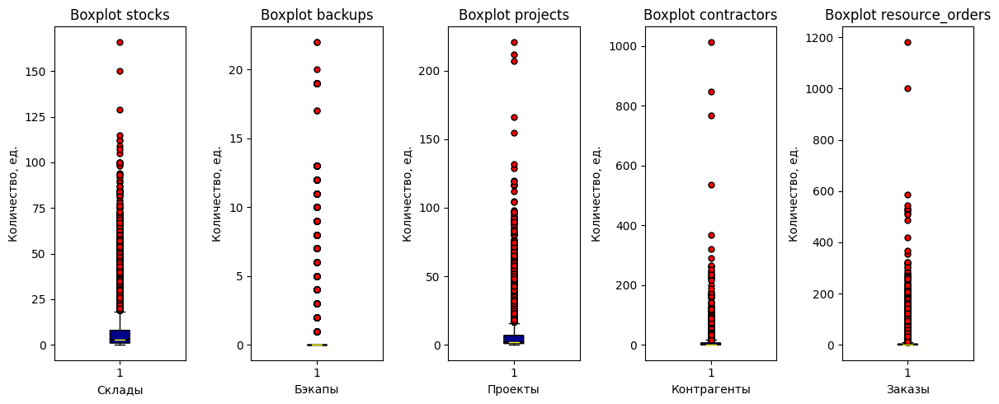

In [16]:
# Веведем боксплоты с описательной статистикой по столбцам датафрейма activities (в один ряд для большей наглядности)

# Создаем общую фигуру и пять подграфиков (1 строка, 5 столбцов)
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(12, 5), sharey=False)  # Устанавливаем sharey=False

# вызываем функцию boxplot_charts к каждому столбцу
maker_boxplot(activities, 'stocks', axes[0], 'Склады')
maker_boxplot(activities, 'backups', axes[1], 'Бэкапы')
maker_boxplot(activities, 'projects', axes[2], 'Проекты')
maker_boxplot(activities, 'contractors', axes[3], 'Контрагенты')
maker_boxplot(activities, 'resource_orders', axes[4], 'Заказы')

# Регулируем расположение подграфиков, чтобы они были близко друг к другу
plt.tight_layout()

# Отображение графиков
plt.show()

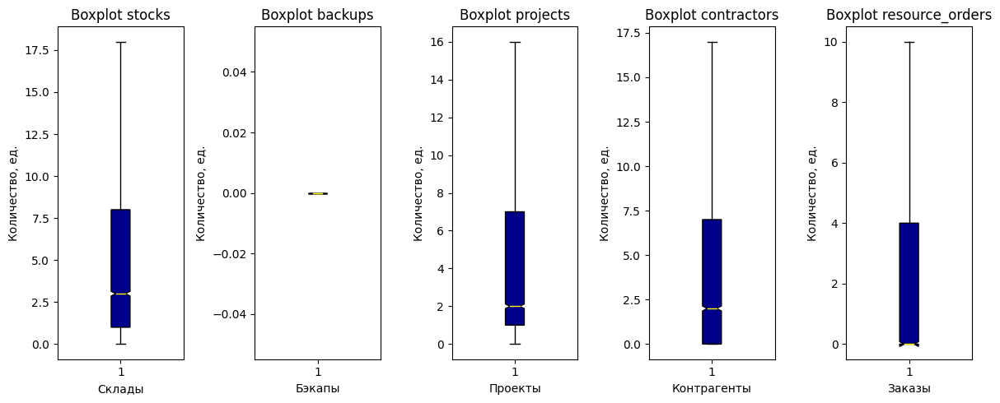

In [17]:
# Веведем боксплоты по столбцам датафрейма activities без усов (для большей наглядности)

# Создаем общую фигуру и пять подграфиков (1 строка, 5 столбцов)
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(12, 5), sharey=False)  # Устанавливаем sharey=False

# Добавляем параметр x_label для указания разной размерности оси x
maker_boxplot(activities, 'stocks', axes[0], 'Склады', False)
maker_boxplot(activities, 'backups', axes[1], 'Бэкапы', False)
maker_boxplot(activities, 'projects', axes[2], 'Проекты', False)
maker_boxplot(activities, 'contractors', axes[3], 'Контрагенты', False)
maker_boxplot(activities, 'resource_orders', axes[4], 'Заказы', False)

# Регулируем расположение подграфиков, чтобы они были близко друг к другу
plt.tight_layout()

# Отображение графиков
plt.show()

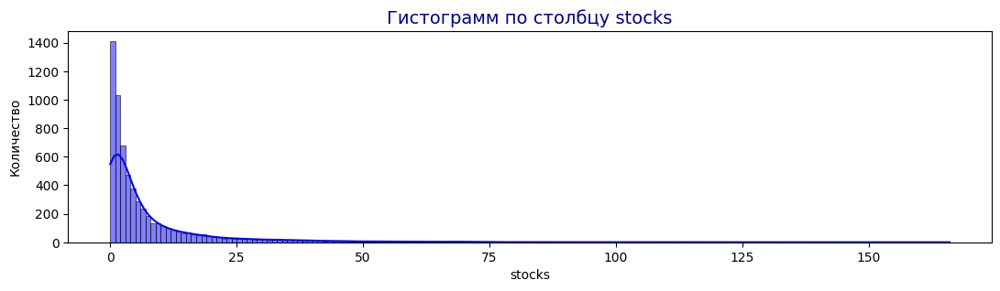

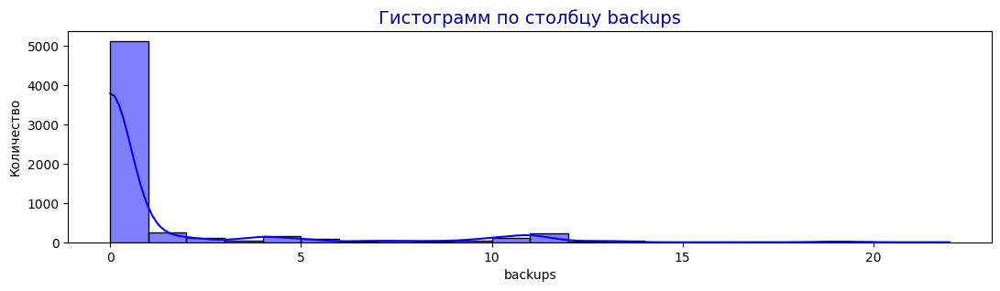

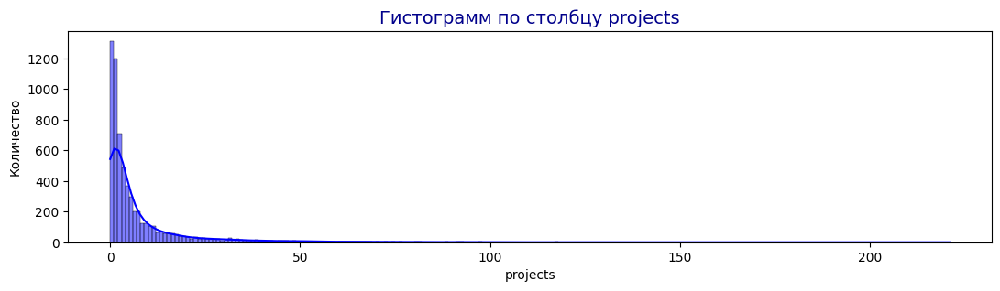

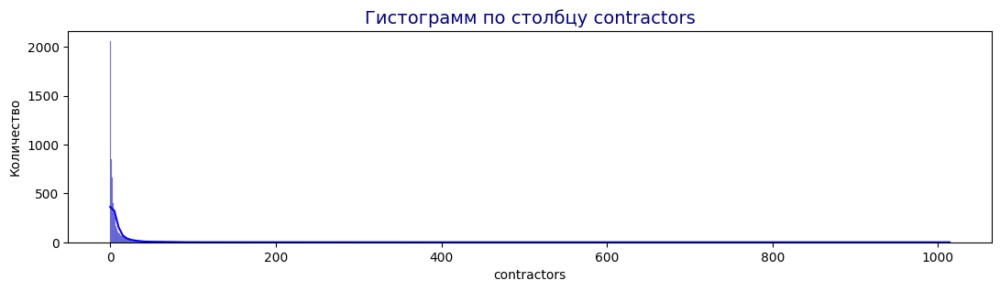

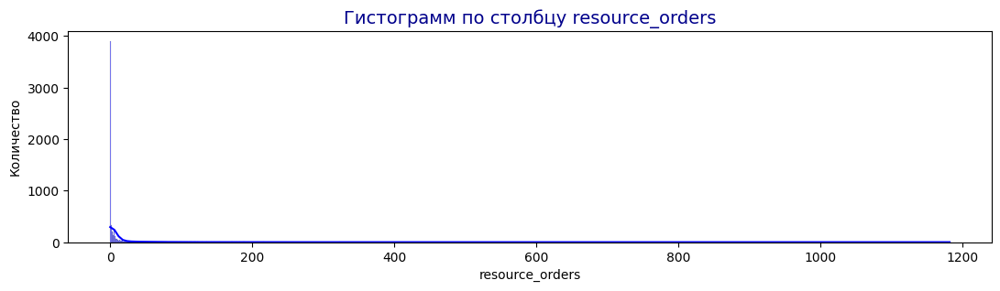

In [18]:
# Построим гистограммы по столбцам датафрейма activities
for i in list(activities.iloc [:, 3:].columns):
    maker_hist(activities[i], activities[i].max())

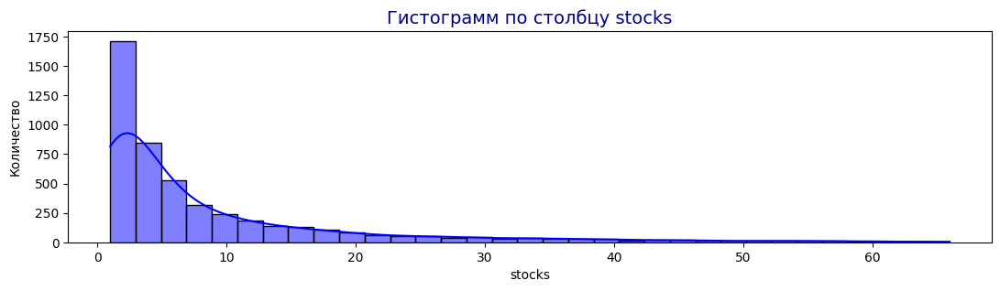

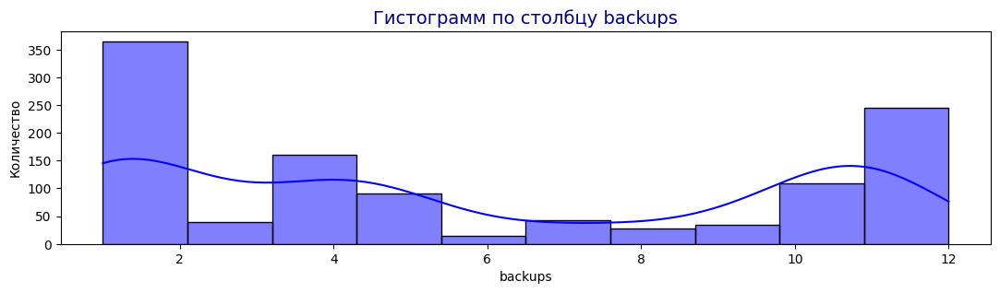

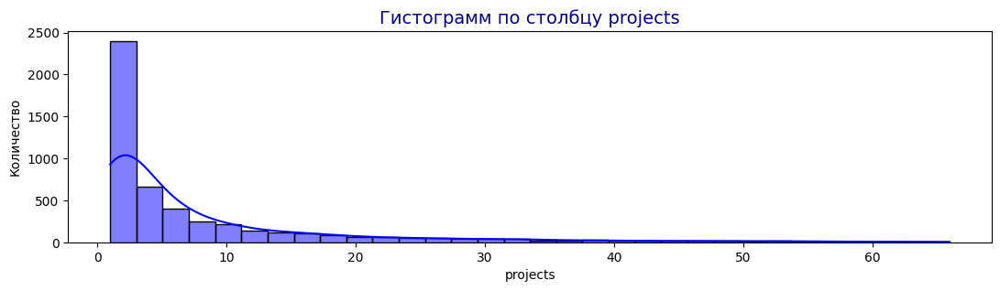

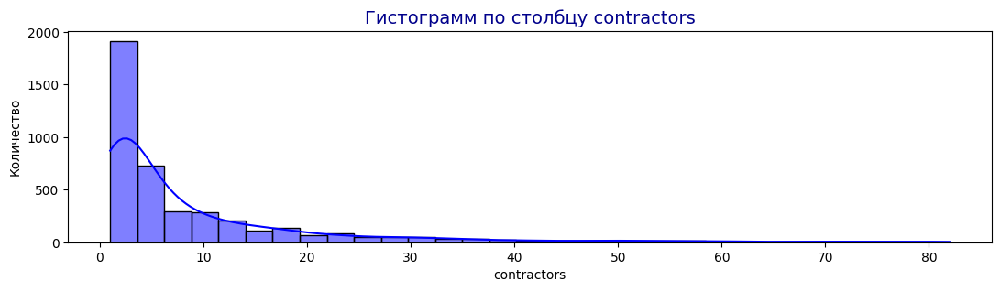

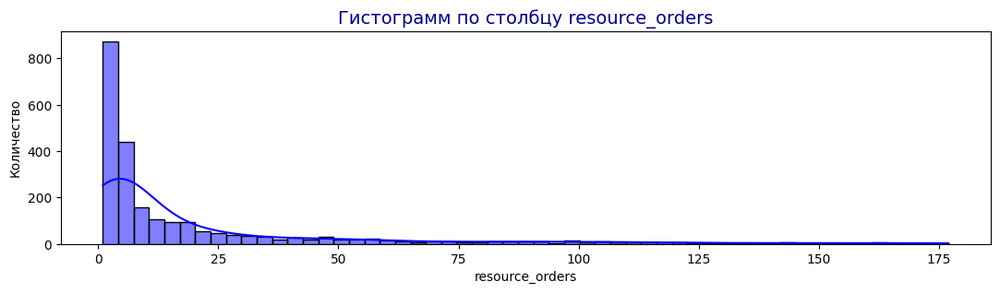

In [19]:
# Построим гистограммы по столбцам датафрейма activities, для значений > 0 и < 99 персентиля
for i in list(activities.iloc [:, 3:].columns):
    maker_hist(activities.loc[((activities[i]>0) & (activities[i]<=int(np.percentile(activities[i], 99)))), i], int(np.percentile(activities[i], 95)))

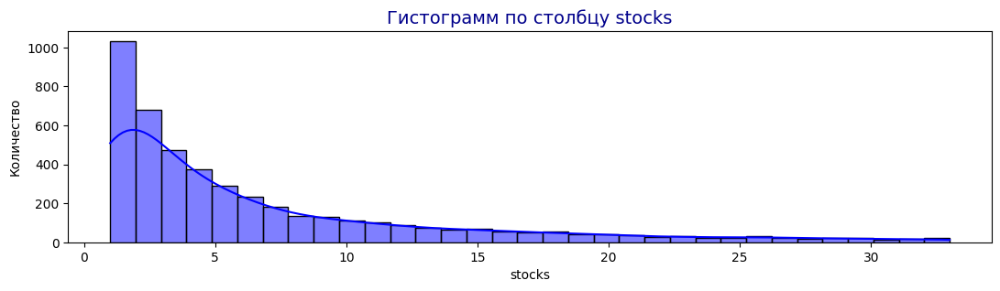

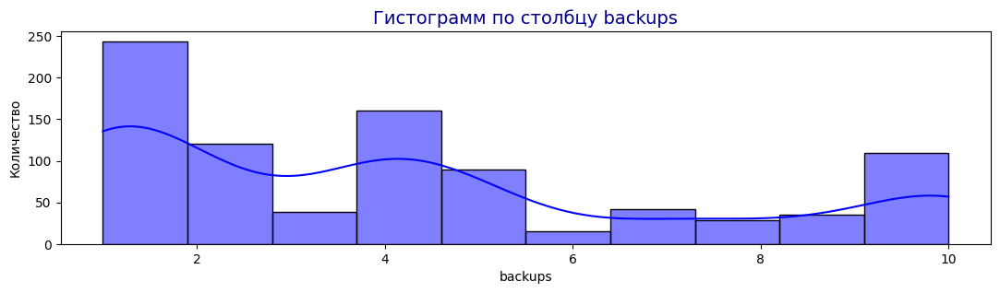

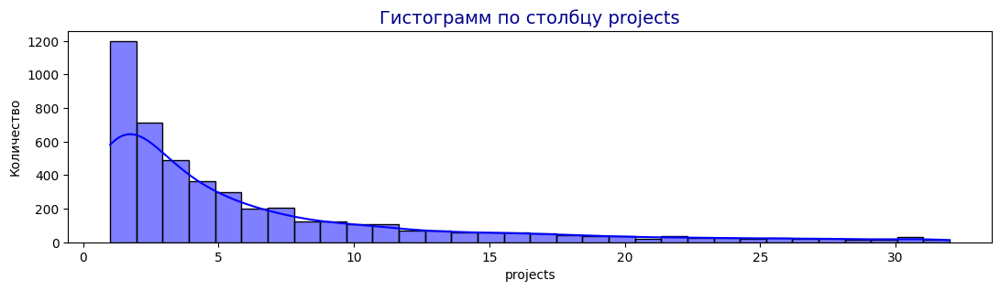

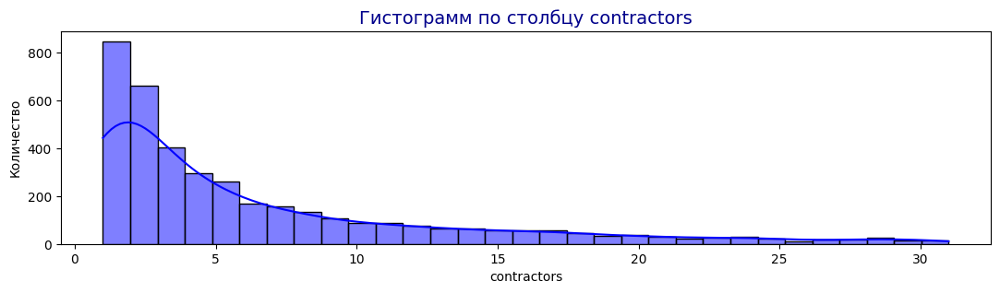

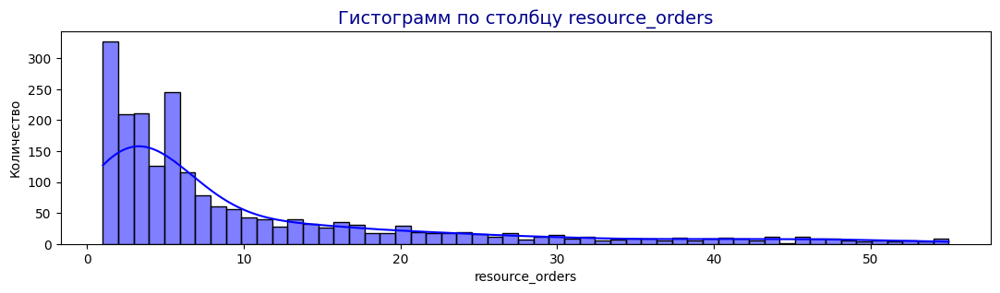

In [20]:
# Построим гистограммы по столбцам датафрейма activities, для значений > 0 и < 95 персентиля
for i in list(activities.iloc [:, 3:].columns):
    maker_hist(activities.loc[((activities[i]>0) & (activities[i]<=int(np.percentile(activities[i], 95)))), i], int(np.percentile(activities[i], 95)))

In [21]:
# Посмотрим на выбросы по столбцу resource_orders
activities.loc[activities['resource_orders']>400]

,company_id,month,billing,stocks,backups,projects,contractors,resource_orders
697,3224,2022-07-01 00:00:00+00:00,1,8,0,44,24,1182
2156,1682,2021-10-01 00:00:00+00:00,0,49,0,49,39,586
2698,3079,2021-09-01 00:00:00+00:00,0,9,0,31,73,419
2765,3224,2022-06-01 00:00:00+00:00,0,18,0,19,29,1002
2766,3224,2022-08-01 00:00:00+00:00,0,14,0,25,17,486
2767,3224,2022-09-01 00:00:00+00:00,0,19,0,33,28,528
2774,3224,2023-04-01 00:00:00+00:00,0,12,0,7,19,514
2777,3224,2023-07-01 00:00:00+00:00,0,14,0,11,20,526
2781,3224,2023-12-01 00:00:00+00:00,0,7,0,117,10,509
2782,3224,2024-01-01 00:00:00+00:00,0,14,0,21,17,532


In [22]:
# Посмотрим на выбросы по столбцу contractors
activities.loc[activities['contractors']>400]

,company_id,month,billing,stocks,backups,projects,contractors,resource_orders
818,3674,2021-07-01 00:00:00+00:00,3,5,0,3,767,5
1400,7423,2023-03-01 00:00:00+00:00,2,0,0,1,847,5
4222,5790,2023-11-01 00:00:00+00:00,0,2,0,1,1014,142
5251,9243,2023-12-01 00:00:00+00:00,0,73,0,8,536,1


In [23]:
# Посмотрим как изменится датасет, если обрезать его по 99 персентилю
activities2 = (
    activities.loc[(activities['billing']<=int(np.percentile(activities['billing'], 99)))
    & (activities['stocks']<=int(np.percentile(activities['stocks'], 99)))
    & (activities['backups']<=int(np.percentile(activities['backups'], 99)))
    & (activities['projects']<=int(np.percentile(activities['projects'], 99)))
    & (activities['contractors']<=int(np.percentile(activities['contractors'], 99)))
    & (activities['resource_orders']<=int(np.percentile(activities['resource_orders'], 99)))]
)
activities2.describe()

,company_id,billing,stocks,backups,projects,contractors,resource_orders
count,"6,028.00","6,028.00","6,028.00","6,028.00","6,028.00","6,028.00","6,028.00"
mean,"4,270.26",0.35,6.32,0.99,6.04,5.59,6.86
std,"2,414.30",0.68,9.89,2.71,9.65,10.33,20.24
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"2,431.00",0.00,1.00,0.00,1.00,0.00,0.00
50%,"4,205.50",0.00,2.00,0.00,2.00,2.00,0.00
75%,"6,036.00",1.00,7.00,0.00,7.00,6.00,3.00
max,"9,931.00",3.00,66.00,12.00,65.00,82.00,177.00


In [24]:
# Рассчитаем % удаленных строк activities2
activities2['company_id'].count()/activities['company_id'].count()*100

95.4401519949335

In [25]:
# Выведем уникальное количество компаний activities2
activities2['company_id'].nunique()

715

In [26]:
# Найдем id утраченной компании
set(activities['company_id'].unique()) - set(activities2['company_id'].unique())

{3277}

In [27]:
# Посмотрим как изменится датасет, если обрезать его по 95 персентилю
activities3 = (
    activities.loc[(activities['billing']<=int(np.percentile(activities['billing'], 95)))
    & (activities['stocks']<=int(np.percentile(activities['stocks'], 95)))
    & (activities['backups']<=int(np.percentile(activities['backups'], 95)))
    & (activities['projects']<=int(np.percentile(activities['projects'], 95)))
    & (activities['contractors']<=int(np.percentile(activities['contractors'], 95)))
    & (activities['resource_orders']<=int(np.percentile(activities['resource_orders'], 95)))]
)
activities3.describe()

,company_id,billing,stocks,backups,projects,contractors,resource_orders
count,"5,162.00","5,162.00","5,162.00","5,162.00","5,162.00","5,162.00","5,162.00"
mean,"4,257.89",0.33,4.55,0.56,4.34,3.61,3.16
std,"2,412.90",0.60,6.13,1.81,5.93,5.53,7.99
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"2,409.00",0.00,1.00,0.00,1.00,0.00,0.00
50%,"4,211.00",0.00,2.00,0.00,2.00,1.00,0.00
75%,"6,031.00",1.00,6.00,0.00,5.00,5.00,2.00
max,"9,931.00",2.00,33.00,10.00,32.00,31.00,55.00


In [28]:
# Рассчитаем % удаленных строк activities3
activities3['company_id'].count()/activities['company_id'].count()*100

81.72894236858771

In [29]:
# Выведем уникальное количество компаний activiti

_________________
_________________________
**Промежуточные выводы:**

- распределение признаков не является нормальным;
- большое количество нулевых активностей;
- медиана по всем признакам приходится на промежуток 0-3;
- среднее  по всем признакам приходится на промежуток 1-10;
- есть существенные выбросы справа, что приводит к большой разнице между средним и медианным значением по столбцу;
- минимальное std 1.18 имеет столбец backups;
- максимальное std 40.57 имеет столбец resource_orders.

Природа выбросов не известна.

Причинами выбросов могут быть:
- технический сбой;
- ошибка ручного ввода;
- учет неуникальных значений в столбце contractors;
- существенные различия в поведении пользователей.

В столбце contractors присутствует абсурдное значение - 1014 контрагентов, при этом в базе всего 716 компаний, а активностей у компании, имеющей 1014 контагентов, всего 145.

В столбце resource_orders экстремально высокую активность показывет одна и та же компания - id 3224, что тоже вызывает сомнения в достоверности информации.

Если обрезать данные по 99 персентилю, распределение становится более реалистичным, при этом потеряно будет примерно 5% строк и одна компания.

**Так как отсутствует возможность разобраться в истинной природе выбросов, обрежем данные по 99 персентилю.**

Второй существенный вопрос нужны ли нам данные за 2019-2024 гг. или достаточно для целей проекта ограничиться изучением 2023 года.

На данном этапе не вижу необходимости в удалении данных по временному признаку, так как:
- при сегментации клиентов мы будем учитывать дату последней активности и клиенты неработавшие более года автоматически попадут в сегмент отточных клиентов;
- для анализа причин оттока интересен показатель длительности пользования сервисом Gectaro;
- отточные клиенты могут быть интересны с точки зрения их возврата на обслуживание.
________________
_______________

In [30]:
# Обрежем  датафрейм activities по 99 персентилю
activities = (
    activities.loc[(activities['billing']<=int(np.percentile(activities['billing'], 99)))
    & (activities['stocks']<=int(np.percentile(activities['stocks'], 99)))
    & (activities['backups']<=int(np.percentile(activities['backups'], 99)))
    & (activities['projects']<=int(np.percentile(activities['projects'], 99)))
    & (activities['contractors']<=int(np.percentile(activities['contractors'], 99)))
    & (activities['resource_orders']<=int(np.percentile(activities['resource_orders'], 99)))]
)
activities.describe()

,company_id,billing,stocks,backups,projects,contractors,resource_orders
count,"6,028.00","6,028.00","6,028.00","6,028.00","6,028.00","6,028.00","6,028.00"
mean,"4,270.26",0.35,6.32,0.99,6.04,5.59,6.86
std,"2,414.30",0.68,9.89,2.71,9.65,10.33,20.24
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"2,431.00",0.00,1.00,0.00,1.00,0.00,0.00
50%,"4,205.50",0.00,2.00,0.00,2.00,2.00,0.00
75%,"6,036.00",1.00,7.00,0.00,7.00,6.00,3.00
max,"9,931.00",3.00,66.00,12.00,65.00,82.00,177.00


#### **2.1.5. Преобразования датафрейма activities**

In [31]:
# Проведем визуальный анализ датафрейма
activities.head(2)

,company_id,month,billing,stocks,backups,projects,contractors,resource_orders
0,1,2019-09-01 00:00:00+00:00,1,0,0,7,0,0
1,1,2019-12-01 00:00:00+00:00,1,0,0,2,1,0


In [32]:
# Создадим столбец с годом активности
activities['year'] = pd.DatetimeIndex(activities['month']).year
activities.head(2)

,company_id,month,billing,stocks,backups,projects,contractors,resource_orders,year
0,1,2019-09-01 00:00:00+00:00,1,0,0,7,0,0,2019
1,1,2019-12-01 00:00:00+00:00,1,0,0,2,1,0,2019


In [33]:
# Создадим столбец с суммарной активностью
activities['all_activities'] = (
                                activities['billing']
                                + activities['stocks']
                                + activities['backups']
                                + activities['projects']
                                + activities['contractors']
                                + activities['resource_orders']
)
activities.head(2)

,company_id,month,billing,stocks,backups,projects,contractors,resource_orders,year,all_activities
0,1,2019-09-01 00:00:00+00:00,1,0,0,7,0,0,2019,8
1,1,2019-12-01 00:00:00+00:00,1,0,0,2,1,0,2019,4


In [34]:
# Создадим временный датафрейм activities_years из агрегированного по году активности датафрейма activities
activities_years = (activities.groupby('year')
                    .agg({'company_id':'nunique', 'all_activities':'sum'}).reset_index()
)
activities_years.columns = ['year', 'count_company_id', 'all_activities']
activities_years

,year,count_company_id,all_activities
0,2019,36,479
1,2020,180,8899
2,2021,317,35921
3,2022,360,49692
4,2023,351,50687
5,2024,175,11945


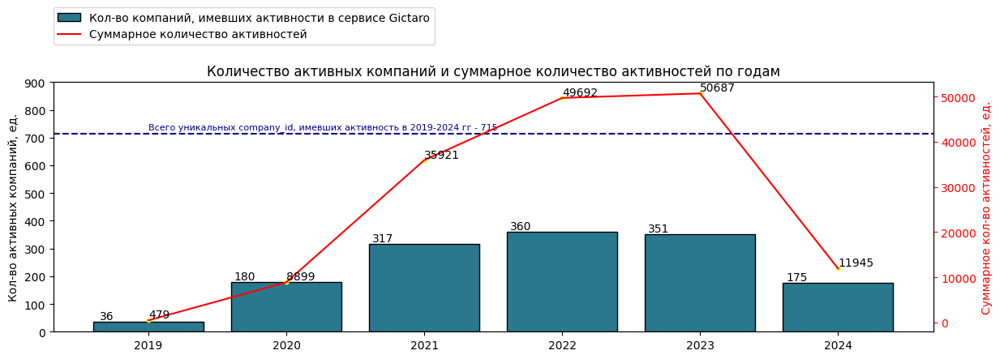

In [35]:
# Построим график количество активных компаний и суммарных активностей по годам
x_values = activities_years['year']
y1_values = activities_years['count_company_id']
y2_values = activities_years['all_activities']

fig, ax1 = plt.subplots(figsize=(14, 4))

q = activities['company_id'].nunique()
plt.axhline(y = q, color = 'darkblue', linestyle = '--')
ax1.text(2019, 730, f'Всего уникальных company_id, имевших активность в 2019-2024 гг - {q}', fontsize=8, color="darkblue")
bar1 = ax1.bar(x_values, y1_values, color='#2A788EFF', edgecolor = 'black', label='Кол-во компаний, имевших активности в сервисе Gictaro')
for bar in bar1:
    yval = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/8, yval, f'{yval:.0f}', ha='center', va='bottom', color='black', size = 10)

ax1.set_ylabel('Кол-во активных компаний, ед.')
plt.ylim(0, 900)

ax2 = ax1.twinx()
line2 = ax2.plot(x_values, y2_values, 'r', label='Суммарное количество активностей')  # График 2 на оси y2 (правая ось)
for i, val in enumerate(y2_values):
    ax2.scatter(x_values[i], y2_values[i], color='yellow', zorder=0.1, alpha=1.0, s = 10)
    ax2.text(x_values[i], val, f'{val:.0f}', ha='left', va='bottom', color='black',  rotation=0, size = 10)

ax2.set_ylabel('Суммарное кол-во активностей, ед.', color='r')
ax2.tick_params('y', colors='r')
ax1.grid(False)
ax2.grid(False)
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines = lines_1 + lines_2
labels = labels_1 + labels_2
plt.legend(lines, labels, loc=(0, 1.15))

plt.title('Количество активных компаний и суммарное количество активностей по годам')
plt.show()

__________
____________
**Промежуточный вывод:**
- в 2019-2021 - высокие темпы роста активных клиентов в сервисе (возможно влияние COVID-19);
- в 2022-2023 гг количество активных клиентов практически не растет: 317 - 351;
- в 2022-2023 гг существенно снизился темп прироста общего количества активностей.

Ситуация называется стагнацией.
___________
_________

In [36]:
# Создадим временный датасет activities_years_2 для построения столбиковой диаграммы
# Исключим из расчета 2024 год - он не полный и мешает правильному восприятию графика
activities_years_2 = (activities.loc[activities['year']!=2024].groupby('year')
                    .agg({'company_id':'nunique','billing':'sum',	'stocks':'sum',	'backups':'sum',	'projects':'sum',	'contractors':'sum',	'resource_orders':'sum'}).reset_index()
)
activities_years_2 = pd.melt(activities_years_2, id_vars=['year', 'company_id'], value_vars=['billing',	'stocks',	'backups',	'projects',	'contractors',	'resource_orders'])
activities_years_2['value2'] = round(activities_years_2['value']/activities_years_2['company_id'], 2)
activities_years_2.head(2)

,year,company_id,variable,value,value2
0,2019,36,billing,35,0.97
1,2020,180,billing,413,2.29


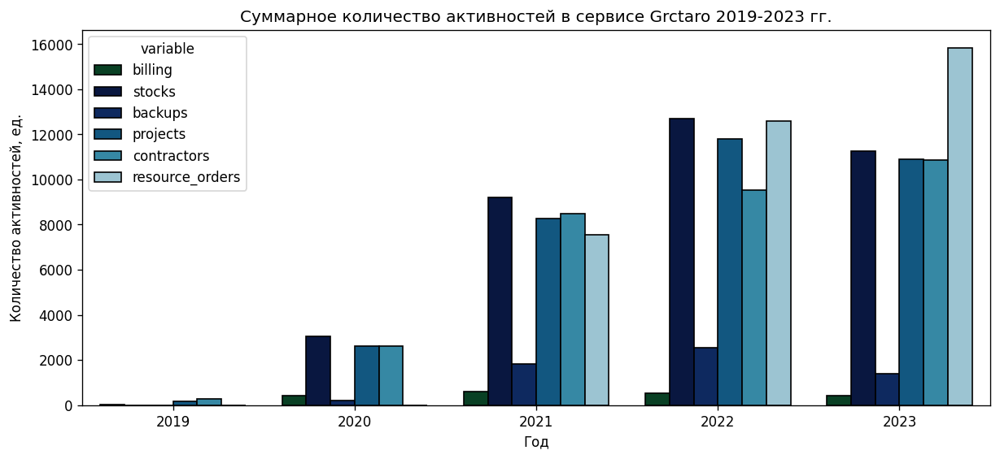

In [37]:
# Построим столбчатую диаграмму суммарное количество активностей по годам
plt.figure(figsize=(12, 5), dpi=120)
sns.barplot(activities_years_2, x="year", y="value", hue='variable', palette = 'ocean', edgecolor="black")
plt.xlabel('Год')
plt.ylabel('Количество активностей, ед.')
plt.title('Суммарное количество активностей в сервисе Grctaro 2019-2023 гг.')
plt.rcParams["axes.spines.right"] = False
plt.rcParams["axes.spines.top"] = False
plt.show();

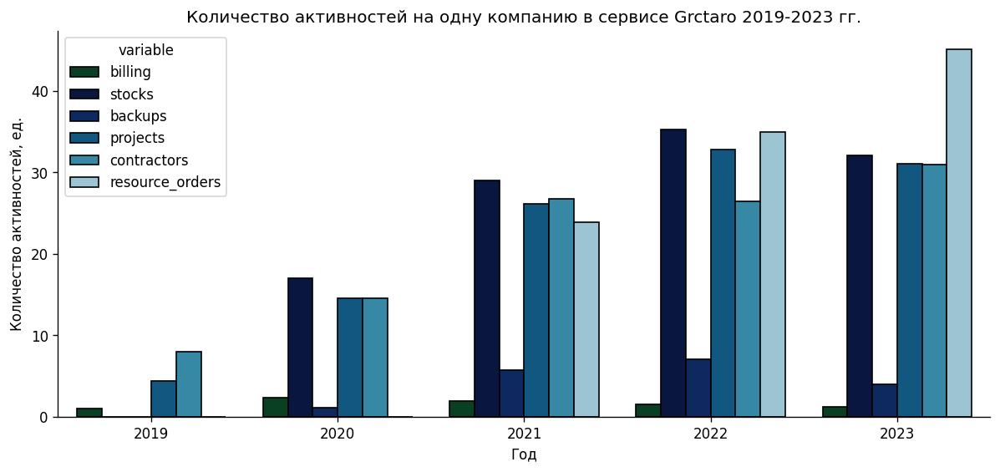

In [38]:
# Построим столбчатую диаграмму суммарное количество активностей на одну компанию по годам
plt.figure(figsize=(12, 5), dpi=120)
sns.barplot(activities_years_2, x="year", y="value2", hue='variable', palette = 'ocean', edgecolor="black")
plt.xlabel('Год')
plt.ylabel('Количество активностей, ед.')
plt.title('Количество активностей на одну компанию в сервисе Grctaro 2019-2023 гг.')
plt.show();

__________
__________
**Промежуточный вывод:**
- наибольший темп прироста имеют операции - заказы материалов;
- не плохую динамику показывают склады и проекты;
- не вызывают интереса клиентов счета, возможно, это связано с высокой конкуренцией на рынке.
__________
__________

In [39]:
# Создадим временный датафрейм companies1, в котором будем накапливать существенные для целей ТЗ признаки
# Столбец work_years - количество активных лет компании в сервисе Gectaro
# Столбец work_months - количество активных месяцев компании в сервисе Gectaro
# Столбец last_month - последний активный месяц компании в сервисе Gectaro
companies1 = (
    activities.sort_values(by = ['company_id', 'month']).groupby('company_id')
    .agg({'year':'nunique', 'month':'last', 'billing':'sum', 'stocks':'sum','backups':'sum', 'projects':'sum', 'contractors':'sum', 'resource_orders':'sum', 'all_activities':'sum'})
    .reset_index()
)
companies1.columns = ['company_id', 'work_years', 'last_month', 'all_billing', 'all_stocks', 'all_backups', 'all_projects', 'all_contractors', 'all_resource_orders', 'all_activities']
companies1.head()

,company_id,work_years,last_month,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities
0,1,2,2020-11-01 00:00:00+00:00,3,58,17,56,16,0,150
1,21,5,2023-05-01 00:00:00+00:00,21,84,0,83,127,15,330
2,30,3,2021-11-01 00:00:00+00:00,11,62,3,61,142,0,279
3,108,3,2022-12-01 00:00:00+00:00,4,10,1,10,21,0,46
4,116,3,2021-11-01 00:00:00+00:00,5,52,0,50,61,69,237


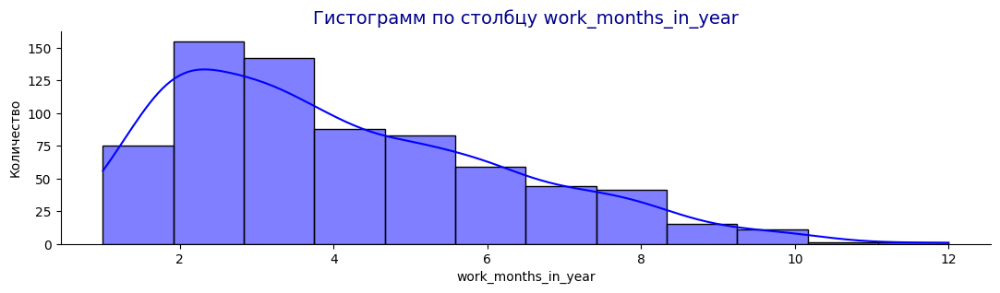

In [40]:
# Интересно посмотреть сколько в среднем месяцев в году компании проявляли активность в сервисе Gectaro
temp = (
    activities.groupby('company_id')
    .agg({'year':'nunique', 'month':'count'})
    .reset_index()
)
temp['work_months_in_year'] = round(temp['month']/temp['year'], 2)
maker_hist(temp['work_months_in_year'], n=12)

____________
Наибольшее количество компаний проявляют активность в сервесе Gectaro - 2-3 месяца в году.

Ежемесячно сервис практически никто из компаний не использует.

Возможно, это приводит к оттоку.
_______________

In [41]:
# Создадим временный датафрейм companies2 с общим количеством активностей за 2023 г в разрезе компаний
companies2 = (
    activities.loc[activities['year']==2023].groupby('company_id')
    .agg({'all_activities':'sum'})
    .reset_index()
)
companies2.columns = ['company_id', 'all_activities_2023']
companies2.head()

,company_id,all_activities_2023
0,21,150
1,336,12
2,383,15
3,408,604
4,495,2


In [42]:
# Создадим временный датафрейм companies2 с общим количеством активностей за 2024 г в разрезе компаний
companies3 = (
    activities.loc[activities['year']==2024].groupby('company_id')
    .agg({'all_activities':'sum'})
    .reset_index()
)
companies3.columns = ['company_id', 'all_activities_2024']
companies3.head()

,company_id,all_activities_2024
0,628,13
1,858,4
2,1088,18
3,1255,127
4,1640,15


In [43]:
# Добавим данные об общем количестве активностей в 2023-2024 гг в датафрейм companies1
companies1 = pd.merge(companies1, companies2, how = 'left', on = 'company_id')
companies1 = pd.merge(companies1, companies3, how = 'left', on = 'company_id')
companies1 = companies1.fillna(0)
companies1.head()

,company_id,work_years,last_month,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024
0,1,2,2020-11-01 00:00:00+00:00,3,58,17,56,16,0,150,0.00,0.00
1,21,5,2023-05-01 00:00:00+00:00,21,84,0,83,127,15,330,150.00,0.00
2,30,3,2021-11-01 00:00:00+00:00,11,62,3,61,142,0,279,0.00,0.00
3,108,3,2022-12-01 00:00:00+00:00,4,10,1,10,21,0,46,0.00,0.00
4,116,3,2021-11-01 00:00:00+00:00,5,52,0,50,61,69,237,0.00,0.00


In [44]:
# Изучим общую информацию по датафрейму companies1
companies1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 715 entries, 0 to 714
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   company_id           715 non-null    int64              
 1   work_years           715 non-null    int64              
 2   last_month           715 non-null    datetime64[ns, UTC]
 3   all_billing          715 non-null    int32              
 4   all_stocks           715 non-null    int32              
 5   all_backups          715 non-null    int32              
 6   all_projects         715 non-null    int32              
 7   all_contractors      715 non-null    int32              
 8   all_resource_orders  715 non-null    int32              
 9   all_activities       715 non-null    int32              
 10  all_activities_2023  715 non-null    float64            
 11  all_activities_2024  715 non-null    float64            
dtypes: datetime64[ns, UTC]

### **2.2. EDA датафрейм billing**

#### **2.2.1. Анализ столбцов (признаков) датафрейма billing**

In [45]:
# Проведем визуальный анализ датафрейма
billing.head(2)

,id,user_id,company_id,billing_tariff_id,payed_until,is_payed,created_at,updated_at,billing_tariff_price_id,comment,pay_date
0,3050,567,512,3,1640153302,False,1608617302,1608617302,12.00,NaN,NaN
1,3051,2861,2474,7,1640131200,True,1608626162,1608626181,23.00,NaN,"1,608,626,181.00"


In [46]:
# Проверим наличие тестовых, бесплатных и пробных тарифов 1, 18, 22
# По условиям ТЗ их не должно быть в исходных данных
# Если счета с тарифами 1, 8, 22 будут выявлены - это ошибка
billing.loc[billing['billing_tariff_id'].isin([1, 18, 22])]

,id,user_id,company_id,billing_tariff_id,payed_until,is_payed,created_at,updated_at,billing_tariff_price_id,comment,pay_date


_________
Тестовые, бесплатные и пробные тарифы 1, 18, 22 отсутствуют в датафрейме billing.
____________

In [47]:
# Объявим функцию для создания столбца с типом тарифа
def type_tariff_maker(row):
    if row['billing_tariff_id'] in [4, 7, 6, 11, 19]:
        return 'старт'
    elif row['billing_tariff_id'] in [2, 17]:
        return 'базовый'
    elif row['billing_tariff_id'] in [9, 20]:
        return 'бизнес'
    elif row['billing_tariff_id'] in [3, 10, 13, 21]:
        return 'профи'

In [48]:
# Создадим столбец 'type_tariff' в датафрейме billing
billing['type_tariff'] = billing.apply (type_tariff_maker, axis=1)
billing.head(2)

,id,user_id,company_id,billing_tariff_id,payed_until,is_payed,created_at,updated_at,billing_tariff_price_id,comment,pay_date,type_tariff
0,3050,567,512,3,1640153302,False,1608617302,1608617302,12.00,NaN,NaN,профи
1,3051,2861,2474,7,1640131200,True,1608626162,1608626181,23.00,NaN,"1,608,626,181.00",старт


__________
_________
**Промежуточный ввод:**
Столбцы датафрейма billing:

- **id** - индификатор счета;
- **user_id** - идентификатор пользователя;
- **company_id** - идентификатор компании пользователя;
- **billing_tariff_id** - тарифный план;
- **payed_until** - дата, до которой подписка компании действует;
- **is_payed** - статус оплаты;
- **created_at** - дата создания;
- **updated_at** - дата обновления;
- **billing_tariff_price_id** - id стоимости тарифа;
- **comment** - комментарии;
- **pay_date** - дата платежа;
- **type_tariff** - тип тарифа.
_____________
_____________

#### **2.2.2. Анализ типов данных столбцов датафрейма billing**

In [49]:
# Изучим общую информацию по датафрейму
billing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3480 entries, 0 to 3479
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       3480 non-null   int64  
 1   user_id                  3480 non-null   int64  
 2   company_id               3480 non-null   int64  
 3   billing_tariff_id        3480 non-null   int64  
 4   payed_until              3480 non-null   int64  
 5   is_payed                 3480 non-null   bool   
 6   created_at               3480 non-null   int64  
 7   updated_at               3480 non-null   int64  
 8   billing_tariff_price_id  3480 non-null   float64
 9   comment                  745 non-null    object 
 10  pay_date                 1108 non-null   float64
 11  type_tariff              3480 non-null   object 
dtypes: bool(1), float64(2), int64(7), object(2)
memory usage: 302.6+ KB


_______
_______
**Промежуточный вывод:**

столбцы user_id, comment, updated_at не нужны для анализа.

По условиям ТЗ для определения действующего клиента используем формулу: is_payed == True и pay_date самая поздняя.

Если payed_until больше, чем сегодняшняя дата - компания может считаться действующим клиентом.
________
_________

In [50]:
# Удалим столбцы user_id, comment, updated_at
billing.drop(['user_id', 'comment', 'updated_at'], axis= 1 , inplace= True )

_____________
______________

Приведем тип данных в соответствие с характером данных:

- в столбце billing_tariff_price_id заменим тип данных с float64 на int32;
- в столбцах payed_until, pay_date, created_at заменим тип данных с object на datetime.

____________
___________

In [51]:
# Выполним и проконтролируем замену типа данных в столбцах
billing[['payed_until', 'pay_date', 'created_at']] = billing[['payed_until','pay_date', 'created_at']].apply(pd.to_datetime, unit='s')
billing['billing_tariff_price_id'] = billing['billing_tariff_price_id'].astype('int32')
billing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3480 entries, 0 to 3479
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   id                       3480 non-null   int64         
 1   company_id               3480 non-null   int64         
 2   billing_tariff_id        3480 non-null   int64         
 3   payed_until              3480 non-null   datetime64[ns]
 4   is_payed                 3480 non-null   bool          
 5   created_at               3480 non-null   datetime64[ns]
 6   billing_tariff_price_id  3480 non-null   int32         
 7   pay_date                 1108 non-null   datetime64[ns]
 8   type_tariff              3480 non-null   object        
dtypes: bool(1), datetime64[ns](3), int32(1), int64(3), object(1)
memory usage: 207.4+ KB


#### **2.2.3. Автоматический EDA датафрейма billing (pandas profiling )**

In [52]:
# Сформируем отчет pandas profiling
profile2 = ProfileReport(billing, title="Pandas Profiling Report")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
# Количество уникальных company_id со статусом is_payed True
billing.loc[billing['is_payed'] == True]['company_id'].nunique()

779

____________
_________
**Промежуточный вывод:**

В датафрейме billing:

- 7 столбцов;
- 3480 строк;
- полных дубликатов нет;
- пропуски в столбце:
  - pay_date - 68,2%;
- в столбце company_id 1841 уникальных значений;
- в столбце billing_tariff_id 8 уникальных значений;
- значения в столбце created_at с 23.07.2019 по 13.03.2024 г.;
- значения в столбце payed_until с 11.09.2019 по 10.04.2033 г.;
- в столбце type_tariff - 4 типа тарифов:
  - самый распространенный тип тарифа - базовый (1573);
  - самый редкий -профи(194);
- в столбце is_payed 2364 значения False, 1116 - True (согласно ТЗ столбец не даеь правильного разделения на действующих и отточных клиентов);
- в столбце pay_date данные с 16.12.2020 по 15.03.2024.

В датафреймах billing и activities есть различия:

- в activities 716 уникальных company_id, в billing - 1841 (из них со статусом is_payed True - 779);
- в activities данные за период с 01.01.2019 по 01.03.2024 гг, в billing - с 23.07.2019 по 13.03.2024 г.


___________
____________

#### **2.2.4. Преобразования датафрейма billing**

_____________
____________
**Важно:**

В исходных данных много нестыковок.

В рамках данного анализа приняты следующие условия определения целевого показателя - **действующий/отточный клиент**:
- действующий клиент:
  - есть дата платежа pay_date;
  - payed_until - дата до которой оплачена подписка больше текущей даты* (даты проведения анализа);
  - is_payed = True.
- отточный клиент:
  - дата платежа pay_date = NaT;
  - payed_until - дата до которой оплачена подписка меньше или равна текущей даты* (даты проведения анализа);
  - is_payed = False.

(* текущая дата = billing['pay_date'].max() + timedelta(days=1) = 16.03.2024)

___________
_____________

In [54]:
# Выберем в качестве текущей даты (для расчета кол-ва дней от события до текущей даты == условной даты)
# billing['pay_date'].max() + timedelta(days=1)
last_date = billing['pay_date'].max() + timedelta(days=1)
last_date

Timestamp('2024-03-16 00:00:00')

In [55]:
# Найдем строки, у которых payed_until меньше либо равно created_at
# Таких строк всего 14
# Они не укладываются в мою логику, где payed_until - дата по которую действует оплаченный тариф
# Здесь же лажа с is_payed: True при отсутствии даты оплаты и False при наличие даты оплаты
# Удалю эти строки
billing.loc[billing['payed_until']<=billing['created_at']]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff
948,1388,1154,2,2020-05-26,True,2020-05-26 08:23:29,8,NaT,базовый
2458,8751,5817,2,2022-06-27,False,2022-06-27 09:00:04,24,2022-06-27,базовый
2462,8777,6256,7,2022-06-29,False,2022-06-29 11:55:43,26,2022-06-29,старт
2636,9563,3524,7,2022-10-28,True,2022-10-28 10:59:56,23,2022-10-28,старт
2835,10306,6939,4,2023-02-27,False,2023-02-27 14:17:16,16,2023-02-28,старт
2837,10311,2316,4,2023-02-28,False,2023-02-28 06:36:48,16,2023-02-28,старт
2894,10587,6036,7,2023-03-31,False,2023-03-31 10:24:22,26,2023-03-31,старт
2923,10776,6411,2,2023-04-21,False,2023-04-21 13:32:36,24,NaT,базовый
2941,10868,3464,10,2023-05-03,True,2023-05-03 09:29:43,32,2023-05-03,профи
2986,11134,2391,10,2023-06-09,True,2023-06-09 09:37:02,32,2023-06-09,профи


In [56]:
# Удалим строки, у которых payed_until меньше либо равно created_at
billing = billing.loc[billing['payed_until']>billing['created_at']]
billing.loc[billing['payed_until']<=billing['created_at']]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff


In [57]:
# Рассчитаем разницу между created_at и датой payed_until - на какой срок оплачен тариф
billing['created_at'] = pd.DatetimeIndex(billing['created_at']).date
billing['payed_until'] = pd.DatetimeIndex(billing['payed_until']).date
billing['pay_date'] = pd.DatetimeIndex(billing['pay_date']).date
billing['work_period_tariff'] = billing['payed_until'] - billing['created_at']
billing['work_period_tariff'] = billing['work_period_tariff'].apply(lambda x: x.days)
billing.head(2)

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff
0,3050,512,3,2021-12-22,False,2020-12-22,12,NaT,профи,365
1,3051,2474,7,2021-12-22,True,2020-12-22,23,2020-12-22,старт,365


In [58]:
# Выведем статистику по billing_tariff_id в разрезе 'billing_tariff_price_id'
tariff0 = billing.sort_values(by = ['created_at', 'payed_until']).groupby(['billing_tariff_id', 'billing_tariff_price_id']).agg({'created_at':['min', 'max'], 'payed_until':['min','max'], 'work_period_tariff':['min', 'median', 'max']})
tariff0.head(20)

created_at             payed_until  \
                                                  min         max         min   
billing_tariff_id billing_tariff_price_id                                       
2                 1                        2019-07-23  2023-05-18  2019-09-11   
                  6                        2019-07-23  2023-04-02  2019-10-11   
                  7                        2019-09-09  2022-09-06  2020-03-09   
                  8                        2019-08-13  2024-03-13  2020-08-14   
                  24                       2021-03-03  2024-02-14  2021-03-05   
                  35                       2021-07-02  2024-01-17  2021-07-29   
3                 9                        2019-07-23  2021-08-31  2019-10-09   
                  10                       2019-07-26  2020-11-30  2019-12-09   
                  11                       2019-09-09  2021-02-02  2020-03-10   
                  12                       2019-08-13  2021-08-11  2020-08-14   
                  25                       2021-03-23  2022-05-04  2022-11-26   
                  54                       2024-03-04  2024-03-11  2025-03-04   
4                 13                       2019-09-25  2023-02-17  2019-11-15   
                  14                       2019-08-02  2023-04-12  2019-11-11   
                  15                       2019-07-26  2022-11-03  2020-01-26   
                  16                       2019-07-24  2023-02-28  2020-07-26   
6                 17                       2020-03-30  2023-01-27  2020-10-01   
                  18                       2020-04-07  2021-11-11  2021-04-09   
                  19                       2021-05-24  2022-07-06  2023-07-05   
                  27                       2021-03-15  2021-04-01  2022-10-01   

                                                      work_period_tariff  \
                                                  max                min   
billing_tariff_id billing_tariff_price_id                                  
2                 1                        2026-01-05                  5   
                  6                        2023-12-15                  7   
                  7                        2023-12-02                  5   
                  8                        2027-06-08                  1   
                  24                       2026-02-04                  2   
                  35                       2026-06-02                  5   
3                 9                        2029-02-01                 30   
                  10                       2021-04-02                 44   
                  11                       2021-09-09                181   
                  12                       2023-02-12                  1   
                  25                       2023-11-04                546   
                  54                       2025-03-11                365   
4                 13                       2023-03-17                 28   
                  14                       2023-07-12                  1   
                  15                       2023-05-03                165   
                  16                       2024-06-04                  1   
6                 17                       2023-07-27                181   
                  18                       2023-07-02                365   
                  19                       2024-07-06                731   
                  27                       2023-01-11                548   

                                                        
                                          median   max  
billing_tariff_id billing_tariff_price_id               
2                 1                        33.00  1841  
                  6                        96.50   771  
                  7                       183.00   821  
                  8                       365.00  2034  
                  24           

In [59]:
# Выведем статистику по billing_tariff_id без 'billing_tariff_price_id'
tariff1 = billing.sort_values(by = ['created_at', 'payed_until']).groupby('billing_tariff_id').agg({'created_at':['min', 'max'], 'payed_until':['min','max'], 'work_period_tariff':['min', 'median', 'max']})
tariff1

created_at             payed_until              \
                          min         max         min         max   
billing_tariff_id                                                   
2                  2019-07-23  2024-03-13  2019-09-11  2027-06-08   
3                  2019-07-23  2024-03-11  2019-10-09  2029-02-01   
4                  2019-07-24  2023-04-12  2019-11-11  2024-06-04   
6                  2020-03-30  2023-01-27  2020-10-01  2024-07-06   
7                  2020-06-04  2024-03-12  2020-07-04  2033-04-10   
9                  2021-04-16  2024-03-10  2021-08-13  2026-12-14   
10                 2021-04-30  2024-03-11  2021-09-24  2026-01-11   
11                 2021-06-11  2023-02-07  2021-12-28  2023-08-07   
13                 2022-12-14  2024-01-15  2023-01-12  2025-07-31   
17                 2022-12-21  2024-03-12  2023-01-20  2025-03-29   
19                 2023-07-10  2024-02-28  2024-11-17  2025-07-18   
20                 2023-09-01  2024-02-27  2024-09-26  2026-06-12   
21                 2023-09-12  2023-09-12  2024-11-12  2024-11-12   

                  work_period_tariff               
                                 min median   max  
billing_tariff_id                                  
2                                  1 404.00  2034  
3                                  1  99.00  2968  
4                                  1  92.00   819  
6                                181 365.00   772  
7                                  1 366.00  4493  
9                                  2 546.00  1636  
10                                 3 495.50   842  
11                               181 183.00   200  
13                                 2 366.00   841  
17                                 7 365.50   731  
19                               366 395.50   731  
20                               366 414.00   896  
21                               427 427.00   427

__________
__________
**Промежуточный вывод:**


| Название | Номер | Первая дата | Последняя дата| Срок (медиана) |
|---------------|-------------------|-------------------|-------------------|-----------------|
|базовый             |2|2019-07-23|2027-06-08| 404 |
|профи              |3|2019-07-23|2029-02-01 | 99 |
|старт         |4|2019-07-24|2024-06-04| 92 |
|старт           |6|2020-03-30|2024-07-06| 365 |
|старт            |7|2020-06-04|2033-04-10| 366
|бизнес            |9|2021-04-16|2026-12-14| 546 |
|профи            |10|2021-04-30|2026-01-11| 485 |
|старт              |11|2021-06-11	|2023-08-07| 183 |
|профи        |13|2022-12-14|2025-07-31| 366 |
|базовый          |17|2022-12-21|2025-03-29| 365 |
|старт            |19|2023-07-10|2025-07-18| 395 |
|бизнес            |20|2023-09-01|2026-06-12| 414 |
|профи            |21|2023-09-12|2024-11-12| 427 |

По первой дате выставления счета видно, что каждый год появляются новые тарифы.

У тарифов нет строго определенного срока действия.

Часть тарифов либо уже не предлагаются клиентам, либо невостребованы клиентами - последняя дата выставления счета более года назад.

Анализировать такое разнообразие тарифных планов можно только если в них разбираться. Без связи с клиентом это затруднительно.
_________
_________

In [60]:
# Распределение клиентов по тарифам
tariff2 = billing.pivot_table(index = 'billing_tariff_id', columns = 'billing_tariff_price_id', values = 'company_id', aggfunc = 'count')
tariff2 = tariff2.fillna('-')
tariff2

billing_tariff_price_id,1,2,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,40,41,42,43,44,47,48,54,60,61,66
billing_tariff_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,61.00,-,-,60.00,160.00,512.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,476.00,-,-,-,-,-,-,-,-,-,-,264.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-
3,-,-,-,-,-,-,37.00,24.00,6.00,18.00,-,-,-,-,-,-,-,-,-,-,-,-,4.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,2.00,-,-,-
4,-,-,-,-,-,-,-,-,-,-,95.00,83.00,18.00,44.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
6,-,-,-,-,-,-,-,-,-,-,-,-,-,-,5.00,8.00,2.00,-,-,-,-,-,-,-,2.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
7,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,61.00,61.00,86.00,556.00,-,-,222.00,-,-,-,-,-,-,-,164.00,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-
9,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,16.00,109.00,86.00,-,-,-,-,-,58.00,-,-,-,-,-,-,-,-,-,-,-,-,-
10,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,3.00,32.00,17.00,-,-,-,27.00,-,-,-,-,-,1.00,-,-,-,5.00,1.00,-
11,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,13.00,-,-,-,-,-,-,-,-,-,-,-
13,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,2.00,7.00,2.00,2.00,-,-,-,-,-,-,1.00


___________
__________
**Промежуточный вывод:**

Из таблицы видно сколько клиентов воспользовались тем или иным тарифов в разрезе billing_tariff_price_id.

Самые популярные тарифы:
- тариф 2 (старт) - 7, 8, 24, 35
- тариф 7 (базовый) - 23, 26, 34

__________________
______________

In [61]:
# Изучим поведение клиентов: 'pay_date', 'billing_tariff_id', 'billing_tariff_price_id'
# Таблица плохо читается из-за большого кол-ва полей
client_bill = billing.pivot_table(index = ['company_id', 'pay_date', 'payed_until'], columns = 'billing_tariff_id', values = 'billing_tariff_price_id')
client_bill = client_bill.fillna('-')
client_bill.columns = ['2 - базовый', '3 - профи',' 4 - старт', '6 - старт', '7 - старт', '9 - бизнес', '10 - профи', '11 - старт', '13 - профи', '17 - базовый', '19 - старт', '20 - бизнес', '21 - профи']
client_bill = client_bill[[' 4 - старт', '6 - старт', '7 - старт', '11 - старт', '19 - старт', '2 - базовый', '17 - базовый', '9 - бизнес', '20 - бизнес', '3 - профи', '10 - профи', '13 - профи', '21 - профи']]
client_bill.head(20)

4 - старт 6 - старт 7 - старт 11 - старт  \
company_id pay_date   payed_until                                             
5          2022-07-20 2022-08-14           -         -     23.00          -   
           2023-05-19 2024-11-19           -         -         -          -   
11         2022-06-16 2023-06-30           -         -         -          -   
           2022-07-15 2023-01-01           -         -         -      38.00   
21         2021-06-15 2021-07-15       13.00         -         -          -   
           2021-07-17 2021-08-17       13.00         -         -          -   
           2021-08-17 2022-04-05       13.00         -         -          -   
           2023-01-19 2023-04-30           -         -     23.00          -   
           2023-05-27 2023-05-27           -         -     23.00          -   
30         2020-12-22 2021-03-24           -         -         -          -   
           2021-03-25 2021-06-24       14.00         -         -          -   
           2021-06-23 2021-09-24       14.00         -         -          -   
108        2022-11-28 2022-12-05           -         -         -          -   
116        2021-05-13 2021-05-20           -         -         -          -   
           2021-08-02 2022-02-02           -         -     22.00          -   
309        2021-01-28 2021-05-01       14.00         -         -          -   
           2021-04-29 2021-07-30       14.00         -         -          -   
           2021-07-27 2022-04-10       14.00         -         -          -   
344        2021-03-12 2021-06-12       14.00         -         -          -   
366        2021-01-08 2021-02-08       13.00         -         -          -   

                                  19 - старт 2 - базовый 17 - базовый  \
company_id pay_date   payed_until                                       
5          2022-07-20 2022-08-14           -           -            -   
           2023-05-19 2024-11-19           -           -        25.00   
11         2022-06-16 2023-06-30           -           -            -   
           2022-07-15 2023-01-01           -           -            -   
21         2021-06-15 2021-07-15           -           -            -   
           2021-07-17 2021-08-17           -           -            -   
           2021-08-17 2022-04-05           -           -            -   
           2023-01-19 2023-04-30           -           -            -   
           2023-05-27 2023-05-27           -           -            -   
30         2020-12-22 2021-03-24           -           -            -   
           2021-03-25 2021-06-24           -           -            -   
           2021-06-23 2021-09-24           -           -            -   
108        2022-11-28 2022-12-05           -        8.00            -   
116        2021-05-13 2021-05-20           -        1.00            -   
           2021-08-02 2022-02-02           -           -            -   
309        2021-01-28 2021-05-01           -           -            -   
           2021-04-29 2021-07-30           -           -            -   
           2021-07-27 2022-04-10           -           -            -   
344        2021-03-12 2021-06-12           -           -            -   
366        2021-01-08 2021-02-08           -           -            -   

                                  9 - бизнес 20 - бизнес 3 - профи 10 - профи  \
company_id pay_date   payed_until                                               
5          2022-07-20 2022-08-14           -           -         -          -   
           2023-05-19 2024-11-19           -           -         -          -   
11         2022-06-16 2023-06-30       29.00           -         -          -   
           2022-07-15 2023-01-01           -           -         -          -   
21         2021-06-15 2021-07-15           -           -         -          -   
           2021-07-17 2021-08-17           -           -         -          -   
           2021-08-17 2022-04-05         

In [62]:
# Изучим поведение клиентов: 'pay_date', 'billing_tariff_id', 'billing_tariff_price_id'
# Сократим количество столбцов в таблице выше, объединив тарифы по типу
client_bill2 = billing.pivot_table(index = ['company_id', 'pay_date', 'payed_until'], columns = 'type_tariff', values = 'billing_tariff_price_id')
client_bill2 = client_bill2.fillna('-')
client_bill2.head(20)

type_tariff                       базовый бизнес профи старт
company_id pay_date   payed_until                           
5          2022-07-20 2022-08-14        -      -     - 23.00
           2023-05-19 2024-11-19    25.00      -     -     -
11         2022-06-16 2023-06-30        -  29.00     -     -
           2022-07-15 2023-01-01        -      -     - 38.00
21         2021-06-15 2021-07-15        -      -     - 13.00
           2021-07-17 2021-08-17        -      -     - 13.00
           2021-08-17 2022-04-05        -      -     - 13.00
           2023-01-19 2023-04-30        -      -     - 23.00
           2023-05-27 2023-05-27        -      -     - 23.00
30         2020-12-22 2021-03-24        -      - 10.00     -
           2021-03-25 2021-06-24        -      -     - 14.00
           2021-06-23 2021-09-24        -      -     - 14.00
108        2022-11-28 2022-12-05     8.00      -     -     -
116        2021-05-13 2021-05-20     1.00      -     -     -
           2021-08-02 2022-02-02        -      -     - 22.00
309        2021-01-28 2021-05-01        -      -     - 14.00
           2021-04-29 2021-07-30        -      -     - 14.00
           2021-07-27 2022-04-10        -      -     - 14.00
344        2021-03-12 2021-06-12        -      -     - 14.00
366        2021-01-08 2021-02-08        -      -     - 13.00

___________
___________
**Промежуточный вывод:**

Анализ в полуручном режиме, я так и не додумалась как это агрегировать и визуализировать.

- самые популярные и повторно покупаемые тарифы старт и базовый;
- с профи и бизнес клиенты часто уходят на тариф старт или базовый;
- переход со старта и базового на тариф бизнес и профи встречается крайне редко;
- с тарифов профи и бизнес клиенты часто безвозвратно уходят по окончании подписки;
- тарифы профи и бизнес часто покупаются на длительный срок, поэтому нельзя спрогнозировать дальнейшее поведение клиента, у которого время действия тарифа еще не истекло.

Таким образом:

- действующих клиентов устраивает соотношение цена - качество тарифов старт и базовый;
- тарифы профи и бизнес часто не оправдывают ожидания действующих клиентов.

На данном этапе анализа не учтены размеры компаний - пользователей сервиса Gectaro.

Вполне вероятно, что тарифы профи и бизнес дают ощутимые приемущества среднему и крупному бизнесу, но не интересны малому.

Основные же клиенты сервиса Gectaro - малый бизнес.

Возможно, на рынке CRM для крупного и среднего бизнеса выше конкуренция.
________________
_______________

In [63]:
# Сравним payed_until с текущей датой, если payed_until меньше текущей даты - срок действия тарифа истек
# is_payed должно быть False
# Проверим так ли это
# Нет is_payed True при истекшем на текущую дату тарифе - изменим ситуацию
t = datetime(2024, 3, 16).date()
billing.loc[(billing['is_payed']==True) & (billing['payed_until']<t)]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff
1,3051,2474,7,2021-12-22,True,2020-12-22,23,2020-12-22,старт,365
4,3062,926,3,2021-01-30,True,2020-12-24,9,2020-12-29,профи,37
5,3099,2014,7,2021-01-29,True,2020-12-29,20,2020-12-29,старт,31
6,3098,2353,2,2021-06-30,True,2020-12-29,7,2020-12-29,базовый,183
7,3119,366,4,2021-02-08,True,2021-01-08,13,2021-01-08,старт,31
9,3125,2035,7,2021-03-01,True,2021-01-11,20,2021-01-11,старт,49
11,3107,981,7,2021-02-11,True,2020-12-30,20,2020-12-30,старт,43
13,4854,3633,7,2021-08-13,True,2021-07-21,23,2021-08-05,старт,23
17,3124,483,4,2021-02-11,True,2021-01-11,13,2021-01-11,старт,31
21,5026,3917,2,2021-09-06,True,2021-08-05,35,2021-08-06,базовый,32


In [64]:
# Изменим is_payed с True на False, если 'payed_until' меньше текущей даты
billing.loc[(billing['is_payed']==True) & (billing['payed_until']<t), 'is_payed'] = False
billing.loc[(billing['is_payed']==True) & (billing['payed_until']<t)]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff


In [65]:
# Проверка Nata
# Действующий тариф is_payed == True & последний pay_date.isna()
# у клиента нет действующего тарифа, однако is_payed True есть
billing.sort_values(by='pay_date').loc[billing['company_id']==1]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff
770,444,1,3,2019-12-29,False,2019-08-16,10,NaT,профи,135
780,380,1,3,2020-11-29,False,2019-07-23,9,NaT,профи,495
902,1132,1,3,2020-10-25,False,2020-04-21,10,NaT,профи,187
903,1133,1,3,2021-01-25,False,2020-04-21,11,NaT,профи,279
904,1134,1,3,2020-08-25,False,2020-04-21,9,NaT,профи,126
905,1135,1,3,2021-07-25,False,2020-04-21,12,NaT,профи,460


In [66]:
# Исправим ситуацию: если pay_date == NaT, то is_payed = False
billing.loc[(billing['is_payed']==True) & (billing['pay_date'].isna()), 'is_payed'] = False
billing.sort_values(by='pay_date').loc[billing['company_id']==1]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff
770,444,1,3,2019-12-29,False,2019-08-16,10,NaT,профи,135
780,380,1,3,2020-11-29,False,2019-07-23,9,NaT,профи,495
902,1132,1,3,2020-10-25,False,2020-04-21,10,NaT,профи,187
903,1133,1,3,2021-01-25,False,2020-04-21,11,NaT,профи,279
904,1134,1,3,2020-08-25,False,2020-04-21,9,NaT,профи,126
905,1135,1,3,2021-07-25,False,2020-04-21,12,NaT,профи,460


In [67]:
# Проверка Nata
# Действующий тариф is_payed == True & последний pay_date.isna()
# По условию ТЗ - действующий тариф 17, pay_date 22.12.2021
billing.sort_values(by='pay_date').loc[billing['company_id']==4004]

,id,company_id,billing_tariff_id,payed_until,is_payed,created_at,billing_tariff_price_id,pay_date,type_tariff,work_period_tariff
555,5347,4004,2,2023-12-02,False,2021-09-02,7,2021-09-02,базовый,821
3312,9853,4004,17,2024-12-21,True,2022-12-21,5,2022-12-21,базовый,731
1344,5770,4004,2,2023-10-11,False,2021-10-11,35,NaT,базовый,730
1345,5771,4004,2,2023-10-11,False,2021-10-11,35,NaT,базовый,730
1568,6375,4004,2,2023-12-01,False,2021-12-01,35,NaT,базовый,730
1719,6783,4004,7,2023-07-13,False,2022-01-13,26,NaT,старт,546
2003,9178,4004,9,2023-08-19,False,2022-08-19,29,NaT,бизнес,365
2227,9150,4004,2,2024-08-17,False,2022-08-17,35,NaT,базовый,731
2387,9046,4004,2,2024-02-03,False,2022-08-03,24,NaT,базовый,549
2511,8897,4004,9,2024-01-14,False,2022-07-14,30,NaT,бизнес,549


In [68]:
# Создадим временный датафрейм billing_id агрегированный по company_id ['is_payed']==True
billing_id = billing.loc[billing['is_payed']==True].sort_values(by='pay_date').groupby('company_id').agg({'pay_date':['last', 'count'], 'billing_tariff_id':'last', 'billing_tariff_price_id':'last', 'type_tariff':'last', 'payed_until':'last', 'is_payed':'last'}).reset_index()
billing_id.columns = ['company_id', 'last_pay_date', 'count_pay_date', 'billing_tariff_id', 'billing_tariff_price_id','type_tariff', 'payed_until', 'is_payed']
billing_id['last_pay_date'] = pd.to_datetime(billing_id['last_pay_date'])
billing_id.head(2)

,company_id,last_pay_date,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,payed_until,is_payed
0,5,2023-05-19,1,17,25,базовый,2024-11-19,True
1,383,2023-02-16,1,7,23,старт,2024-03-16,True


In [69]:
# Создадим временный датафрейм billing_id2 агрегированный по company_id ['is_payed']==False
a = set(billing_id['company_id'].tolist())
billing_id2 = billing.loc[(billing['is_payed']==False) & (~billing['company_id'].isin(a))].sort_values(by='created_at').groupby('company_id').agg({'pay_date':['last', 'count'], 'billing_tariff_id':'last', 'billing_tariff_price_id':'last', 'type_tariff':'last', 'payed_until':'last', 'is_payed':'last'}).reset_index()
billing_id2.columns = ['company_id', 'last_pay_date', 'count_pay_date', 'billing_tariff_id', 'billing_tariff_price_id','type_tariff', 'payed_until', 'is_payed']
billing_id2['last_pay_date'] = pd.to_datetime(billing_id2['last_pay_date'])
billing_id2.head(2)

,company_id,last_pay_date,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,payed_until,is_payed
0,1,NaT,0,3,10,профи,2020-10-25,False
1,6,NaT,0,2,6,базовый,2019-10-25,False


In [70]:
# Объединим billing_id и billing_id2
billing_id = pd.concat([billing_id, billing_id2], ignore_index= True)
billing_id.head(2)

,company_id,last_pay_date,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,payed_until,is_payed
0,5,2023-05-19,1,17,25,базовый,2024-11-19,True
1,383,2023-02-16,1,7,23,старт,2024-03-16,True


In [71]:
# Проверка
billing_id.loc[billing_id['company_id']==4004]

,company_id,last_pay_date,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,payed_until,is_payed
32,4004,2022-12-21,1,17,5,базовый,2024-12-21,True


In [72]:
billing_id = billing_id[['company_id', 'last_pay_date', 'payed_until', 'count_pay_date', 'billing_tariff_id',
       'billing_tariff_price_id', 'type_tariff', 'is_payed']]
billing_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1840 entries, 0 to 1839
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   company_id               1840 non-null   int64         
 1   last_pay_date            774 non-null    datetime64[ns]
 2   payed_until              1840 non-null   object        
 3   count_pay_date           1840 non-null   int64         
 4   billing_tariff_id        1840 non-null   int64         
 5   billing_tariff_price_id  1840 non-null   int32         
 6   type_tariff              1840 non-null   object        
 7   is_payed                 1840 non-null   bool          
dtypes: bool(1), datetime64[ns](1), int32(1), int64(3), object(2)
memory usage: 95.4+ KB


In [73]:
# Изучем методом value_counts столбцы датафрейма billing_id
for i in billing_id.columns[3:]:
    print(f'Изучим столбец {i} с помощью метода value_counts')
    print()
    maker_value_counts(billing_id, i)
    print()

Изучим столбец count_pay_date с помощью метода value_counts



,count_pay_date,count_pay_date
0,1066,0.58
1,679,0.37
2,62,0.03
3,17,0.01
4,4,0.00
5,3,0.00
7,3,0.00
10,1,0.00
9,1,0.00
13,1,0.00



Изучим столбец billing_tariff_id с помощью метода value_counts



,billing_tariff_id,billing_tariff_id
2,849,0.46
7,655,0.36
9,149,0.08
4,63,0.03
10,53,0.03
3,21,0.01
17,20,0.01
6,7,0.00
13,7,0.00
11,6,0.00



Изучим столбец billing_tariff_price_id с помощью метода value_counts



,billing_tariff_price_id,billing_tariff_price_id
23,320,0.17
24,296,0.16
8,289,0.16
35,156,0.08
26,141,0.08
34,106,0.06
7,82,0.04
29,57,0.03
30,57,0.03
22,45,0.02



Изучим столбец type_tariff с помощью метода value_counts



,type_tariff,type_tariff
базовый,869,0.47
старт,735,0.40
бизнес,154,0.08
профи,82,0.04



Изучим столбец is_payed с помощью метода value_counts



,is_payed,is_payed
False,1593,0.87
True,247,0.13


_______
______
**Промежуточный вывод:**

Согласно ТЗ стутус действующий/отточный клиент (столбецis_payed) был пересчитан по формуле billing['payed_until']>last_date.

- в действующие клиенты попало 247 клиентjd (13%);
- 58% не имеют не одной оплаты тарифа;
- наибольшее количество клиентов работают на самых дешевых тарифах базовый (47%), старт (40%).

87% отточных клиентов плохой показатель для компании, продающей CRM.
_________
_________

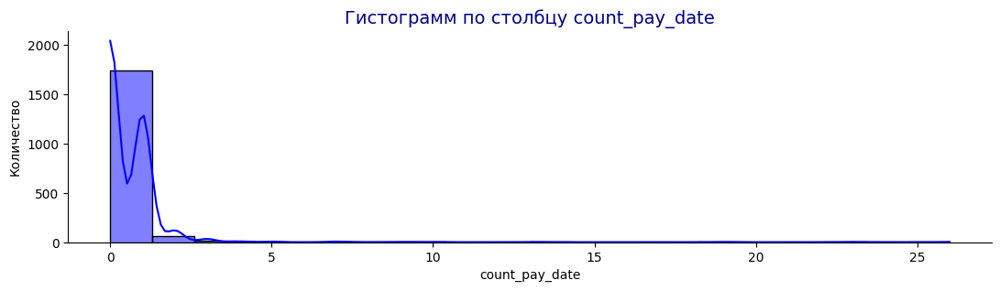

In [74]:
# Построим гисторгамму распределения компаний по количеству оплат тарифа
maker_hist(billing_id['count_pay_date'], 20)

In [75]:
# Создадим сводную таблицу кол-во оплаченных/неоплаченных подписок в разрезе типов тарифа
billing_tariff = billing_id.pivot_table(index='type_tariff', columns = 'is_payed', values='company_id', aggfunc='count').reset_index()
billing_tariff.columns = ['type_tariff', 'is_payed_False', 'is_payed_True']
print(billing_tariff.to_markdown(tablefmt="grid"))

+----+---------------+------------------+-----------------+
|    | type_tariff   |   is_payed_False |   is_payed_True |
+====+===============+==================+=================+
|  0 | базовый       |              740 |             129 |
+----+---------------+------------------+-----------------+
|  1 | бизнес        |              122 |              32 |
+----+---------------+------------------+-----------------+
|  2 | профи         |               73 |               9 |
+----+---------------+------------------+-----------------+
|  3 | старт         |              658 |              77 |
+----+---------------+------------------+-----------------+


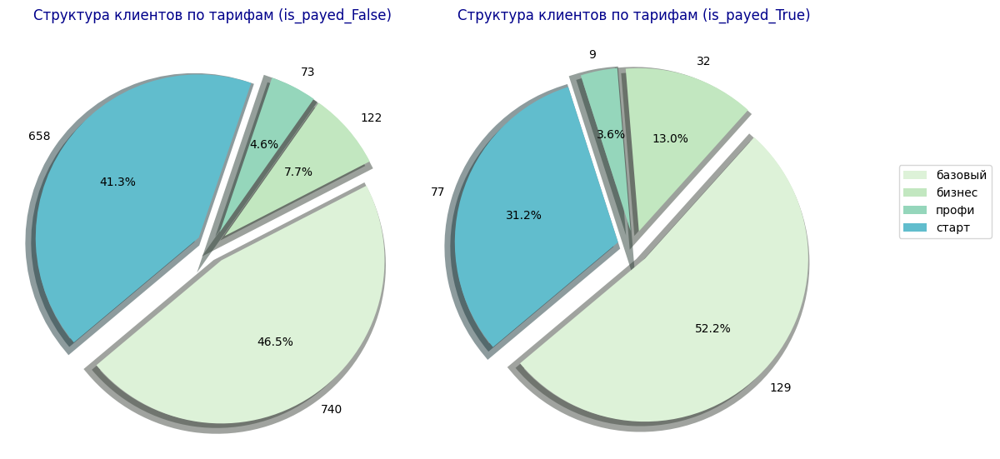

In [76]:
# Построим круговые диаграммы - структура клиентов по тарифам в разрезе is_payed
def pie_plot_charts(df, col, ax, col2):
    explode = [0.1]*df[col].nunique()
    colors = sns.color_palette('GnBu')
    ax.pie(df[col],
            labels = df[col].unique(),
            colors = colors,
            autopct = '%0.1f%%',
            explode = explode,
            shadow = 'True',
            startangle = 220,
            textprops = {'color': 'black','fontsize':10},
            wedgeprops = {'linewidth': 10},
            #frame = 'true',
            center = (0.1,0.1),
            rotatelabels = False)
    ax.set_title(f'Структура клиентов по тарифам ({col})', loc='center', size=12, color='darkblue', pad=20)
    plt.legend(df[col2].unique(), bbox_to_anchor=( 1.15 , 0.7), loc='upper left', borderaxespad= 0)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 10), sharey=False)  # Устанавливаем sharey=False

pie_plot_charts(billing_tariff, 'is_payed_False', axes[0], 'type_tariff')
pie_plot_charts(billing_tariff, 'is_payed_True', axes[1], 'type_tariff')

plt.tight_layout()
plt.show()

In [77]:
# Создадим сводную таблицу кол-во компаний оплативши/неоплативших подписку на дату проведения анализа
billing_is_played = billing_id.pivot_table(index='is_payed', values='company_id', aggfunc='count').reset_index()
print(billing_is_played.to_markdown(tablefmt="grid"))

+----+------------+--------------+
|    | is_payed   |   company_id |
+====+============+==============+
|  0 | False      |         1593 |
+----+------------+--------------+
|  1 | True       |          247 |
+----+------------+--------------+


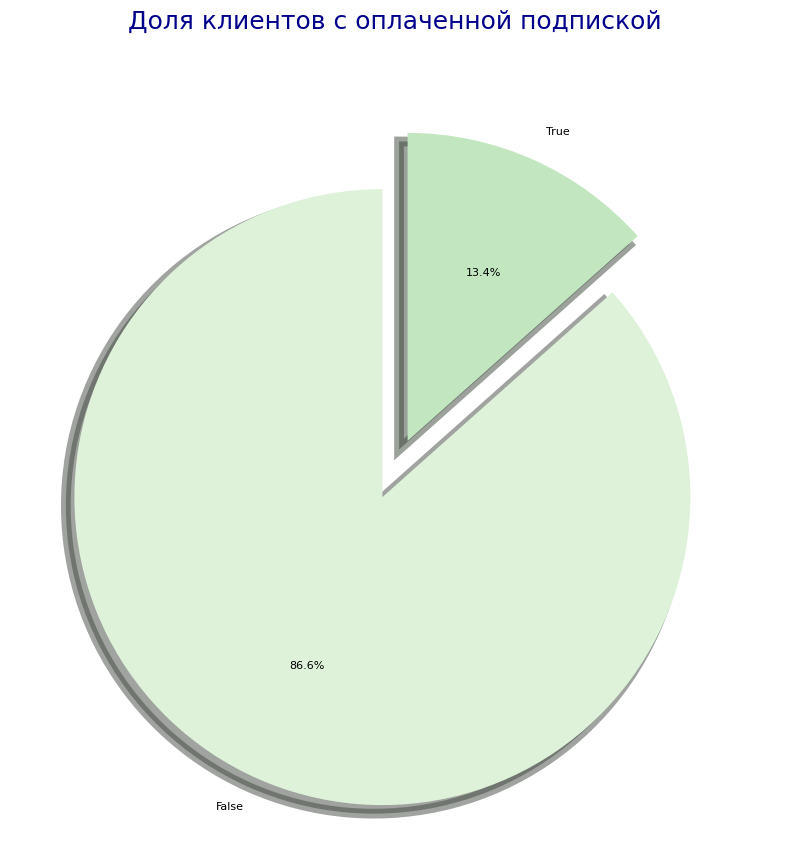

In [78]:
# Построим круговую диаграмму - Доля клиентов с оплаченной подпиской
maker_pie(billing_is_played, 'company_id', 'is_payed', 'Доля клиентов с оплаченной подпиской')

In [79]:
# Добавим данные из датафрейма billing_id в датафрейм companies1
# Добавили последнюю дату платежа по тарифу
# Добавили количество проплат по тарифу
# Добавили billing_tariff_id
# Добавили billing_tariff_price_id
# Добавили название типа тарифа
# Добавили целевой показатель - оплачена/неоплачена подписка
companies1 = pd.merge(companies1, billing_id, how = 'left', on = 'company_id')
companies1 = companies1.fillna(0)
companies1.head()

,company_id,work_years,last_month,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,last_pay_date,payed_until,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,is_payed
0,1,2,2020-11-01 00:00:00+00:00,3,58,17,56,16,0,150,0.00,0.00,0,2020-10-25,0.00,3.00,10.00,профи,False
1,21,5,2023-05-01 00:00:00+00:00,21,84,0,83,127,15,330,150.00,0.00,2023-01-19 00:00:00,2023-04-30,5.00,7.00,23.00,старт,False
2,30,3,2021-11-01 00:00:00+00:00,11,62,3,61,142,0,279,0.00,0.00,2021-06-23 00:00:00,2021-09-24,3.00,4.00,14.00,старт,False
3,108,3,2022-12-01 00:00:00+00:00,4,10,1,10,21,0,46,0.00,0.00,2022-11-28 00:00:00,2022-12-05,1.00,2.00,8.00,базовый,False
4,116,3,2021-11-01 00:00:00+00:00,5,52,0,50,61,69,237,0.00,0.00,2021-08-02 00:00:00,2022-02-02,2.00,7.00,22.00,старт,False


In [80]:
# В billing_id нет компании с id1154, а в companies1 есть, удалю ее
companies1 = companies1.loc[companies1['company_id']!=1154]

In [81]:
# Изучим общую информацию по датафрейму companies1
companies1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 714 entries, 0 to 714
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   company_id               714 non-null    int64              
 1   work_years               714 non-null    int64              
 2   last_month               714 non-null    datetime64[ns, UTC]
 3   all_billing              714 non-null    int32              
 4   all_stocks               714 non-null    int32              
 5   all_backups              714 non-null    int32              
 6   all_projects             714 non-null    int32              
 7   all_contractors          714 non-null    int32              
 8   all_resource_orders      714 non-null    int32              
 9   all_activities           714 non-null    int32              
 10  all_activities_2023      714 non-null    float64            
 11  all_activities_2024      714 non

### **2.3. EDA датафрейм companies**

#### **2.3.1. Анализ столбцов (признаков) датафрейма companies**

In [82]:
# Проведем визуальный анализ датафрейма
companies.head(2)

,id,working_direction,employer_count_interval,created_at,updated_at,billing_tariff_id,billing_is_over
0,514,-,1.00,1571316635,1670298314,4.00,True
1,383,Строительство,2.00,1564142565,1676550050,7.00,False


In [83]:
# Объявим функцию для создания столбца с количеством сотрудников
def employer_count_maker(row):
    if row['employer_count_interval'] == 1:
        return '1-4'
    elif row['employer_count_interval'] == 2:
        return '5-10'
    elif row['employer_count_interval'] == 3:
        return '11-20'
    elif row['employer_count_interval'] == 4:
        return '21-30'
    elif row['employer_count_interval'] == 5:
        return '31-50'
    elif row['employer_count_interval'] == 6:
        return '51-100'
    elif row['employer_count_interval'] == 7:
        return '101-200'
    elif row['employer_count_interval'] == 8:
        return '> 200'

In [84]:
# Создадим столбец 'employer_count' в датафрейме companies
companies['employer_count'] = companies.apply (employer_count_maker, axis=1)
companies.head(2)

,id,working_direction,employer_count_interval,created_at,updated_at,billing_tariff_id,billing_is_over,employer_count
0,514,-,1.00,1571316635,1670298314,4.00,True,1-4
1,383,Строительство,2.00,1564142565,1676550050,7.00,False,5-10


In [85]:
# Переименуем столбец id в company_id
companies.rename(columns = {'id':'company_id'}, inplace = True )

___________
__________
**Промежуточный вывод:**

- **company_id** - id компании;
- **working_direction** - сфера деятельности;
- **employer_count_interval** - id количества сотрудников;
- **created_at** - дата создания компании в системе;
- **updated_at** - дата обновления информации о компании;
- **billing_tariff_id** - id тарифа;
- **billing_is_over** - истекла ли оплата;
- **employer_count** - количество сотрудников.

Столбец billing_is_over игнорирую, чтобы избежать несостыковок.

Поле is_played == True в датафрейме companies1 означает, что дата оплаты тарифа не истекла.
____________
____________

#### **2.3.2. Анализ типов данных столбцов датафрейма companies**

In [86]:
# Изучим общую информацию по датафрейму
companies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 723 entries, 0 to 722
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   company_id               723 non-null    int64  
 1   working_direction        720 non-null    object 
 2   employer_count_interval  723 non-null    float64
 3   created_at               723 non-null    int64  
 4   updated_at               723 non-null    int64  
 5   billing_tariff_id        716 non-null    float64
 6   billing_is_over          723 non-null    bool   
 7   employer_count           723 non-null    object 
dtypes: bool(1), float64(2), int64(3), object(2)
memory usage: 40.4+ KB


_____________
______________

Приведем тип данных в соответствие с характером данных:

- в столбцах employer_count_interval и billing_tariff_id заменим тип данных с float64 на int32;
- в столбцах created_at, updated_at заменим тип данных с int64 на datetime.

____________
___________

In [87]:
# Выполним и проконтролируем замену типа данных в столбцах
companies[['created_at', 'updated_at']] = companies[['created_at', 'updated_at']].apply(pd.to_datetime, unit='s')
#companies[['employer_count_interval', 'billing_tariff_id']] = companies[['employer_count_interval', 'billing_tariff_id']].astype('int32')
companies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 723 entries, 0 to 722
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   company_id               723 non-null    int64         
 1   working_direction        720 non-null    object        
 2   employer_count_interval  723 non-null    float64       
 3   created_at               723 non-null    datetime64[ns]
 4   updated_at               723 non-null    datetime64[ns]
 5   billing_tariff_id        716 non-null    float64       
 6   billing_is_over          723 non-null    bool          
 7   employer_count           723 non-null    object        
dtypes: bool(1), datetime64[ns](2), float64(2), int64(1), object(2)
memory usage: 40.4+ KB


In [88]:
# Создадим столбец 'type_tariff' в датафрейме companies
companies['type_tariff'] = companies.apply(type_tariff_maker, axis=1)
companies.head(2)

,company_id,working_direction,employer_count_interval,created_at,updated_at,billing_tariff_id,billing_is_over,employer_count,type_tariff
0,514,-,1.00,2019-10-17 12:50:35,2022-12-06 03:45:14,4.00,True,1-4,старт
1,383,Строительство,2.00,2019-07-26 12:02:45,2023-02-16 12:20:50,7.00,False,5-10,старт


In [89]:
# Проверка гипотезы El Dens0 - 26/12/2022 Gectaro разово перевело 300 клиентов в статус тариф не оплачен#
#temp = companies.groupby('updated_at').agg({'billing_is_over':'count'})
#temp

#### **2.3.3. Автоматический EDA датафрейма companies (pandas profiling )**

In [90]:
# Сформируем отчет pandas profiling
profile3 = ProfileReport(companies, title="Pandas Profiling Report")
profile3

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

___________________
__________________
**Промежуточные выводы:**

- датафрейм содержит 8 столбцов;
- в датафрейме 723 строки;
- пропуски - 0,2% ячеек в столбцах:
  - working_direction - 0,4%;
  - billing_tariff_id	 - 1,0%;
- полных дубликатов нет;
- 723 уникальных id компаний;
- 170 уникальных значений working_direction;
- данные о регистрациях компаний в сервисе Gectaro с 23.01.2019 по 07.02.2024 гг;
- обновления данных о компаниях в сервисе Gectaro с 06.07.2020 по 13.03.2024 гг;
- по количеству сотрудников компании разделены на 8 групп:
  - 68,9% компаний имеют численность сотрудников 1-4 чел.;
  - 20,3 % - 5-10 чел.;
  - 6,45 - 11-20 чел.
- истекла оплата у 66,5% компаний.

Датасет companies1 - основной датасет, на основе которого будет происходить объединение информации о клиентах сервиса Gectaro.

Соединение датафреймов по столбцу company_id.
____________
____________

In [91]:
companies[['created_at', 'updated_at']] = pd.DatetimeIndex(companies[['created_at', 'updated_at']]).date

#### **2.3.4. Преобразования датафрейма companies**

##### **2.3.4.1. Преобразование столбца working_direction**

In [92]:
# Посмотрим сколько уникальных значений в столбце working_direction
companies['working_direction'].nunique()

170

In [93]:
# Выведем уникальные значения столбца working_direction на экран
companies['working_direction'].unique()

array(['-', 'Строительство', 'Генеральный подрядчик',
       'Строительная компания', 'Ремонт помещений', 'строительство ',
       'ремонт и отделка', 'СТРОИТЕЛЬСТВО', 'строительство',
       'Строительство домов', 'телемаркетинг', 'ремонт',
       'Ремонт и отделка помещений', '-Малоэтажное строительство',
       'Отделка ', 'Отделка',
       'Проектирование и строительство ресторанов ',
       'строительство  и отделка', 'ремонты', 'Электромонтажные работы',
       'строительная компания (тест)', 'Строительство и ремонт',
       'Демонтажные работы', 'Строительство рыбоводных ферм',
       'Строительно-монтажные работы', 'Строительство каркасных домов',
       'Дизайн интерьеров', 'Ремонтные работы',
       'Малоэтажное строительство ', nan, 'Ремонтно-строительная ',
       'Ремонт под ключ', 'Электромонтаж',
       'Проектирование,  Производство и Строительство',
       'Строительство коттеджей', 'Строительство загородных домов',
       'Малоэтажное строительство', 'Электроэнергетик

In [94]:
# Заполним пропуски в столбце working_direction
companies['working_direction'].fillna('нд').head(2)

0                -
1    Строительство
Name: working_direction, dtype: object

In [95]:
# Приведем к нижнему регистру значения в столбце working_direction
companies['working_direction'] = companies['working_direction'].str.lower()

In [96]:
# Выполним замену со словарем в столбце working_direction
# Создадим словарь
topics = {
    'строительство': ['строител', 'строй', 'монолит', 'домостроен', 'подряд', 'производств', 'девелоп'],
    'ремонт': ['ремонт', 'отдел'],
    'инженерные_работы': ['инженер', 'электро', 'вентил', 'водо', 'слаботоч', 'сети', 'безопаст'],
    'благоустройство': ['благоустройство', 'забор', 'дерев', 'фасад', 'демонтаж'],
    'нд':['-']
}
#создаем функцию для прохода по словарю и присваивания значений
def find_substring(x, dict):
  #Начальное значение ключа - если подстрока не найдется, то значение вида помощи будет - Другая
    found_key = 'прочие'
    #Перибираем элементы словаря, для каждого ключа проверяем каждое из значений в списке
    for key, values in dict.items():
        for value in values:
          #Ищем любое совпадение - если совпадание найдено, присваиваем переменной соответственное значение ключа, останавливаем перебор, переходим к следующей строке
            if pd.Series(x).astype(str).str.contains(value, regex=True, case=False).any():
                found_key = key
                break
    #Функция возвращает значение переменной found_key - если совпадание нашлось, то это будет название категории, если не нашлось - то Другая
    return found_key

#Применяем функцию к столбцу working_direction
#Результаты сохраним в столбце working_direction_2
companies['working_direction_2'] = companies['working_direction'].apply(lambda x: find_substring(x, topics))

In [97]:
# Проверим значения столбца working_direction_2
maker_value_counts(companies, 'working_direction_2')

,working_direction_2,working_direction_2
нд,484,0.67
строительство,148,0.20
ремонт,45,0.06
инженерные_работы,21,0.03
прочие,13,0.02
благоустройство,12,0.02


_________
___________
**Промежуточный вывод:**
мы огрегировали 170 хаотичных видов деятельности в 5 групп:
- строительство;
- ремонт;
- инженерные работы;
- благоустройство;
- прочие.
____________
____________

##### **2.3.4.2. Изучим структуру клиентской базы Gectaro**

____________
____________
**Важно:**

В данном разделе не важно оплачен у клиента подписка или нет, интересно посмотреть какие компании вообще интересуются сервисом Gectaro.
_____________
____________

In [98]:
# Создадим временный датафрейм companies_direction для построения визуализации по признаку working_direction
companies_direction = companies.pivot_table(index='working_direction_2', values='company_id', aggfunc='count').reset_index().sort_values(by = 'company_id')
print(companies_direction.to_markdown(tablefmt="grid"))

+----+-----------------------+--------------+
|    | working_direction_2   |   company_id |
+====+=======================+==============+
|  0 | благоустройство       |           12 |
+----+-----------------------+--------------+
|  3 | прочие                |           13 |
+----+-----------------------+--------------+
|  1 | инженерные_работы     |           21 |
+----+-----------------------+--------------+
|  4 | ремонт                |           45 |
+----+-----------------------+--------------+
|  5 | строительство         |          148 |
+----+-----------------------+--------------+
|  2 | нд                    |          484 |
+----+-----------------------+--------------+


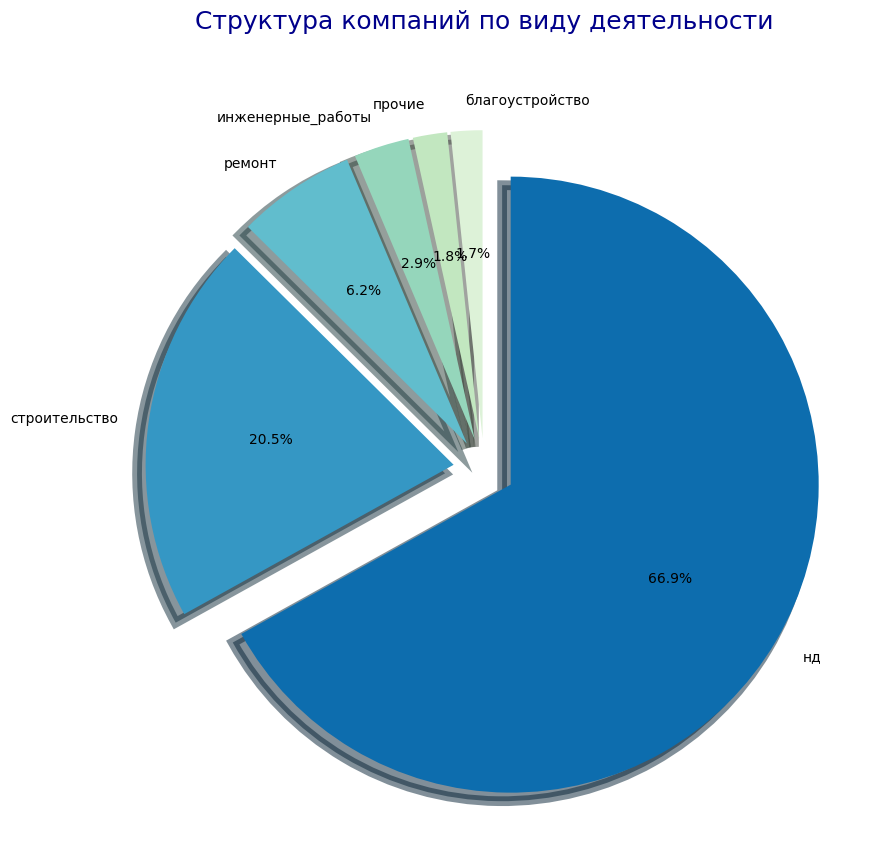

In [99]:
# Построим круговую диаграмму Структура компаний по виду деятельности
maker_pie(companies_direction, 'company_id', 'working_direction_2', 'Структура компаний по виду деятельности', 10)

________
_______
**Промежуточный вывод:**

- типичные виды деятельности клиентов Gectaro: строительство (20%), ремонт(6%), благоустройство (2%), инженерные работы (3%);
- 66,9% компаний в столбце вид деятельности имеют '-'.

Трудно строить портрет клиента, если о нем нет достоверной структурированной информации.

В РФ предприятия имеют ОКВЭД.

ОКВЭД - публичная информация.

Корректро было бы просить клиентов указать ОКВЭД.
____________
___________

In [100]:
# Построим временный датафрейм companies_employer для построения графика Структура компаний по количеству сотрудников
#temp = companies.loc[companies['employer_count'].isin(['21-30', '31-50', '> 200', '101-200', '51-100'])] = '21 и более'
companies_employer = companies.pivot_table(index='employer_count', values='company_id', aggfunc='count').reset_index().sort_values(by = 'company_id')
print(companies_employer.to_markdown(tablefmt="grid"))

+----+------------------+--------------+
|    | employer_count   |   company_id |
+====+==================+==============+
|  6 | 51-100           |            2 |
+----+------------------+--------------+
|  1 | 101-200          |            3 |
+----+------------------+--------------+
|  7 | > 200            |            4 |
+----+------------------+--------------+
|  4 | 31-50            |            9 |
+----+------------------+--------------+
|  3 | 21-30            |           14 |
+----+------------------+--------------+
|  2 | 11-20            |           46 |
+----+------------------+--------------+
|  5 | 5-10             |          147 |
+----+------------------+--------------+
|  0 | 1-4              |          498 |
+----+------------------+--------------+


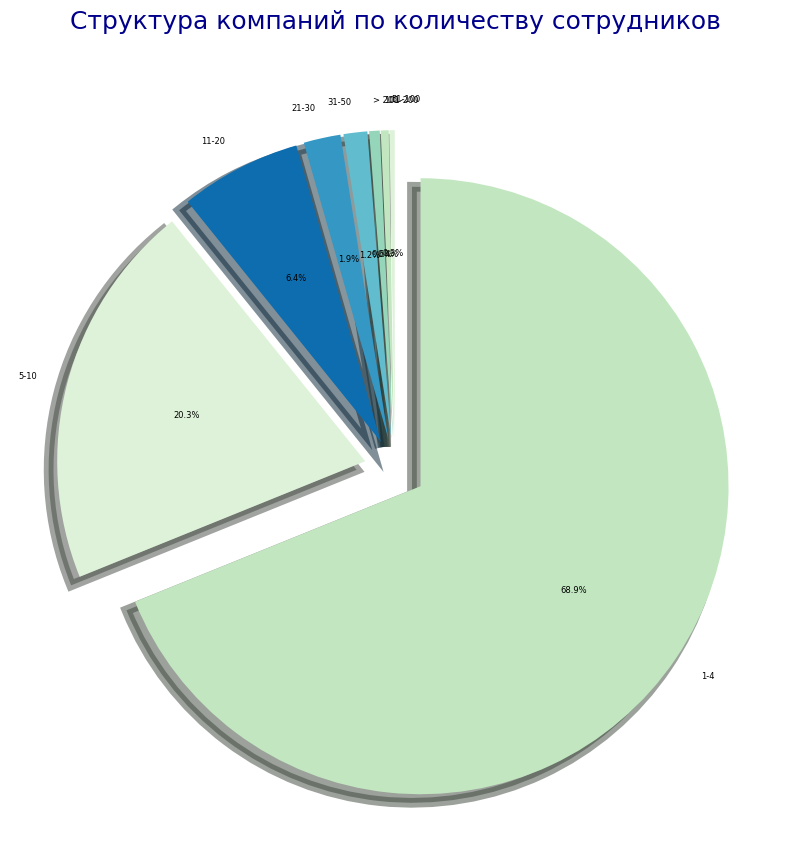

In [101]:
# Построим круговую диаграмму Структура компаний по количеству сотрудников
maker_pie(companies_employer, 'company_id', 'employer_count', 'Структура компаний по количеству сотрудников', 6)

____________
____________
**Промежуточный вывод:**

- 69% клиентов имеют численность 1-4 чел;
- 20% - 5-10 чел;
- 6% - 11-20 чел;
- 5% - более 21 человека.

Типичный клиент Gectaro - малый бизнес (менее 100 чел).

Средний срок существования малого предприятия в РФ - 7 лет, следовательно, высокий отток клиентов может быть связан с коротким сроком существования на рынке предприятий с численностью 1-4 чел.
__________
__________

In [102]:
# Построим временный датафрейм companies_tariff для построения графика Структура компаний по типу тарифа
companies_tariff = companies.pivot_table(index='type_tariff', values='company_id', aggfunc='count').reset_index().sort_values(by = 'company_id')
print(companies_tariff.to_markdown(tablefmt="grid"))

+----+---------------+--------------+
|    | type_tariff   |   company_id |
+====+===============+==============+
|  2 | профи         |           23 |
+----+---------------+--------------+
|  1 | бизнес        |           51 |
+----+---------------+--------------+
|  3 | старт         |          312 |
+----+---------------+--------------+
|  0 | базовый       |          330 |
+----+---------------+--------------+


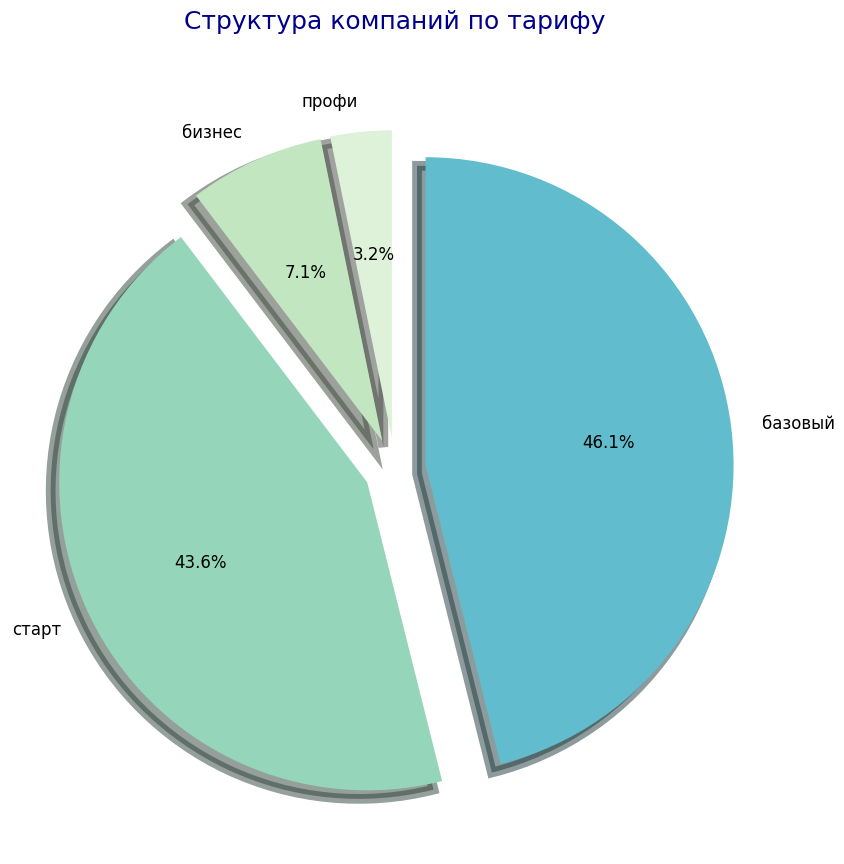

In [103]:
# Построим круговую диаграмму Структура компаний по типу тарифа
maker_pie(companies_tariff, 'company_id', 'type_tariff', 'Структура компаний по тарифу',12)

_____________
_____________
**Промежеточный вывод:**
- 46% клиентов имеют базовый тариф;
- 44% клиентов имеют стартовый тариф.

Проценты несколько иные, чем в датафрейме billing...
_____________
____________

##### **2.3.4.3. Преобразование датафрейма companies1**

In [104]:
# Удалим избыточные столбцы из датафрейма companies
companies.drop(['billing_tariff_id', 'working_direction', 'billing_is_over', 'type_tariff'], axis= 1 , inplace= True )
companies.head(2)

,company_id,employer_count_interval,created_at,updated_at,employer_count,working_direction_2
0,514,1.00,2019-10-17,2022-12-06,1-4,нд
1,383,2.00,2019-07-26,2023-02-16,5-10,строительство


In [105]:
# Добавим данные из датафрейма companies в датафрейм companies1
# Добавим вид деятельности клиента
# Добавим численность сотрудников клиента
# Добавим дату регистрации компании в Gectaro
# Добавим дату обновлении данных о компаниях в Gectaro
# Добавим employer_count_interval
companies1 = pd.merge(companies1, companies, how = 'left', on = 'company_id')
companies1 = companies1.fillna(0)
companies1.head()


,company_id,work_years,last_month,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,last_pay_date,payed_until,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,is_payed,employer_count_interval,created_at,updated_at,employer_count,working_direction_2
0,1,2,2020-11-01 00:00:00+00:00,3,58,17,56,16,0,150,0.00,0.00,0,2020-10-25,0.00,3.00,10.00,профи,False,3.00,2019-01-23,2022-12-06,11-20,строительство
1,21,5,2023-05-01 00:00:00+00:00,21,84,0,83,127,15,330,150.00,0.00,2023-01-19 00:00:00,2023-04-30,5.00,7.00,23.00,старт,False,1.00,2019-01-31,2023-04-30,1-4,строительство
2,30,3,2021-11-01 00:00:00+00:00,11,62,3,61,142,0,279,0.00,0.00,2021-06-23 00:00:00,2021-09-24,3.00,4.00,14.00,старт,False,1.00,2019-01-31,2022-12-06,1-4,благоустройство
3,108,3,2022-12-01 00:00:00+00:00,4,10,1,10,21,0,46,0.00,0.00,2022-11-28 00:00:00,2022-12-05,1.00,2.00,8.00,базовый,False,2.00,2019-02-01,2022-12-06,5-10,ремонт
4,116,3,2021-11-01 00:00:00+00:00,5,52,0,50,61,69,237,0.00,0.00,2021-08-02 00:00:00,2022-02-02,2.00,7.00,22.00,старт,False,1.00,2019-02-01,2022-12-06,1-4,инженерные_работы


In [106]:
# Изменим тип данных в столбце employer_count_interval
companies1['employer_count_interval'] = companies1['employer_count_interval'].astype('int32')

In [107]:
# Изучим общую информацию по датафрейму companies1
companies1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 714 entries, 0 to 713
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   company_id               714 non-null    int64              
 1   work_years               714 non-null    int64              
 2   last_month               714 non-null    datetime64[ns, UTC]
 3   all_billing              714 non-null    int32              
 4   all_stocks               714 non-null    int32              
 5   all_backups              714 non-null    int32              
 6   all_projects             714 non-null    int32              
 7   all_contractors          714 non-null    int32              
 8   all_resource_orders      714 non-null    int32              
 9   all_activities           714 non-null    int32              
 10  all_activities_2023      714 non-null    float64            
 11  all_activities_2024      714 non

### **2.4. EDA датафрейм people**

#### **2.4.1. Анализ столбцов (признаков) датафрейма people**

In [108]:
# Проведем визуальный анализ датафрейма
people.head(2)

,id,company_id,user_id,role_id,created_at,updated_at,is_deleted,deleted_at
0,6601,495,NaN,7133,1570535962,1570535962,True,"1,594,066,768.00"
1,7025,1,NaN,1,1594120484,1594120484,True,"1,594,120,488.00"


____________
____________
**Промежуточный вывод:**

- **id** - индекс;
- **company_id** - id компании;
- **user_id** - id пользователя;
- **role_id** - id роли (должности);
- **created_at** - дата создания пользователя;
- **updated_at** - дата обновления информации о пользователе;
- **is_deleted** - удален ли пользователь;
- **deleted_at** - дата удаления.
___________
___________

#### **2.4.2. Анализ типов данных столбцов датафрейма people**

In [109]:
# Изучим общую информацию по датафрейму
people.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5095 entries, 0 to 5094
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          5095 non-null   int64  
 1   company_id  5095 non-null   int64  
 2   user_id     3813 non-null   float64
 3   role_id     5095 non-null   int64  
 4   created_at  5095 non-null   int64  
 5   updated_at  5095 non-null   int64  
 6   is_deleted  5095 non-null   bool   
 7   deleted_at  2180 non-null   float64
dtypes: bool(1), float64(2), int64(5)
memory usage: 283.7 KB


_____________
______________

Приведем тип данных в соответствие с характером данных:

- в столбцах created_at, updated_at, deleted_at заменим тип данных с int64 на datetime.

____________
___________

In [110]:
# Выполним и проконтролируем замену типа данных в столбцах
people[['created_at', 'updated_at', 'deleted_at']] = people[['created_at', 'updated_at', 'deleted_at']].apply(pd.to_datetime, unit='s')
people.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5095 entries, 0 to 5094
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   id          5095 non-null   int64         
 1   company_id  5095 non-null   int64         
 2   user_id     3813 non-null   float64       
 3   role_id     5095 non-null   int64         
 4   created_at  5095 non-null   datetime64[ns]
 5   updated_at  5095 non-null   datetime64[ns]
 6   is_deleted  5095 non-null   bool          
 7   deleted_at  2180 non-null   datetime64[ns]
dtypes: bool(1), datetime64[ns](3), float64(1), int64(3)
memory usage: 283.7 KB


#### **2.4.3. Автоматический EDA датафрейма people (pandas profiling )**

In [111]:
# Сформируем отчет pandas profiling
profile4 = ProfileReport(people, title="Pandas Profiling Report")
profile4

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

___________________
__________________
**Промежуточные выводы:**

- датафрейм содержит 8 столбцов;
- в датафрейме 5095 строк;
- пропуски - 10,3% ячеек в столбцах:
  - user_id - 25,2%;
  - deleted_at - 57,2%;
- полных дубликатов нет;
- 712 уникальных id компаний;
- 3528 уникальных id пользователей;
- 1411 уникальных id ролей;
- данные с 23.01.2019 по 13.12.2023 гг;
- столбец is_deleted:
  - значение True  - 2183;
  - значение False - 2912;
- столбец deleted_at:
  - заполнено 2170 строк, что почти полностью соответствует количеству удаленных пользователей - 2183.

Здорово, что есть библиотека pandas profiling.
Можно быстро провести EDA и понять нужен ли датафрейм в дальнейшем, то есть содержит ли он данные, способные ответить на вопрос, поставленный в ТЗ.

Цель проекта:
- составить портрет клиента;
- выявить причины оттока клиентов.

Из датафрейм peple можно извлечь 2 показателя:
- количество сотрудников компании, зарегистрированных в Gectaro;
- последняя дата удаления сотрудника компании из пользователей Gectaro - столбец deleted_at.

Определить роли сотрудников по столбцу role_id не представляется возможным - 1411 уникальных значений...это мусор, видимо, отданный на произвольное определение клиентами (вместо выбора из предложенного списка).

Гипотезы:
- чем больше количество сотрудников зарегистрировано как пользователи Gectaro, тем более лояльна компания к сервесу Gectaro (ограничение - основная масса клиентов имеют численность персонала 1-4 чел.);
- если после удаления пользователя новых активностей компании в сервисе Gectaro не было,то сотрудничество с Gectaro могло быть инициативой конкретного пользователя (или малое предприятие перестало существовать).
____________
____________

#### **2.4.4. Преобразования датафрейма people**

In [112]:
# Создадим временный датафрейм people_user
people_user = people.loc[people['deleted_at'].isna()].groupby('company_id').agg({'user_id':'nunique'}).reset_index()
people_user.columns = ['company_id', 'count_users']
people_user.head(2)

,company_id,count_users
0,1,2
1,21,3


In [113]:
# Изучим датафрейм people_user с помощью метода value_counts
maker_value_counts(people_user, 'count_users')

,count_users,count_users
1,159,0.22
3,156,0.22
2,148,0.21
4,52,0.07
5,45,0.06
7,44,0.06
6,44,0.06
8,24,0.03
9,9,0.01
10,6,0.01


In [114]:
# Объявим функцию для создания столбца категории - количество пользователей в Gectaro
def count_users_maker(row):
    if row['count_users'] == 1:
        return '1'
    elif row['count_users'] == 2:
        return '2'
    elif row['count_users'] == 3:
        return '3'
    elif row['count_users'] > 3:
        return '4 и более'

In [115]:
# Изменим столбец 'count_users' в датафрейме people_user
people_user['count_users'] = people_user.apply(count_users_maker, axis=1)
people_user

,company_id,count_users
0,1,2
1,21,3
2,30,2
3,108,2
4,116,3
5,218,1
6,257,1
7,303,1
8,309,3
9,336,1


In [116]:
# Изучим датафрейм people_user с помощью метода value_counts (контроль)
maker_value_counts(people_user, 'count_users')

,count_users,count_users
4 и более,249,0.35
1,159,0.22
3,156,0.22
2,148,0.21


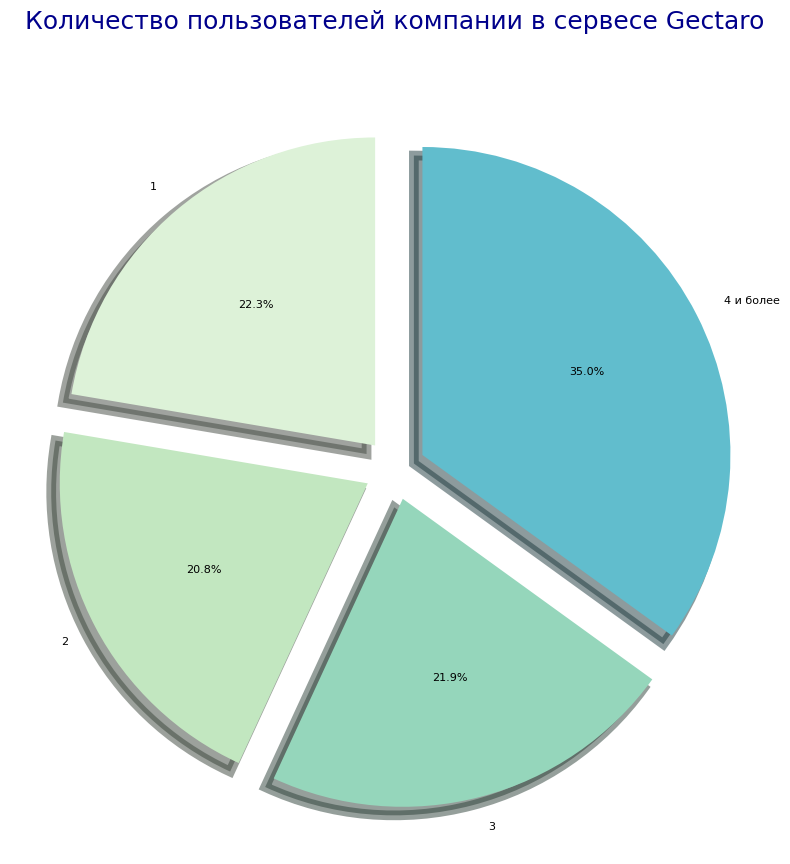

In [117]:
temp = people_user.groupby('count_users').agg({'company_id':'count'}).reset_index()
maker_pie(temp, 'company_id', 'count_users', 'Количество пользователей компании в сервесе Gectaro')

In [118]:
# Добавим данные о количестве пользователей из датафрейма people_user в датафрейм companies1
companies1 = pd.merge(companies1, people_user, how = 'left', on = 'company_id')
companies1 = companies1.fillna('нд')
companies1.head(2)

,company_id,work_years,last_month,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,last_pay_date,payed_until,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,is_payed,employer_count_interval,created_at,updated_at,employer_count,working_direction_2,count_users
0,1,2,2020-11-01 00:00:00+00:00,3,58,17,56,16,0,150,0.00,0.00,0,2020-10-25,0.00,3.00,10.00,профи,False,3,2019-01-23,2022-12-06,11-20,строительство,2
1,21,5,2023-05-01 00:00:00+00:00,21,84,0,83,127,15,330,150.00,0.00,2023-01-19 00:00:00,2023-04-30,5.00,7.00,23.00,старт,False,1,2019-01-31,2023-04-30,1-4,строительство,3


In [119]:
# Изучим общую информацию по датафрейму companies1
companies1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 714 entries, 0 to 713
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   company_id               714 non-null    int64              
 1   work_years               714 non-null    int64              
 2   last_month               714 non-null    datetime64[ns, UTC]
 3   all_billing              714 non-null    int32              
 4   all_stocks               714 non-null    int32              
 5   all_backups              714 non-null    int32              
 6   all_projects             714 non-null    int32              
 7   all_contractors          714 non-null    int32              
 8   all_resource_orders      714 non-null    int32              
 9   all_activities           714 non-null    int32              
 10  all_activities_2023      714 non-null    float64            
 11  all_activities_2024      714 non

### **2.5. EDA объединенный датафрейм**

__________
Рузультат объединения данных из исходных датафреймов - датафрейм companies1.

На основании датафрейма companies1 будет проводится дальнейший анализ.

**Целевая переменная** - is_payed (True - тариф оплачен/клиент действующий, False - тариф не оплачен/отточный клиент)

_____________

#### **2.5.1. Создание дополнительных столбцов в датафрейме companies1**

____________
____________
**Признаки, описывающие типичного клиента**

- количественные (цифровые) признаки:   
  - общее количество активностей за 2019-2024 гг;
  - общее количество счетов за 2019-2024 гг;
  - общее количество складов за 2019-2024 гг;
  - общее количество бэкапов за 2019-2024 гг;
  - общее количество проектов за 2019-2024 гг;
  - общее количество клиентов за 2019-2024 гг;
  - общее количество поставок материалов за 2019-2024 гг;
  - общее количество активностей за 2023 г;
  - общее количество активностей за 2024 г (до 16.03.2024);
  - количество проплат по тарифу;
  - количество пользователей в сервисе;

- категориальные признаки:
  - тип тарифа;
  - статус действующего клиента;
  - количество сотрудников;
  - тип деятельности;

- значимые даты:
  - дата последней активности (детализация - месяц);
  - дата последнего платежа по тарифу;
  - дата регистрации клиента в сервисе;
  - дата последнего обновления данных о клиенте в сервисе;

на основании значимых дат рассчитываются количественные признаки:
  - количество рабочих лет в сервисе;
  - количество рабочих месяцев в сервисе;
  - количество дней, прошедших с последней активности;
  - количество дней, прошедших с последнего платежа по тарифу;
  - количество дней, прошедших с даты регистрации в сервисе;
  - количество дней, прошедших с даты последнего обновления данных о клиенте в сервисе;



In [120]:
# Создадим столбец last_date_project с последней датой проекта
# Создадим столбец diff_last_activities - количество дней с даты последней активности
# Создадим столбец diff_created_at - количество дней с даты регистрации компании в сервесе Gectaro
companies1['last_date_project'] = last_date
companies1['last_date_project'] = pd.DatetimeIndex(companies1['last_date_project']).date
companies1['last_month'] = pd.DatetimeIndex(companies1['last_month']).date
#companies1['last_pay_date'] = pd.DatetimeIndex(pd.to_datetime(companies1['last_pay_date'])).date
companies1['created_at'] = pd.DatetimeIndex(pd.to_datetime(companies1['created_at'])).date
companies1['updated_at'] = pd.DatetimeIndex(pd.to_datetime(companies1['updated_at'])).date
companies1.rename(columns = {'last_month':'last_month_activities'}, inplace = True)
companies1['diff_last_activities'] = companies1['last_date_project'] - companies1['last_month_activities']
companies1['diff_created_at'] = companies1['last_date_project'] - companies1['created_at']
companies1['diff_updated_at'] = companies1['last_date_project'] - companies1['updated_at']
companies1['diff_updated_at'] = companies1['diff_updated_at'].apply(lambda x: x.days)
companies1['diff_last_activities'] = companies1['diff_last_activities'].apply(lambda x: x.days)
companies1['diff_created_at'] = companies1['diff_created_at'].apply(lambda x: x.days)
companies1.head(2)

,company_id,work_years,last_month_activities,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,last_pay_date,payed_until,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,is_payed,employer_count_interval,created_at,updated_at,employer_count,working_direction_2,count_users,last_date_project,diff_last_activities,diff_created_at,diff_updated_at
0,1,2,2020-11-01,3,58,17,56,16,0,150,0.00,0.00,0,2020-10-25,0.00,3.00,10.00,профи,False,3,2019-01-23,2022-12-06,11-20,строительство,2,2024-03-16,1231,1879,466
1,21,5,2023-05-01,21,84,0,83,127,15,330,150.00,0.00,2023-01-19 00:00:00,2023-04-30,5.00,7.00,23.00,старт,False,1,2019-01-31,2023-04-30,1-4,строительство,3,2024-03-16,320,1871,321


In [121]:
companies1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 714 entries, 0 to 713
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   company_id               714 non-null    int64  
 1   work_years               714 non-null    int64  
 2   last_month_activities    714 non-null    object 
 3   all_billing              714 non-null    int32  
 4   all_stocks               714 non-null    int32  
 5   all_backups              714 non-null    int32  
 6   all_projects             714 non-null    int32  
 7   all_contractors          714 non-null    int32  
 8   all_resource_orders      714 non-null    int32  
 9   all_activities           714 non-null    int32  
 10  all_activities_2023      714 non-null    float64
 11  all_activities_2024      714 non-null    float64
 12  last_pay_date            714 non-null    object 
 13  payed_until              714 non-null    object 
 14  count_pay_date           7

_____________
!!! Откуда 1970-01-01 в last_pay_date	- искать ошибку
_____________

#### **2.5.2. Анализ активностей пользователей в датафрейме companies1**

In [122]:
# Расчитаем количество активностей на одну компанию в разрезе тарифов и видов активности
all_tariff_activities = pd.DataFrame(['billing',	'stocks',	'backups',	'projects',	'contractors',	'resource_orders'], columns = ['activity'])
for i in companies1['type_tariff'].unique():
    tariff_activities = pd.DataFrame(companies1.loc[companies1['type_tariff'] == i][['all_billing',	'all_stocks',	'all_backups',	'all_projects',	'all_contractors',	'all_resource_orders']].sum())
    tariff_activities['count_company'] = companies1.loc[companies1['type_tariff'] == i, 'company_id'].count()
    tariff_activities.columns = ['all_activities', 'count_company']
    tariff_activities[i + '_activities_one_company'] = round(tariff_activities['all_activities']/tariff_activities['count_company'])
    tariff_activities[i + '_activities_one_company'] = tariff_activities[i + '_activities_one_company'].astype('int32')
    all_tariff_activities[i + '_activities_one_company'] = tariff_activities[i + '_activities_one_company'].reset_index(drop=True)
all_tariff_activities

,activity,профи_activities_one_company,старт_activities_one_company,базовый_activities_one_company,бизнес_activities_one_company
0,billing,4,3,3,3
1,stocks,96,56,45,71
2,backups,24,2,12,17
3,projects,88,55,43,64
4,contractors,66,40,50,66
5,resource_orders,108,35,66,123


____________
____________
**Промежуточный вывод:**

- пользователи с тарифами профи и бизнес более активны, чем пользователи с тарифами старт и базовый;
- пользователи с тарифом старт более активны в операциях со складами и в проектах, чем пользователи с тарифом базовый;
- пользователи с тарифом старт менее активны в операциях бэкап и материалы, чем пользователи с тарифом базовый;
- особенно видна разница в операциях с материалами.


Мониторинг активности пользователей целесообразно проводить по самым популярным операциям в сервисе:
- stocks;
- projects;
- resource_orders.
___________
__________

In [123]:
# Посмотрим оттоки по годам (по последнему сроку окончания действия тарифа) в разрезе тарифов
companies1['year_until'] = pd.DatetimeIndex(companies1['payed_until']).year
out2 = companies1.pivot_table(index='year_until', columns = 'type_tariff', values='company_id', aggfunc='count')
out2 = out2.fillna(0)
out2['total'] = out2['базовый'] + out2['бизнес'] + out2['профи'] + out2['старт']
out2 = out2.astype('int32')
out2

type_tariff,базовый,бизнес,профи,старт,total
year_until,,,,,
2019,0,0,0,3,3
2020,9,0,3,31,43
2021,33,2,7,64,106
2022,70,6,1,56,133
2023,67,10,4,60,141
2024,98,23,4,72,197
2025,44,7,3,26,80
2026,5,3,0,3,11


In [124]:
# Посмотри сколько компаний, у которых оплачен тариф, не имели активности в сервисе в 2023 г
print('Имели активности в 2023 г.: ', companies1.loc[(companies1['all_activities_2023'] != 0) & (companies1['year_until'] > 2023),'company_id'].count())
print('Не имели активности в 2023 г.: ', companies1.loc[(companies1['all_activities_2023'] == 0) & (companies1['year_until'] > 2023),'company_id'].count())

Имели активности в 2023 г.:  256
Не имели активности в 2023 г.:  32


In [125]:
# Посмотри сколько компаний, у которых оплачен тариф, не имели активности в сервисе в 2024 г
print('Имели активности в 2024 г.: ', companies1.loc[(companies1['all_activities_2024'] != 0) & (companies1['year_until'] > 2023),'company_id'].count())
print('Не имели активности в 2024 г.: ', companies1.loc[(companies1['all_activities_2024'] == 0) & (companies1['year_until'] > 2023),'company_id'].count())

Имели активности в 2024 г.:  170
Не имели активности в 2024 г.:  118


_____________
________________
**Промжуточный выывод:**

активность клиентов с оплаченным тарифом падает по сравнению с 2023 г.:
- в 2023 г. имели активности 256 клиентов, а в 2024 г. - 170.
____________
____________

In [126]:
# Посмотрим сколько раз клиента оплачивает тариф в разрезе типов тарифа
companies1.groupby('type_tariff').agg({'company_id':'count', 'count_pay_date':['min', 'mean', 'median', 'max']}).reset_index()

type_tariff company_id count_pay_date                  
                   count            min mean median   max
0     базовый        326           0.00 1.08   1.00  9.00
1      бизнес         51           1.00 1.04   1.00  2.00
2       профи         22           0.00 1.23   1.00 10.00
3       старт        315           0.00 1.05   1.00 13.00

In [127]:
companies1.groupby('count_pay_date').agg({'company_id':'count'})

,company_id
count_pay_date,
0.00,95
1.00,545
2.00,48
3.00,14
4.00,3
5.00,3
7.00,3
9.00,1
10.00,1


___________
__________
**Промежуточный вывод:**

Типичная для сервиса Gectaro картина - клиент оплатил подписку один раз и не стал ее продлевать.

Конечно, есть выбросы, но по ним сложно сделать вывод, так как нет информации на какой срок приобреталась подписка.
_________
_________

In [128]:
# Анализ оттока в разрезе видов деятельности компании
temp = companies1.pivot_table(index = 'working_direction_2', columns = 'is_payed', values= 'company_id', aggfunc = 'count')
temp.columns = ['out', 'work']
temp['%_out'] = (temp['out']/(temp['out'] + temp['work']))*100
temp


,out,work,%_out
working_direction_2,,,
благоустройство,9,3,75.00
инженерные_работы,16,5,76.19
нд,324,154,67.78
прочие,8,5,61.54
ремонт,34,10,77.27
строительство,89,57,60.96


____________
____________
**Промежуточный вывод:**

Сложно сделать вывод, есть ли связь между спецификой деятельности и оттоком, так как информация о виде деятельности отсутствуюет или вид деятельности сформулирован не точно.

Из то что есть, строительные компании реже уходят в отток.

__________
________

In [129]:
# Разделим клиентов на группы по количеству операций resource_orders - 25, 50, 75 персентиль
# Посмотрим сколько клиентов попало в каждую группу
companies_segment2 = companies1.copy(deep=True)
companies_segment2 = companies_segment2[['company_id', 'work_years', 'all_resource_orders', 'type_tariff', 'is_payed', 'employer_count']]

def s_maker(x):
     if x <= np.percentile(companies_segment2['all_resource_orders'], 25):
         return '<=25 percentile'
     if x > np.percentile(companies_segment2['all_resource_orders'], 25) and x <= np.percentile(companies_segment2['all_resource_orders'], 50):
         return '25-50 percentile'
     if x > np.percentile(companies_segment2['all_resource_orders'], 50) and x <= np.percentile(companies_segment2['all_resource_orders'], 75):
         return '50-75 percentile'
     else:
         return '>75 percentile'

companies_segment2['segment_resource_orders'] = companies_segment2['all_resource_orders'].apply(s_maker)
companies_segment2['segment_resource_orders'].value_counts()

25-50 percentile    188
<=25 percentile     186
>75 percentile      177
50-75 percentile    163
Name: segment_resource_orders, dtype: int64

In [130]:
# Посмотрим значения персентилей
companies_segment2['all_resource_orders'].describe()

count     714.00
mean       57.88
std       147.83
min         0.00
25%         2.00
50%         8.00
75%        33.00
max     1,367.00
Name: all_resource_orders, dtype: float64

In [131]:
# Создадим временный датафрейм для построения круговой диаграммы
temp = companies_segment2.pivot_table(index = ['segment_resource_orders', 'is_payed'], values='company_id', aggfunc='count').reset_index()
temp.columns = ['segment_resource_orders', 'is_payed', 'company_count']
temp

,segment_resource_orders,is_payed,company_count
0,25-50 percentile,False,125
1,25-50 percentile,True,63
2,50-75 percentile,False,94
3,50-75 percentile,True,69
4,<=25 percentile,False,179
5,<=25 percentile,True,7
6,>75 percentile,False,82
7,>75 percentile,True,95


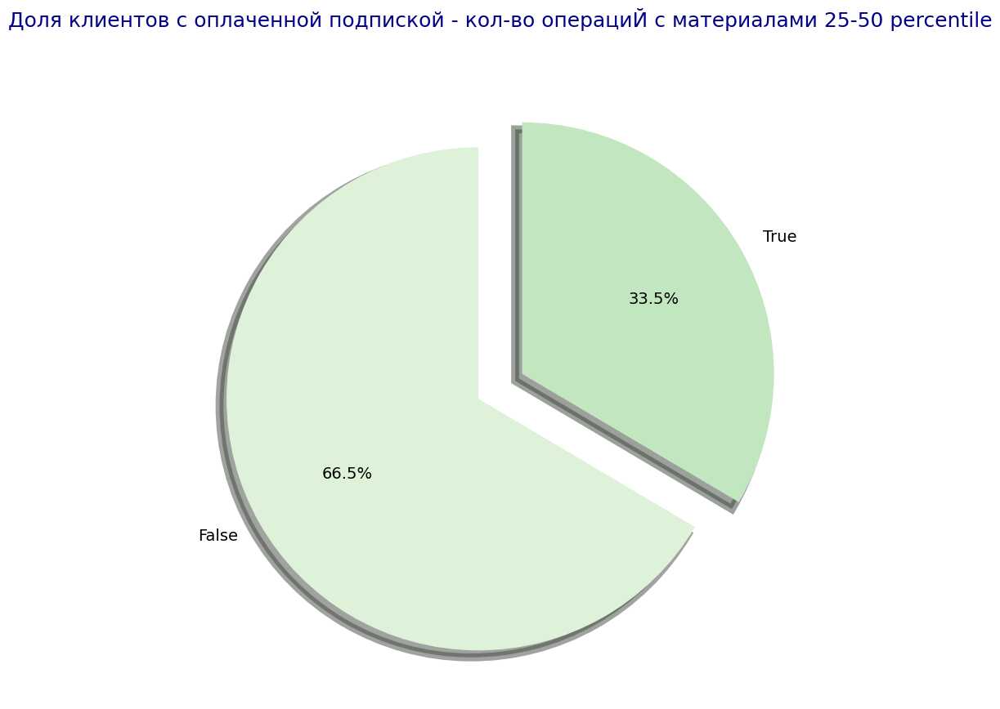

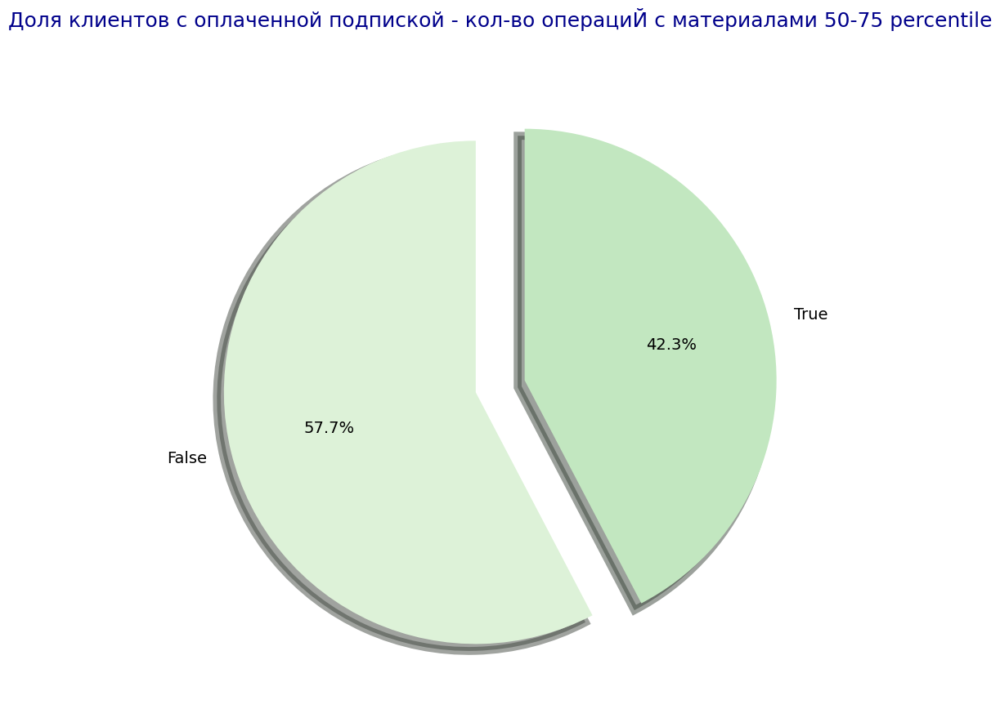

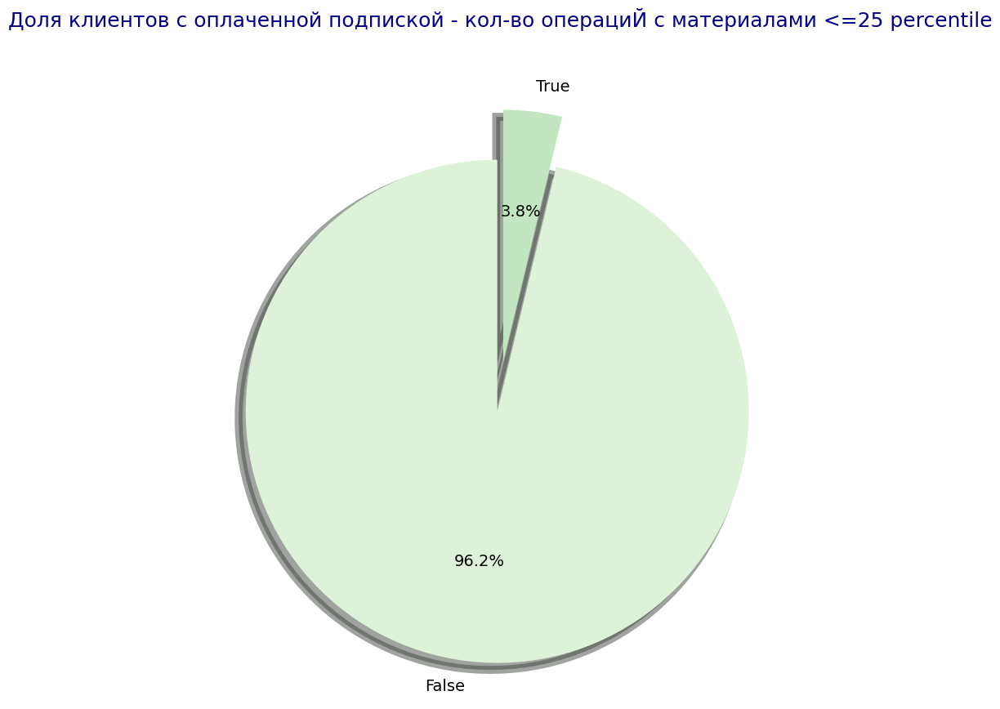

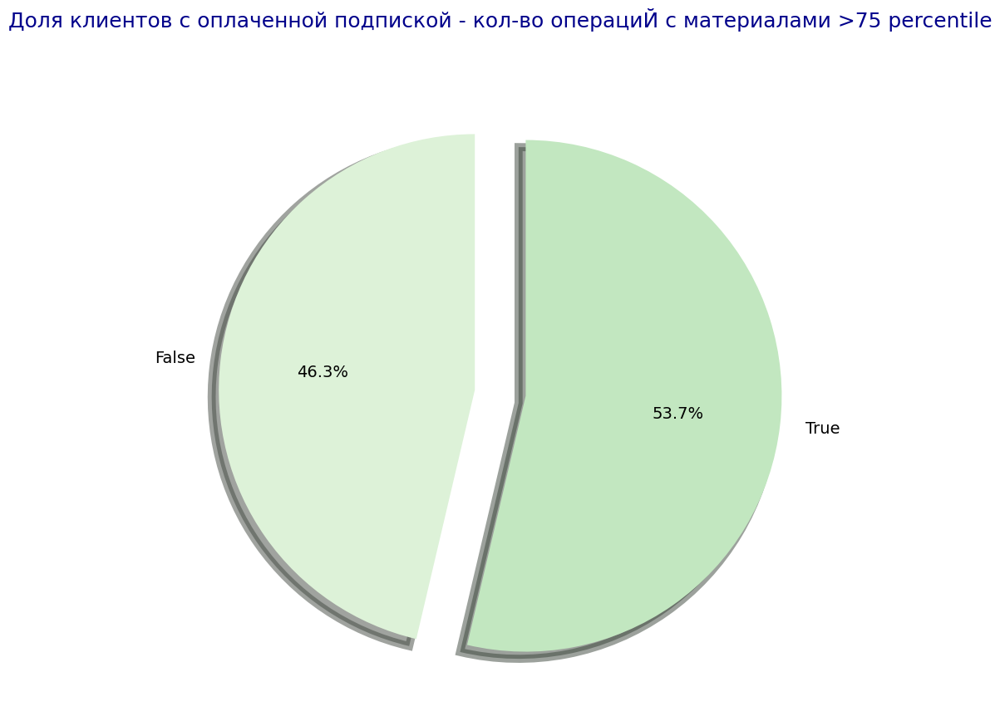

In [132]:
# Построим круговую диаграмма Доля клиентов с оплаченной подпиской для каждой группы (по кол-ву операций resource_orders)
for i in temp['segment_resource_orders'].unique():
    maker_pie(temp.loc[temp['segment_resource_orders']==i], 'company_count', 'is_payed', f'Доля клиентов с оплаченной подпиской - кол-во операциЙ с материалами {i}', 14)

___________
**Промежуточный вывод:**

Этот шаг близок к открытию!

Чем меньше операций с материалами в сервисе, тем больше вероятность оттока клиента.

- кол-во операци до 25 персентиля по полю all_resource_orders - отток 96%;
-  кол-во операци 26-50 персентилей по полю all_resource_orders - отток 67%;
-  кол-во операци 50-75 персентилей по полю all_resource_orders - отток 57%;
- кол-во операци выше 75 персентиля по полю all_resource_orders - отток 46%.

Аналогичное исследование можно провести по операиям со складами и проектами.
_______________
____________

#### **2.5.3. Корреляционный анализ числовых столбцов в датафрейме companies1**

____________
__________
https://www.codecamp.ru/blog/correlation-in-python/

https://habr.com/ru/articles/683442/

https://www.dmitrymakarov.ru/opt/relationship-03/#3-korrelyatsiya

Если распределение переменных нормальное или несущественно отличается от нормального, применяют **коэффициент корреляции Пирсона**.

Для порядковых (ранговых) переменных или переменных, чье распределение существенно отличается от нормального, используется **коэффициент корреляции Спирмана или Кендалла**.

**В нашем случае рассчитывать будем корреляцию числовых столбцов, следовательно, будем использовать коэффициент корреляции Пирсона**.

Коэффициент корреляции Пирсона - мера линейной связи между двумя переменными.

Он принимает значение от -1 до 1, где:

- -1 указывает на совершенно отрицательную линейную корреляцию между двумя переменные;
- 0 указывает на отсутствие линейной корреляции между двумя переменными;
- 1 указывает на совершенно положительную линейную корреляцию между двумя переменными.

Один из самых быстрых и самых простых способов определить наличие корреляции между двумя переменными состоит в том, чтобы рассмотреть их на **графике рассеяния (scatter plot).**

Вычисление корреляции между несколькими переменными в Pandas DataFrame - **функция df.corr()**

Чтобы проверить, является ли корреляция статистически значимой,можно рассчитать p-значение, связанное с коэффициентом корреляции Пирсона, с помощью **Scipy pearsonr()**, которая возвращает коэффициент корреляции Пирсона вместе с двусторонним p-значением.

Если значение p меньше 0,05, значит существует статистически значимая корреляция между двумя переменными.

Для оценки результатов корреляционного анализа используют **шкалу Чеддока**:
- слабая — от 0,1 до 0,3;
- умеренная — от 0,3 до 0,5;
- заметная — от 0,5 до 0,7;
- высокая — от 0,7 до 0,9;
- весьма высокая (сильная) — от 0,9 до 1,0.

В последние годы все чаще применяется **шкала Эванса**.
___________
__________

##### **2.5.3.1. Корреляционный анализ функция df.corr()**

In [133]:
# Выберем из датафремв companies1 числовые столбцы
comp = companies1[['work_years', 'all_billing',
       'all_stocks', 'all_backups', 'all_projects', 'all_contractors',
       'all_resource_orders', 'all_activities', 'all_activities_2023',
       'all_activities_2024', 'count_pay_date',
       'billing_tariff_id', 'billing_tariff_price_id',
       'is_payed', 'employer_count_interval',
       'diff_last_activities', 'diff_created_at',
       'diff_updated_at']]

In [134]:
# Построим матрицу корреляций
corr_comp = comp.corr()
corr_comp

,work_years,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,count_pay_date,billing_tariff_id,billing_tariff_price_id,is_payed,employer_count_interval,diff_last_activities,diff_created_at,diff_updated_at
work_years,1.00,0.40,0.42,0.30,0.41,0.39,0.29,0.46,0.34,0.16,0.23,-0.02,0.03,0.23,0.09,-0.41,0.22,-0.06
all_billing,0.40,1.00,0.35,0.17,0.36,0.24,0.05,0.30,0.04,0.00,0.48,-0.01,-0.08,-0.03,-0.01,0.00,0.30,0.06
all_stocks,0.42,0.35,1.00,0.29,0.99,0.58,0.38,0.88,0.54,0.19,0.26,0.05,0.08,0.11,0.08,-0.21,0.07,-0.08
all_backups,0.30,0.17,0.29,1.00,0.28,0.31,0.21,0.39,0.15,0.01,0.14,-0.06,-0.08,0.01,0.19,-0.11,0.11,0.03
all_projects,0.41,0.36,0.99,0.28,1.00,0.56,0.34,0.86,0.52,0.18,0.27,0.05,0.08,0.09,0.06,-0.21,0.07,-0.09
all_contractors,0.39,0.24,0.58,0.31,0.56,1.00,0.54,0.78,0.60,0.28,0.20,-0.00,0.08,0.19,0.14,-0.27,-0.01,-0.09
all_resource_orders,0.29,0.05,0.38,0.21,0.34,0.54,1.00,0.74,0.71,0.46,0.05,-0.00,0.10,0.26,0.18,-0.27,-0.09,-0.07
all_activities,0.46,0.30,0.88,0.39,0.86,0.78,0.74,1.00,0.73,0.35,0.23,0.02,0.10,0.20,0.16,-0.30,0.01,-0.09
all_activities_2023,0.34,0.04,0.54,0.15,0.52,0.60,0.71,0.73,1.00,0.43,0.02,0.04,0.21,0.42,0.17,-0.44,-0.24,-0.18
all_activities_2024,0.16,0.00,0.19,0.01,0.18,0.28,0.46,0.35,0.43,1.00,-0.02,0.11,0.07,0.41,0.03,-0.34,-0.32,-0.24


In [135]:
# Объявим функцию построения heatmap
def heatmap_corr2(df, col):
    plt.figure(figsize=(16, 10))
    sns.heatmap(df.corr().loc[:,[col]].drop(col).sort_values(col), fmt = '.0%', annot=True, cmap='tab20c', annot_kws={"size":14, 'color':'black'}, alpha = 0.6, center=0)
    plt.xticks(size=16)
    plt.yticks(size=16)
    plt.show

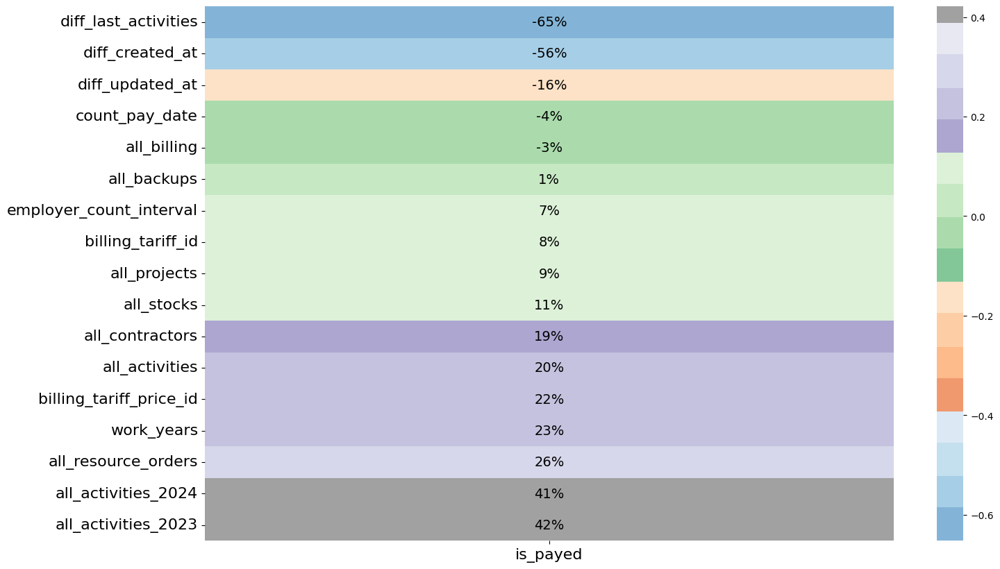

In [136]:
# Построим heatmap по столбцу is_payed
heatmap_corr2(comp, 'is_payed')

____________
____________
**Промежуточный вывод:**

Целевая переменная 'is_payed' имеет корреляционные связи со следующими столбцами:
- diff_last_activities - 65% значимая отрицательная;
- diff_created_at - 56% значимая отрицательная;
- diff_updated_at - 16% слабая отрицательная;
- all_activities_2023 42% умеренная положительня.

Вроде все логично: чем дальше срок от последней активности, даты регистрации в сервисе, обновления данных в сервисе, тем больше верояность оттока клиента.

Чем больше активность в сервисе, тем меньше вероятность оттока клиента.
____________
____________

##### **2.5.3.2. Корреляционный анализ с помощью scipy.stats.stats**

In [137]:
# Рассчитаем к-т Пирсона с помощью scipy.stats.stats
from scipy.stats.stats import pearsonr
pearsonr(companies1['is_payed'], companies1['diff_last_activities'])

PearsonRResult(statistic=-0.6520607780068278, pvalue=1.129563123572969e-87)

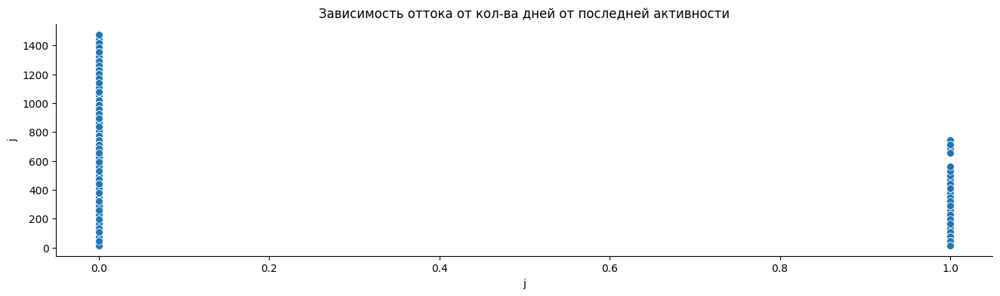

In [138]:
# Построим scatterplot
ig, axes = plt.subplots(figsize=(16, 4))
fig.suptitle('hh')
axes.set_title('Зависимость оттока от кол-ва дней от последней активности')
sns.scatterplot(
    data=companies1,
    x='is_payed', y='diff_last_activities',
    s=50,
    ax=axes)
axes.set_xlabel('j')
axes.set_ylabel('j')
plt.show()

In [139]:
# Рассчитаем к-т Пирсона с помощью scipy.stats.stats
pearsonr(companies1['is_payed'], companies1['diff_created_at'])

PearsonRResult(statistic=-0.556823015742161, pvalue=2.2240284571840766e-59)

In [140]:
# Рассчитаем к-т Пирсона с помощью scipy.stats.stats
pearsonr(companies1['is_payed'], companies1['diff_updated_at'])

PearsonRResult(statistic=-0.15669253846283082, pvalue=2.6037242747062975e-05)

In [141]:
# Рассчитаем к-т Пирсона с помощью scipy.stats.stats
pearsonr(companies1['is_payed'], companies1['all_activities_2023'])

PearsonRResult(statistic=0.4212184953057349, pvalue=4.474460399647684e-32)

_________
_________
**Промежуточный вывод:**

pearsonr дает тот же к-т корреляции, что и функция df.corr(), единственное отличие - проверка на статистическую значимость.

р-value меньше 0.05, следовательно, статистическая значимость есть.
____________
___________

##### **2.5.3.3. Корреляционный анализ с помощью phik**

https://dzen.ru/a/ZEtcuc4K2RX_Jstr

Этот метод более универсален, чем многие другие, так как позволяется вычислять взаимосвязи между различными типами признаков (категориальными, непрерывными и их комбинациями)

Суть метода базируется на подсчете **хи-квадрат статистики**, затем ее трансформации в нечто подобное коэффициенту корреляции только на отрезке от 0 (нулевая взаимосвязь) до 1 (максимальная взаимосвязь).

Коэффициенты взаимосвязи считаются путем вызова **метода phik_matrix библиотеки phik.**

Этим методом связь диагностируется, даже в том случае, если корреляция Пирсона выводит близкое к нулю значение.


In [142]:
# установим библиотеку phik
%%capture
! pip install phik

In [143]:
# Построим матрицу phik_matrix
import phik
comp.phik_matrix()

interval columns not set, guessing: ['work_years', 'all_billing', 'all_stocks', 'all_backups', 'all_projects', 'all_contractors', 'all_resource_orders', 'all_activities', 'all_activities_2023', 'all_activities_2024', 'count_pay_date', 'billing_tariff_id', 'billing_tariff_price_id', 'employer_count_interval', 'diff_last_activities', 'diff_created_at', 'diff_updated_at']


,work_years,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,count_pay_date,billing_tariff_id,billing_tariff_price_id,is_payed,employer_count_interval,diff_last_activities,diff_created_at,diff_updated_at
work_years,1.00,0.64,0.51,0.48,0.56,0.39,0.35,0.66,0.47,0.25,0.22,0.00,0.00,0.19,0.07,0.50,0.48,0.38
all_billing,0.64,1.00,0.66,0.55,0.69,0.29,0.09,0.60,0.00,0.00,0.75,0.00,0.10,0.00,0.00,0.23,0.38,0.00
all_stocks,0.51,0.66,1.00,0.58,0.97,0.67,0.63,0.94,0.88,0.48,0.46,0.00,0.00,0.07,0.00,0.00,0.05,0.33
all_backups,0.48,0.55,0.58,1.00,0.65,0.57,0.48,0.74,0.41,0.00,0.43,0.13,0.00,0.15,0.22,0.20,0.25,0.00
all_projects,0.56,0.69,0.97,0.65,1.00,0.71,0.58,0.93,0.83,0.42,0.52,0.06,0.00,0.08,0.00,0.00,0.00,0.17
all_contractors,0.39,0.29,0.67,0.57,0.71,1.00,0.66,0.82,0.67,0.37,0.42,0.10,0.00,0.28,0.24,0.12,0.00,0.22
all_resource_orders,0.35,0.09,0.63,0.48,0.58,0.66,1.00,0.83,0.78,0.60,0.00,0.30,0.15,0.22,0.26,0.00,0.00,0.48
all_activities,0.66,0.60,0.94,0.74,0.93,0.82,0.83,1.00,0.91,0.64,0.39,0.19,0.19,0.18,0.21,0.00,0.00,0.31
all_activities_2023,0.47,0.00,0.88,0.41,0.83,0.67,0.78,0.91,1.00,0.74,0.00,0.13,0.13,0.51,0.25,0.37,0.34,0.41
all_activities_2024,0.25,0.00,0.48,0.00,0.42,0.37,0.60,0.64,0.74,1.00,0.00,0.35,0.38,0.56,0.00,0.32,0.36,0.19


____________
___________
**Промежуточный вывод:**

Целевая переменная 'is_payed' имеет корреляционные связи со следующими столбцами:
- diff_last_activities - 90%;
- diff_created_at - 76%;
- diff_updated_at - 55%;
- all_activities_2023  - 51%.

Библиотека phik также подтвердила корреляцию между столбцами.
____________
___________

## **3.  Сегментация клиентской базы и проверка гипотез (основной раздел)**

### **3.0. Задачи раздела**


**В данном разделе проекта нужно ответить на следующие вопросы:**

- как выглядит портрет типичного клиента сервиса Gectaro;
- есть ли какая-то связь между описанными в EDA признаками пользователя и целевой переменной?
- есть ли зависимость уходов компаний от их размера?
- с каких тарифов уходят чаще (предположите, почему)?
  - проследите динамику ухода с разных тарифов по годам.
  - посмотрите на поле billing_tariff_price_id (отражает изменение цены одного и того же тарифа). Влияет ли это поле на целевую переменную?

***!!! обратите внимание:***

тарифы с течением времени появляются, исчезают и изменяются.

**Исследование активностей компаний:**

Сервис предлагает широкий спектр возможностей по
управлению процессами и фиксированию активностей в приложении.

Исследуйте активность компаний, как суммарную, так и с течением времени:
- Есть ли связь между активностями компаний и целевой переменной?
- Какие активности были бы наиболее полезны для прогноза скорого ухода компании?
- Одинаковую или разную активность проявляют компании на разных тарифах?
- С чем это может быть связано?

При ответе на вопросы требуется использовать не только качественные, но и количественные методы проверки статистических гипотез.

Выбор статистических критериев должен быть обоснован.

### **3.1. Сегментация клиентской базы**

#### **3.1.1. RFM анализ**

https://vc.ru/marketing/640015-rfm-analiz-chto-eto-takoe-i-kak-sdelat

https://habr.com/ru/companies/mindbox/articles/420915/

https://kontur.ru/compass/spravka-compass/48043-rfmanaliz_klientskoj_bazy

https://alimbekov.com/rfm-python/

**RFM-анализ** — это способ сегментации клиентов.

Сегментами называются непересекающиеся группы клиентов.

RFM-анализ предлагает для каждого клиента выделить три признака:
- R (Recency) — насколько давно клиент сделал последний заказ.
- F (Frequency) — сколько всего заказов сделал клиент.
- M (Monetary) — сколько денег клиент потратил.

Клиентов делят на группы по каждому признаку.

Обычно таких групп не больше пяти.

Пересечения групп называют сегментами.

**Основная сложность** — определить границы групп. Определенного правила, как это делать, нет.

Наиболее популярные подходы:
- разделение на равные части по диапазонам значений;
- разделение на равные части по количеству потребителей;
- ручное разделение на основании проведенного анализа;
- автоматизированное разделение (специальное ПО).

___________
___________
В данном проекте информации о том, сколько клиент потратил денег в сервесе Gectaro нет.

Следовательно, ограничимся RF- анализом.

В качестве клиентской базы возьмем дйствующих клиентов (тариф оплачен), имевших активность в последние 365 дней.

**Примечание:**
- RFM анализ работает на большом количестве данных (более 1000 клиентов);
- RFM анализ проводят регулярно, так как клиенты постоянно мигрируют из группы в группу или вообще уходят (период определяется маркетинговой стратегией);
- RFM не учитывает контекст покупок и поведенческие особенности покупателей.



___________
___________



In [144]:
# Создадим новый на базе датафрейма companies1 датафрейм rfm_company для rfm анализа
rfm_company = companies1.copy(deep=True)
rfm_company = rfm_company.loc[(rfm_company['is_payed']==True) & (rfm_company['diff_last_activities']<365)][['company_id', 'diff_last_activities', 'all_activities']]
rfm_company.rename(columns = {'diff_last_activities':'recency', 'all_activities':'frequency'}, inplace = True )
rfm_company.head(2)

,company_id,recency,frequency
13,383,167,19
14,408,136,613


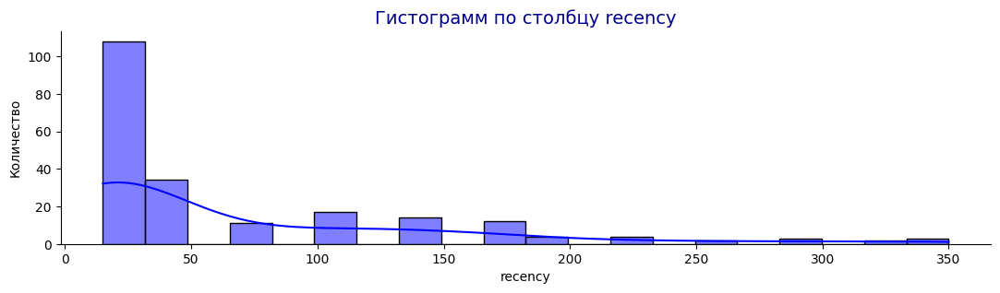

In [145]:
maker_hist(rfm_company ['recency'], 20)

In [146]:
rfm_company ['recency'].describe()

count   214.00
mean     67.41
std      77.65
min      15.00
25%      15.00
50%      15.00
75%     106.00
max     350.00
Name: recency, dtype: float64

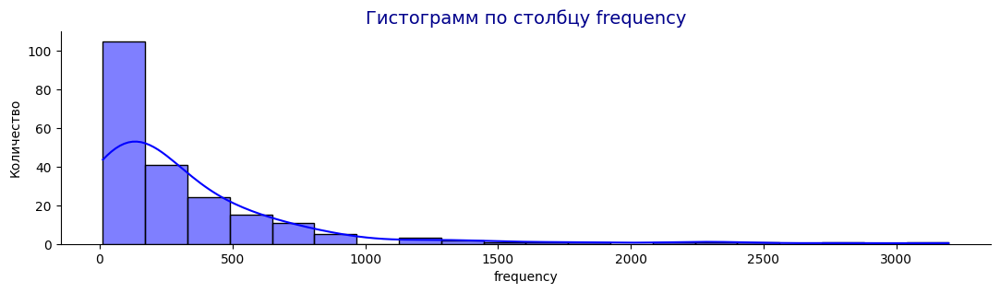

In [147]:
maker_hist(rfm_company ['frequency'], 20)

In [148]:
rfm_company ['frequency'].describe()

count     214.00
mean      341.15
std       473.32
min        12.00
25%        71.50
50%       175.00
75%       426.50
max     3,197.00
Name: frequency, dtype: float64

______________
_____________
За последнии 365 дней в сервесе Gectaro было всего 231 клиент с оплаченной подпиской.

Согласно теории RFM анализа период слишком большой, а клиентов слишком мало.

Так как это учебный проект, выполним RFM анализ.
____________
___________

In [149]:
quantiles = rfm_company[['recency',	'frequency']].quantile(q=[0.25, 0.50, 0.75])
quantiles = quantiles.to_dict()

def RScore(x,p,d):
     if x <= d[p][0.25]:
         return 1
     elif x <= d[p][0.50]:
         return 2
     elif x <= d[p][0.75]:
         return 3
     else:
         return 4

def RScore2(x,p,d):
     if x <= d[p][0.25]:
         return 4
     elif x <= d[p][0.50]:
         return 3
     elif x <= d[p][0.75]:
         return 2
     else:
         return 1

rfm_company['rfm_recency'] = rfm_company['recency'].apply(RScore2, args=('recency',quantiles,))
rfm_company['rfm_frequency'] = rfm_company['frequency'].apply(RScore, args=('frequency',quantiles,))

rfm_company['RFMScore'] = rfm_company.rfm_recency.map(str) + rfm_company.rfm_frequency.map(str)
rfm_company.head(2)

,company_id,recency,frequency,rfm_recency,rfm_frequency,RFMScore
13,383,167,19,1,1,11
14,408,136,613,1,4,14


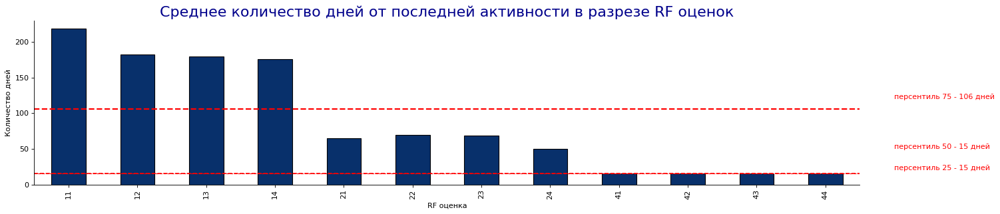

In [150]:
# Построим график Среднее количество дней от последней активности в разрезе RF оценок
fig=plt.figure(figsize=(20, 4), dpi= 80, facecolor='w', edgecolor='k')
p1 = int(np.percentile (rfm_company['recency'], 25))
p2 = int(np.percentile (rfm_company['recency'], 50))
p3 = int(np.percentile (rfm_company['recency'], 75))
rfm_company.groupby('RFMScore').agg('recency').mean().plot(kind='bar', colormap='Blues_r', edgecolor = 'black')
plt.axhline (y=p1, color = 'red', linestyle='--', linewidth= 1)
plt.text(12, 20, f'персентиль 25 - {p1} дней', fontsize=10, color="r")
plt.axhline (y=p2, color = 'red', linestyle='--', linewidth= 1.5)
plt.text(12, 50, f'персентиль 50 - {p2} дней', fontsize=10, color="r")
plt.axhline (y=p3, color = 'red', linestyle='--', linewidth= 2)
plt.text(12, 120, f'персентиль 75 - {p3} дней', fontsize=10, color="r")
plt.title('Среднее количество дней от последней активности в разрезе RF оценок', size=20, color='darkblue')
plt.ylabel('Количество дней')
plt.xlabel('RF оценка')
plt.show()

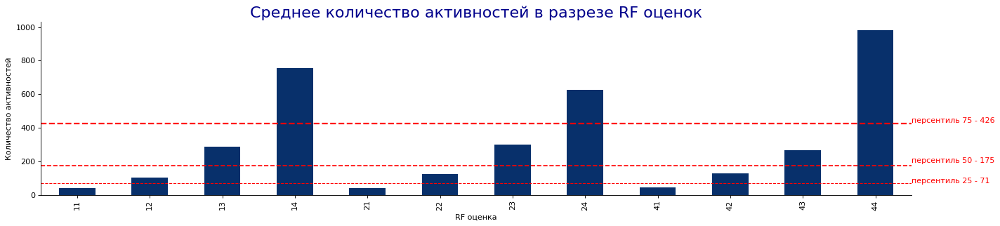

In [151]:
# Построим график Среднее количество активностей в разрезе RF оценок
fig=plt.figure(figsize=(20, 4), dpi= 80, facecolor='w', edgecolor='k')
p1 = int(np.percentile (rfm_company['frequency'], 25))
p2 = int(np.percentile (rfm_company['frequency'], 50))
p3 = int(np.percentile (rfm_company['frequency'], 75))
rfm_company.groupby('RFMScore').agg('frequency').mean().plot(kind='bar', colormap='Blues_r')
plt.axhline (y=p1, color = 'red', linestyle='--', linewidth= 1)
plt.text(11.5, 70, f'персентиль 25 - {p1}', fontsize=10, color="r")
plt.axhline (y=p2, color = 'red', linestyle='--', linewidth= 1.5)
plt.text(11.5, 190, f'персентиль 50 - {p2}', fontsize=10, color="r")
plt.axhline (y=p3, color = 'red', linestyle='--', linewidth= 2)
plt.text(11.5, 430, f'персентиль 75 - {p3}', fontsize=10, color="r")
plt.title('Среднее количество активностей в разрезе RF оценок', size=20, color='darkblue')
plt.ylabel('Количество активностей')
plt.xlabel('RF оценка')
plt.show()

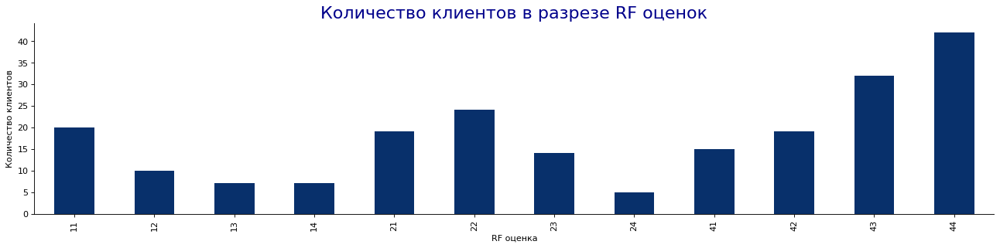

In [152]:
# Построим график количество rkbtynjd в разрезе RF оценок
fig=plt.figure(figsize=(20, 4), dpi= 80, facecolor='w', edgecolor='k')
bar = rfm_company.groupby('RFMScore').agg('company_id').count().plot(kind='bar', colormap='Blues_r')
plt.title('Количество клиентов в разрезе RF оценок', size=20, color='darkblue')
plt.ylabel('Количество клиентов')
plt.xlabel('RF оценка')
plt.show()

In [153]:
# Построим rf_matrix
rf_matrix = rfm_company.pivot_table(index='rfm_recency', columns = 'rfm_frequency', values = 'company_id', aggfunc = 'count')
rf_matrix

rfm_frequency,1,2,3,4
rfm_recency,,,,
1,20,10,7,7
2,19,24,14,5
4,15,19,32,42


___________________
______________________
**Промежуточный вывод:**
- 42 компании имеют RF оценку 44 (много свежих активностей);
- 20 компании имеют RF оценку 11 (мало активностей и их давно не было);

11, 12, 21, 22 - оценки компаний близких к оттоку;

44, 43, 34, 33 - оценки компаний лидеров по активности.
_______________
______________

#### **3.1.2. Портрет пользователя сервиса Gectaro**

In [154]:
# Сгруппируем companies1 по тарифам и количеству сотрудников
companies_segment = companies1.pivot_table(index = ['type_tariff', 'employer_count'], columns = 'is_payed', values = 'company_id', aggfunc = 'count')
companies_segment = companies_segment.fillna(0)
companies_segment.columns = ['not_is_payed', 'is_payed']
companies_segment['%_out'] = (companies_segment['not_is_payed']/(companies_segment['is_payed'] + companies_segment['not_is_payed']))*100
companies_segment['all_companie'] = companies1['company_id'].count()
companies_segment['companie_segment'] = companies_segment['not_is_payed'] + companies_segment['is_payed']
companies_segment['%_companie_segment'] = (companies_segment['companie_segment']/companies_segment['all_companie'])*100
companies_segment.reset_index().sort_values(by='%_companie_segment', ascending = False).head(10)

,type_tariff,employer_count,not_is_payed,is_payed,%_out,all_companie,companie_segment,%_companie_segment
20,старт,1-4,208.00,67.00,75.64,714,275.00,38.52
0,базовый,1-4,116.00,66.00,63.74,714,182.00,25.49
5,базовый,5-10,68.00,42.00,61.82,714,110.00,15.41
24,старт,5-10,22.00,4.00,84.62,714,26.00,3.64
8,бизнес,1-4,7.00,16.00,30.43,714,23.00,3.22
2,базовый,11-20,12.00,7.00,63.16,714,19.00,2.66
9,бизнес,11-20,7.00,7.00,50.00,714,14.00,1.96
14,профи,1-4,9.00,3.00,75.00,714,12.00,1.68
21,старт,11-20,6.00,4.00,60.00,714,10.00,1.40
12,бизнес,5-10,4.00,4.00,50.00,714,8.00,1.12


_________________
_________________
**Промежуточный вывод:**

Основная масса клиентов - компании с численностью 1-10 человек с тарифом старт и базовый.

Можно выделить 4 сегмента:

1 - тариф старт, 1-4 сотрудника;
2 - тариф базовый, 1-4 сотрудника;
3 - тариф базовый, 5-10 сотрудников;
4 - прочие.

Первые 3 сегмента охватывают 79% клиентов.

На данном уровне детализации отточные и действующие клиенты, относятся к одним и тем же сигментам.

Выделять дополнительные сегменты не имеет смысла, в них будет 1-10 клиентов, то есть не достаточно для статистически значимых выводов.
____________
___________

In [155]:
# Объявим функцию для создания столбца сегмент (по тарифу и количеству сотрудников)
def segment_maker(row):
    if row['type_tariff'] == 'старт' and row['employer_count']	 == '1-4':
        return 'segment1'
    elif row['type_tariff'] == 'базовый' and row['employer_count']	 == '1-4':
        return 'segment2'
    elif row['type_tariff'] == 'базовый' and row['employer_count']	 == '5-10':
        return 'segment3'
    else:
        return 'other'

In [156]:
# Создадим столбец segment в датафрейме companies1
companies1['segment'] = companies1.apply(segment_maker, axis=1)
companies1.head(2)

,company_id,work_years,last_month_activities,all_billing,all_stocks,all_backups,all_projects,all_contractors,all_resource_orders,all_activities,all_activities_2023,all_activities_2024,last_pay_date,payed_until,count_pay_date,billing_tariff_id,billing_tariff_price_id,type_tariff,is_payed,employer_count_interval,created_at,updated_at,employer_count,working_direction_2,count_users,last_date_project,diff_last_activities,diff_created_at,diff_updated_at,year_until,segment
0,1,2,2020-11-01,3,58,17,56,16,0,150,0.00,0.00,0,2020-10-25,0.00,3.00,10.00,профи,False,3,2019-01-23,2022-12-06,11-20,строительство,2,2024-03-16,1231,1879,466,2020,other
1,21,5,2023-05-01,21,84,0,83,127,15,330,150.00,0.00,2023-01-19 00:00:00,2023-04-30,5.00,7.00,23.00,старт,False,1,2019-01-31,2023-04-30,1-4,строительство,3,2024-03-16,320,1871,321,2023,segment1


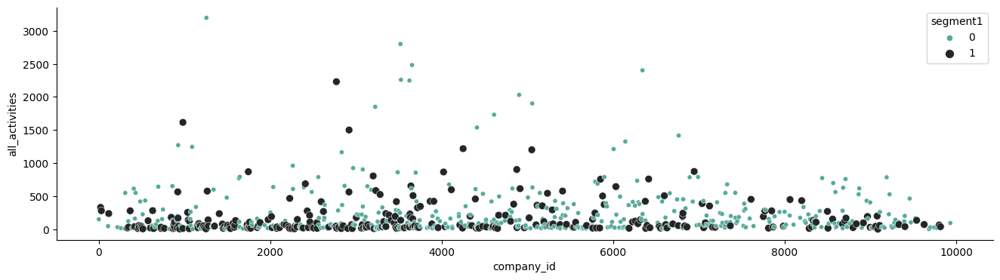

In [157]:
# Построим scatterplot
# Неудачная визуализация
temp = companies1[['company_id', 'all_activities', 'segment', 'employer_count', 'type_tariff']]
temp['segment1'] = 1
temp.loc[temp['segment']!='segment1', 'segment1'] = 0
plt.figure(figsize=(16, 4))
sns.scatterplot(data=temp,
                x="company_id",
                y="all_activities",
                hue = 'segment1',
                palette='dark:#5A9_r',
                size = 'segment1',
                sizes=(50, 20),);

In [158]:
# Построим таблицы описания действующих клиентов в разрезе сегментов 'is_payed'==True
for i in companies1['segment'].unique()[1:]:
    s = companies1.loc[(companies1['segment']==i) & (companies1['is_payed']==True)].pivot_table(index = ['work_years', 'count_pay_date', 'count_users', 'diff_created_at', 'diff_updated_at'], values = 'company_id', aggfunc = 'count')
    s = s.fillna(0)
    s = s.reset_index()
    s.columns = ['work_years', 'count_pay_date', 'count_users', 'diff_created_at', 'diff_updated_at', 'company_id']
    print(f'Описание {i}')
    print()
    display(s.sort_values(by='company_id', ascending=False).head(10))
    display(s.describe())
    print()
    print()


Описание segment1



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
0,1,1.00,1,224,206,1
50,3,1.00,2,612,366,1
36,2,1.00,3,214,204,1
37,2,1.00,3,264,144,1
38,2,1.00,3,324,323,1
39,2,1.00,3,354,323,1
40,2,1.00,3,432,128,1
41,2,1.00,3,459,228,1
42,2,1.00,3,504,390,1
43,2,1.00,3,628,401,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,67.00,67.00,67.00,67.00,67.00
mean,2.28,1.01,533.33,332.81,1.00
std,0.93,0.12,332.78,240.18,0.00
min,1.00,1.00,53.00,9.00,1.00
25%,2.00,1.00,235.50,156.50,1.00
50%,2.00,1.00,515.00,267.00,1.00
75%,3.00,1.00,789.50,477.00,1.00
max,5.00,2.00,"1,571.00",995.00,1.00




Описание segment3



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
0,1,1.00,3,250,250,1
31,3,1.00,4 и более,670,549,1
23,3,1.00,3,999,139,1
24,3,1.00,4 и более,454,404,1
25,3,1.00,4 и более,508,310,1
26,3,1.00,4 и более,515,77,1
27,3,1.00,4 и более,579,505,1
28,3,1.00,4 и более,582,124,1
29,3,1.00,4 и более,618,583,1
30,3,1.00,4 и более,662,192,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,42.00,42.00,42.00,42.00,42.00
mean,2.43,1.02,591.83,359.83,1.00
std,0.89,0.15,323.09,239.60,0.00
min,1.00,1.00,103.00,3.00,1.00
25%,2.00,1.00,337.25,145.00,1.00
50%,2.00,1.00,580.50,346.00,1.00
75%,3.00,1.00,768.75,567.25,1.00
max,4.00,2.00,"1,677.00",771.00,1.00




Описание segment2



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
0,1,1.00,1,281,269,1
49,3,1.00,2,486,10,1
35,2,1.00,4 и более,179,172,1
36,2,1.00,4 и более,190,179,1
37,2,1.00,4 и более,239,227,1
38,2,1.00,4 и более,288,276,1
39,2,1.00,4 и более,334,331,1
40,2,1.00,4 и более,404,373,1
41,2,1.00,4 и более,428,420,1
42,2,1.00,4 и более,430,429,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,66.00,66.00,66.00,66.00,66.00
mean,2.15,1.00,500.61,294.85,1.00
std,0.96,0.00,351.69,189.54,0.00
min,1.00,1.00,38.00,10.00,1.00
25%,2.00,1.00,212.25,142.50,1.00
50%,2.00,1.00,399.00,280.00,1.00
75%,3.00,1.00,750.25,423.75,1.00
max,5.00,1.00,"1,452.00",809.00,1.00


In [159]:
# Изучим активности действующих клиентов в разрезе сегментов и видов активностей
activities_work_companies = companies1.loc[companies1['is_payed']==True].pivot_table(
    index = 'segment',
    values = ['company_id', 'all_billing', 'all_stocks', 'all_backups', 'all_projects', 'all_contractors', 'all_resource_orders'],
    aggfunc = ({'company_id':'count', 'all_billing':'sum', 'all_stocks':'sum', 'all_backups':'sum', 'all_projects':'sum', 'all_contractors':'sum', 'all_resource_orders':'sum'})
    )
activities_work_companies['mean_billing'] = round(activities_work_companies['all_billing']/activities_work_companies['company_id'])
activities_work_companies['mean_stocks'] = round(activities_work_companies['all_stocks']/activities_work_companies['company_id'])
activities_work_companies['mean_backups'] = round(activities_work_companies['all_backups']/activities_work_companies['company_id'])
activities_work_companies['mean_projects'] = round(activities_work_companies['all_projects']/activities_work_companies['company_id'])
activities_work_companies['mean_contractors'] = round(activities_work_companies['all_contractors']/activities_work_companies['company_id'])
activities_work_companies['mean_resource_orders'] = round(activities_work_companies['all_resource_orders']/activities_work_companies['company_id'])
activities_work_companies = activities_work_companies[['company_id', 'mean_billing', 'mean_stocks', 'mean_backups', 'mean_projects', 'mean_contractors', 'mean_resource_orders']]
activities_work_companies

,company_id,mean_billing,mean_stocks,mean_backups,mean_projects,mean_contractors,mean_resource_orders
segment,,,,,,,
other,59,3.00,88.00,14.00,79.00,84.00,157.00
segment1,67,3.00,80.00,0.00,78.00,54.00,59.00
segment2,66,3.00,50.00,8.00,47.00,61.00,107.00
segment3,42,3.00,61.00,16.00,53.00,71.00,147.00


In [160]:
# Изучим активности действующих клиентов в разрезе сегментов и времени активностей
all_activities_work_companies = companies1.loc[companies1['is_payed']==True].pivot_table(
    index = 'segment',
    values = ['company_id', 'all_activities', 'all_activities_2023', 'all_activities_2024'],
    aggfunc = ({'company_id':'count', 'all_activities':'sum', 'all_activities_2023':'sum', 'all_activities_2024':'sum'})
    )
all_activities_work_companies['mean_all_activities'] = round(all_activities_work_companies['all_activities']/all_activities_work_companies['company_id'])
all_activities_work_companies['mean_all_activities_2023'] = round(all_activities_work_companies['all_activities_2023']/all_activities_work_companies['company_id'])
all_activities_work_companies['mean_all_activities_2024'] = round(all_activities_work_companies['all_activities_2024']/all_activities_work_companies['company_id'])
all_activities_work_companies = all_activities_work_companies[['company_id', 'mean_all_activities', 'mean_all_activities_2023', 'mean_all_activities_2024']]
all_activities_work_companies

,company_id,mean_all_activities,mean_all_activities_2023,mean_all_activities_2024
segment,,,,
other,59,425.00,224.00,77.00
segment1,67,274.00,126.00,30.00
segment2,66,277.00,157.00,55.00
segment3,42,351.00,171.00,36.00


_____________
____________
**Портрет действующих пользователей:**


| Характеристика | Сегмент 1 | Сегмент 2 | Сегмент 3 |
|---------------|-------------------|-------------------|-------------------|
|кол-во пользователей в сегмента              |67 |66|42|
|тариф              |старт|базовый|базовый|
|кол-во сотрудников              |1-4|1-4|5-10 |
|кол-во дней от регистрации в Gectaro           |53-1571|38-1452|103-1677|
|кол-во дней от последнего обновления в Gectaro           |9-995|10-809|3-771|
|кол-во активных лет в Gectaro             |1-3|1-3|1-4|
|кол-во дат проплаты тарифа            |1-2|1|1-2|
|кол-во пользователей в Gectaro             |1-3|1-4|3-4|
|среднее кол-во операций со счетами на 1 компанию            |3|3|3|
|среднее кол-во операций со складами на 1 компанию            |80|50|61|
|среднее кол-во операций бэкап на 1 компанию           |0|8|16|
|среднее кол-во проектов на 1 компанию            |78|47|53|
|среднее котрагентов на 1 компанию            |54|61|71|
|среднее кол-во операций с материалами на 1 компанию            |59|107|147|
|среднее кол-во активностей на 1 компанию 2019-2024 гг         |274|277|351|
|среднее кол-во активностей на 1 компанию 2023 г         |126|157|171|
|среднее кол-во активностей на 1 компанию з м-ца 2024 г        |30|55|36|

 -  медианное количество активных лет в сервисе Gectaro - 2 года;.
 -  медианное кол-во оплат тарифа - 1.
 - основные активности в сервисе: проекты, склады, материалы;
 - невостребованные операции: счета, бэкап.

 Данные предоставлены за период 2019-2021 гг., а более половины активных клиентов имеют 1 проплату и срок работы в сервисе 2 года.
___________
__________

In [161]:
# Построим таблицы описания отточных клиентов в разрезе сегментов 'is_payed'==false
for i in companies1['segment'].unique()[1:]:
    s = companies1.loc[(companies1['segment']==i) & (companies1['is_payed']==False)].pivot_table(index = ['work_years', 'count_pay_date', 'count_users', 'diff_created_at', 'diff_updated_at'], values = 'company_id', aggfunc = 'count')
    s = s.fillna(0)
    s = s.reset_index()
    s.columns = ['work_years', 'count_pay_date', 'count_users', 'diff_created_at', 'diff_updated_at', 'company_id']
    print(f'Описание {i}')
    print()
    display(s.sort_values(by='company_id', ascending=False).head(10))
    display(s.describe())
    print()
    print()

Описание segment1



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
26,1,0.00,3,1440,466,2
22,1,0.00,3,1293,466,2
18,1,0.00,2,1418,466,2
140,2,1.00,3,693,75,1
131,2,1.00,2,1215,466,1
132,2,1.00,2,1233,466,1
133,2,1.00,2,1517,466,1
134,2,1.00,3,250,51,1
135,2,1.00,3,452,17,1
136,2,1.00,3,599,225,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,205.00,205.00,205.00,205.00,205.00
mean,1.83,1.03,"1,097.07",382.94,1.01
std,0.74,1.30,342.44,141.79,0.12
min,1.00,0.00,86.00,9.00,1.00
25%,1.00,0.00,907.00,352.00,1.00
50%,2.00,1.00,"1,118.00",466.00,1.00
75%,2.00,1.00,"1,332.00",466.00,1.00
max,5.00,13.00,"1,871.00",466.00,2.00




Описание segment3



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
41,2,1.00,4 и более,1075,466,2
0,1,0.00,4 и более,1416,466,1
50,3,1.00,2,1870,466,1
36,2,1.00,4 и более,850,466,1
37,2,1.00,4 и более,858,236,1
38,2,1.00,4 и более,1002,466,1
39,2,1.00,4 и более,1024,466,1
40,2,1.00,4 и более,1058,466,1
42,2,1.00,4 и более,1096,466,1
43,2,1.00,4 и более,1306,466,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,67.00,67.00,67.00,67.00,67.00
mean,2.04,1.13,922.27,292.16,1.01
std,0.89,0.57,370.36,180.25,0.12
min,1.00,0.00,137.00,10.00,1.00
25%,1.00,1.00,722.50,112.50,1.00
50%,2.00,1.00,866.00,297.00,1.00
75%,3.00,1.00,"1,128.50",466.00,1.00
max,5.00,3.00,"1,870.00",466.00,2.00




Описание segment2



,work_years,count_pay_date,count_users,diff_created_at,diff_updated_at,company_id
64,2,1.00,1,886,466,2
0,1,0.00,1,1296,466,1
73,2,1.00,3,663,338,1
84,2,1.00,4 и более,1039,466,1
83,2,1.00,4 и более,1003,466,1
82,2,1.00,4 и более,933,66,1
81,2,1.00,4 и более,886,466,1
80,2,1.00,4 и более,866,466,1
79,2,1.00,4 и более,738,106,1
78,2,1.00,4 и более,450,35,1


,work_years,count_pay_date,diff_created_at,diff_updated_at,company_id
count,115.00,115.00,115.00,115.00,115.00
mean,1.70,1.08,968.02,380.82,1.01
std,0.84,1.00,350.96,171.99,0.09
min,1.00,0.00,67.00,16.00,1.00
25%,1.00,1.00,740.00,312.50,1.00
50%,2.00,1.00,988.00,466.00,1.00
75%,2.00,1.00,"1,221.00",466.00,1.00
max,5.00,9.00,"1,761.00","1,300.00",2.00


In [162]:
# Изучим активности отточных клиентов в разрезе сегметов и видов активностей
activities_out_companies = companies1.loc[companies1['is_payed']==False].pivot_table(
    index = 'segment',
    values = ['company_id', 'all_billing', 'all_stocks', 'all_backups', 'all_projects', 'all_contractors', 'all_resource_orders'],
    aggfunc = ({'company_id':'count', 'all_billing':'sum', 'all_stocks':'sum', 'all_backups':'sum', 'all_projects':'sum', 'all_contractors':'sum', 'all_resource_orders':'sum'})
    )
activities_out_companies['mean_billing'] = round(activities_out_companies['all_billing']/activities_out_companies['company_id'])
activities_out_companies['mean_stocks'] = round(activities_out_companies['all_stocks']/activities_out_companies['company_id'])
activities_out_companies['mean_backups'] = round(activities_out_companies['all_backups']/activities_out_companies['company_id'])
activities_out_companies['mean_projects'] = round(activities_out_companies['all_projects']/activities_out_companies['company_id'])
activities_out_companies['mean_contractors'] = round(activities_out_companies['all_contractors']/activities_out_companies['company_id'])
activities_out_companies['mean_resource_orders'] = round(activities_out_companies['all_resource_orders']/activities_out_companies['company_id'])
activities_out_companies = activities_out_companies[['company_id', 'mean_billing', 'mean_stocks', 'mean_backups', 'mean_projects', 'mean_contractors', 'mean_resource_orders']]
activities_out_companies

,company_id,mean_billing,mean_stocks,mean_backups,mean_projects,mean_contractors,mean_resource_orders
segment,,,,,,,
other,88,3.00,62.00,21.00,61.00,49.00,47.00
segment1,208,3.00,41.00,1.00,40.00,31.00,21.00
segment2,116,3.00,35.00,8.00,33.00,34.00,19.00
segment3,68,3.00,54.00,14.00,52.00,48.00,61.00


In [163]:
# Изучим активности отточных клиентов в разрезе сегментов и времени активностей
all_activities_out_companies = companies1.loc[companies1['is_payed']==False].pivot_table(
    index = 'segment',
    values = ['company_id', 'all_activities', 'all_activities_2023', 'all_activities_2024'],
    aggfunc = ({'company_id':'count', 'all_activities':'sum', 'all_activities_2023':'sum', 'all_activities_2024':'sum'})
    )
all_activities_out_companies['mean_all_activities'] = round(all_activities_out_companies['all_activities']/all_activities_out_companies['company_id'])
all_activities_out_companies['mean_all_activities_2023'] = round(all_activities_out_companies['all_activities_2023']/all_activities_out_companies['company_id'])
all_activities_out_companies['mean_all_activities_2024'] = round(all_activities_out_companies['all_activities_2024']/all_activities_out_companies['company_id'])
all_activities_out_companies = all_activities_out_companies[['company_id', 'mean_all_activities', 'mean_all_activities_2023', 'mean_all_activities_2024']]
all_activities_out_companies

,company_id,mean_all_activities,mean_all_activities_2023,mean_all_activities_2024
segment,,,,
other,88,244.00,41.00,0.00
segment1,208,137.00,17.00,0.00
segment2,116,133.00,16.00,0.00
segment3,68,233.00,37.00,2.00


_____________
____________
**Портрет действующих пользователей:**


| Характеристика | Сегмент 1 | Сегмент 2 | Сегмент 3 |
|---------------|-------------------|-------------------|-------------------|
|кол-во пользователей в сегмента              |208|116|68|
|тариф              |старт|базовый|базовый|
|кол-во сотрудников              |1-3|1-4|5-10 |
|кол-во дней от регистрации в Gectaro           |86-1871|67-1761|137-1870|
|кол-во дней от последнего обновления в Gectaro           |9-466|16-1300|10-466|
|кол-во активных лет в Gectaro *            |1-5|1-3|1-5|
|кол-во дат проплаты тарифа **            |1-13|1|1-9|
|кол-во пользователей в Gectaro ***            |2-3|1-4|1-4|
|среднее кол-во операций со счетами на 1 компанию            |3|3|3|
|среднее кол-во операций со складами на 1 компанию            |41|35|54|
|среднее кол-во операций бэкап на 1 компанию           |1|8|14|
|среднее кол-во проектов на 1 компанию            |40|33|52|
|среднее котрагентов на 1 компанию            |31|34|48|
|среднее кол-во операций с материалами на 1 компанию            |21|19|61|
|среднее кол-во активностей на 1 компанию 2019-2024 гг         |137|133|233|
|среднее кол-во активностей на 1 компанию 2023 г         |17|16|37|
|среднее кол-во активностей на 1 компанию з м-ца 2024 г        |0|0|2|


 -  медианное количество активных лет в сервисе Gectaro - 2 года;.
 -  медианное кол-во оплат тарифа - 1.

 Типичный отточный клиент пришел в сервис в 2020-2022 гг (во времена Covid-19???), по окончании подписки не продлил ее, о чем свидетельствует отсутствие операций в 2023-2024 гг.

 На глаз (без статистических расчетов) основное  отличие действующих и отточных клиентов - количество операций с материалами.

 Из сервиса уходят клиенты, которым не интересны операции resource_orders.

 Для полноты анализа отточных клиентов нужно иметь достоверную информацию о виде деятельности клиента (как показал EDA у нас этой информации нет)
___________
__________

_________
________
**Промежуточный вывод:**

Типичный клиент сервиса Gectaro:
- малый бизнес;
- количество сотрудников -1-10;
- популярные тарифы: старт и базовый;
- пользуется сервисом 1-3 года;
- оплат тарифа 1-2.

Популярность сервиса резко возрасла во время Covid 19.

Купив подписку 1 раз, клиенты редко покупают следующую.

Сегментация затруднена, так как клиентов отличных от типичного не достаточно для статистической значимости анализа.

Выделенные сегменты мало отличаются друг от друга.
___________
__________

### **3.2. Проверка гипотез**

##### **3.1.3.0. Объявим функцию проверки гипотезы равенства долей**

In [164]:
# Объявим функцию проверки гипотезы равенства долей
def equality_shares(col, value_1, value_list, val):
    trial1 = companies1.loc[companies1[col] == value_1, 'company_id'].count()
    successe1 = companies1.loc[(companies1[col] == value_1) & (companies1['is_payed']==False), 'company_id'].count()
    p1 = successe1/trial1
    alpha = .05 # критический уровень статистической значимости

    for i in value_list:
        print(f'Н0: доля оттока компаний  - {val} {value_1}, РАВНА доле оттока компаний -  {val} {i}')
        print(f'Н1: доля оттока компаний  -  {val} {value_1}, НЕ РАВНА доле оттока компаний - {val} {i}')
        print()
        trial2 = companies1.loc[companies1[col] == i, 'company_id'].count()
        successe2 = companies1.loc[(companies1[col] == i) & (companies1['is_payed']==False), 'company_id'].count()
        p2 = successe2/trial2
        print(p1)
        print(p2)
        # пропорция успехов в комбинированном датасете:
        p_combined = (successe1 + successe2) / (trial1 + trial2)
        # разница пропорций в датасетах
        difference = p1 - p2
        # считаем статистику в ст.отклонениях стандартного нормального распределения
        z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trial1 + 1/trial2))
        # задаем стандартное нормальное распределение (среднее 0, ст.отклонение 1)
        distr = st.norm(0, 1)
        p_value = (1 - distr.cdf(abs(z_value))) * 2
        print('p-значение: ', p_value)
        if p_value < alpha:
            print('ОТВЕРГАЕМ H0: между долями есть значимая разница')
            print()
            print('_______________')
            print()
        else:
            print('НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными')
            print()
            print('_______________')
            print()

##### **3.1.3.1. Гипотеза: зависимость оттока от размера компании**

In [165]:
# Проведем проверку гипотезы о равенстве долей с помощью функции equality_shares
equality_shares('employer_count', '1-4', ['11-20', '5-10', '21-30', '31-50', '> 200', '51-100', '101-200'], 'численность сотрудников')


Н0: доля оттока компаний  - численность сотрудников 1-4, РАВНА доле оттока компаний -  численность сотрудников 11-20
Н1: доля оттока компаний  -  численность сотрудников 1-4, НЕ РАВНА доле оттока компаний - численность сотрудников 11-20

0.6910569105691057
0.6
p-значение:  0.2087577315833249
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - численность сотрудников 1-4, РАВНА доле оттока компаний -  численность сотрудников 5-10
Н1: доля оттока компаний  -  численность сотрудников 1-4, НЕ РАВНА доле оттока компаний - численность сотрудников 5-10

0.6910569105691057
0.6482758620689655
p-значение:  0.33124145119414417
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - численность сотрудников 1-4, РАВНА доле оттока компаний -  численность сотрудников 21-30
Н1: доля оттока компаний  -  численность сотрудников 1-4, НЕ РАВНА доле оттока компаний - численность сотрудников 21-30

______________
_______________
**Промежуточный вывод:**

Статистической значимости разницы доли отточных клиентов в зависимости от численности компаний не установлена.
__________________
_________

##### **3.1.3.2. Гипотеза: зависимость оттока от тарифа**

In [166]:
# Проведем проверку гипотезы о равенстве долей с помощью функции equality_shares
equality_shares('type_tariff', 'старт', ['профи', 'базовый', 'бизнес'], 'тариф')

Н0: доля оттока компаний  - тариф старт, РАВНА доле оттока компаний -  тариф профи
Н1: доля оттока компаний  -  тариф старт, НЕ РАВНА доле оттока компаний - тариф профи

0.7555555555555555
0.7272727272727273
p-значение:  0.7659480148235789
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - тариф старт, РАВНА доле оттока компаний -  тариф базовый
Н1: доля оттока компаний  -  тариф старт, НЕ РАВНА доле оттока компаний - тариф базовый

0.7555555555555555
0.6319018404907976
p-значение:  0.0006934525133512892
ОТВЕРГАЕМ H0: между долями есть значимая разница

_______________

Н0: доля оттока компаний  - тариф старт, РАВНА доле оттока компаний -  тариф бизнес
Н1: доля оттока компаний  -  тариф старт, НЕ РАВНА доле оттока компаний - тариф бизнес

0.7555555555555555
0.39215686274509803
p-значение:  1.2996943832277452e-07
ОТВЕРГАЕМ H0: между долями есть значимая разница

_______________



______________
_______________
**Промежуточный вывод:**

Статистическая значимость разницы доли отточных клиентов в зависимости от тарифа есть.
__________________
_________

##### **3.1.3.3. Гипотеза: зависимость оттока от billing_tariff_price_id**

In [167]:
# Проведем проверку гипотезы о равенстве долей с помощью функции equality_shares
equality_shares('billing_tariff_price_id', 10., [23., 14.,  8., 22., 16.,  1.,  7., 13., 24., 17., 32., 12.,
        9., 15., 35., 18., 20.,  6., 21., 29., 26., 27., 34., 25., 28.,
       11., 30., 38., 36., 19., 37.,  5., 33., 41., 40., 44., 48., 47.], 'tariff_price')

Н0: доля оттока компаний  - tariff_price 10.0, РАВНА доле оттока компаний -  tariff_price 23.0
Н1: доля оттока компаний  -  tariff_price 10.0, НЕ РАВНА доле оттока компаний - tariff_price 23.0

1.0
0.7181208053691275
p-значение:  0.3768396356027357
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - tariff_price 10.0, РАВНА доле оттока компаний -  tariff_price 14.0
Н1: доля оттока компаний  -  tariff_price 10.0, НЕ РАВНА доле оттока компаний - tariff_price 14.0

1.0
1.0
p-значение:  nan
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - tariff_price 10.0, РАВНА доле оттока компаний -  tariff_price 8.0
Н1: доля оттока компаний  -  tariff_price 10.0, НЕ РАВНА доле оттока компаний - tariff_price 8.0

1.0
0.6666666666666666
p-значение:  0.31903271943823697
НЕ ПОЛУЧИЛОСЬ ОТВЕРГНУТЬ H0, нет оснований считать доли разными

_______________

Н0: доля оттока компаний  - tariff_pri

______________
_______________
**Промежуточный вывод:**

Статистической значимости разницы доли отточных клиентов в зависимости от billing_tariff_price_id не установлена.
__________________
_________

## **4.  Итоговые выводы по результатам проекта (информационный раздел)**

### **4.1.  Выводы**

#### **4.1.1.  Выводы по разделу EDA**

_________________
_______________
В ходе EDA основной задачей было:

- создать сводный датасет на основе исходных данных, предоставленных заказчиком:
  - определить ключ для объединения;
  - провести необходимые агрегации и преобразования;
- определить целевую переменную;
- выделить и проанализировать признаки (количественные и качественные), влияющие на целевую переменную;
- посчитать корреляции между выделенными признаками и целевой переменной;
- провести анализ активностей пользователей сервиса и определить их влияние на целевую переменную.
_______________
_________________

**Объединенный датасет:**

- на основе 4-х датасетов, полученных от заказчика, был создан объединенный датасет companies1:
  - ключом для объединения стало поле - "company_id";
  - в объединенный датафрейм попали компании, имевшие активности в сервисе Gectaro в 2019-2024 гг (714 из 1841 компаний, зарегистрированных в сервисе Gectaro. Остальные компании, возможно, имели тестовые тарифы, но не имели активностей в сервисе);
  - данные были сгруппированы по "company_id";
  - в объединенном датасете 714 строк и 29 столбцов;
  - агрегация проводилась либо по сумме, либо по последней оплете тарифа.

**Целевая переменная:**

- целевая переменная в объединенном датасете, содержится в поле is_payed:
  - True - тариф оплачен, клиент действующий;
  - False - срок действия тарифа истек, клиент отточный.
- параметры определения действующего клиента:
  - есть дата платежа pay_date;
  - payed_until - дата до которой оплачена подписка больше текущей даты* (даты проведения анализа);
  - is_payed из датасета billing равна True.


**Признаки, влияющие на целевую переменную:**
- количественные (цифровые) признаки:   
  - общее количество активностей за 2019-2024 гг;
  - общее количество счетов за 2019-2024 гг;
  - общее количество складов за 2019-2024 гг;
  - общее количество бэкапов за 2019-2024 гг;
  - общее количество проектов за 2019-2024 гг;
  - общее количество клиентов за 2019-2024 гг;
  - общее количество поставок материалов за 2019-2024 гг;
  - общее количество активностей за 2023 г;
  - общее количество активностей за 2024 г (до 16.03.2024);
  - количество проплат по тарифу;
  - количество пользователей в сервисе;

- категориальные признаки:
  - тип тарифа;
  - статус действующего клиента;
  - количество сотрудников;
  - тип деятельности;

- значимые даты:
  - дата последней активности (детализация - месяц);
  - дата последнего платежа по тарифу;
  - дата регистрации клиента в сервисе;
  - дата последнего обновления данных о клиенте в сервисе;

на основании значимых дат рассчитываются количественные признаки:
  - количество рабочих лет в сервисе;
  - количество рабочих месяцев в сервисе;
  - количество дней, прошедших с последней активности;
  - количество дней, прошедших с последнего платежа по тарифу;
  - количество дней, прошедших с даты регистрации в сервисе;
  - количество дней, прошедших с даты последнего обновления данных о клиенте в сервисе;

**Целевая переменная 'is_payed' имеет корреляционные связи со следующими признаками**

diff_last_activities (кол-во дней от последней активности)- 65% значимая отрицательная;
diff_created_at (кол-во дней от даты регистрации в сервисе)- 56% значимая отрицательная;
diff_updated_at (кол-во дней от последнего обновления данных о пользователе в сервисе)- 16% слабая отрицательная;
all_activities_2023 (суммарное количество активностей в 2023 г.) 42% умеренная положительня.

**Анализ активностей:**
- лидер по количеству активностей resource
_orders;
- пользователи с тарифами профи и бизнес более активны, чем пользователи с тарифами старт и базовый;
- пиковуй темп роста активностей 2020-2021 гг (период Covid-19);
- темпы роста активностей в 2022-2024 гг существенно ниже;
- в 2023 г. имели активности 256 клиентов, а в 2024 г. - 170.

#### **4.1.2.  Выводы по разделу сегментация клиентской базы**

_____________
___________
- в ходе проекта был проведен RF-анализ:
  - recency - последняя дата активности клиента в сервисе Gectaro (4 группы);
  - frequency - суммарное количество активностей в сервисе Gectaro (4 группы);
  - разделение на 4 группы по 25, 50, 75 персентилю;
  - период анализа - последние 365 дней;
  - всего активностей последние 365 дней имели 214 компаний;
  - 42 из 214 компаний получили RF-оценку 44 (много свежих активностей);
  - 20 из 214 компаний получили RF-оценку 11 (мало активностей или их давно не было);
- были выделены 3 сегмента клиентов:
  - сегмент 1 - тариф старт, 1-4 сотрудника (38%);
  - сегмент 2 - тариф базовый, 1-4 сотрудника (25%);
  - сегмент 3 - тариф базовый, 5-10 сотрудников (15%);
  - внутри сегментов были проанализированы отточные и действующие клиенты;
  - разница между сегментами не существенная;
  - основное отличие отточных и действующих клиентов - количество активнойтей resource_orders. Если эта активность востребована клиентом, он остается в сервисе. Если активность не высока, то уходит в отток.

  __________________
  _________________

#### **4.1.3.  Выводы по разделу проверка гипотез**

______
___________
В ходе проверки гипотез о равенстве долей, были статистически подтверждены выводы корреляционного анализа:

- не подтверждена гипотеза о зависимоти оттока от размера компании (численности сотрудников);
- подтверждена гипотеза о зависимоти оттока от тарифа;
- не подтверждена гипотеза о зависимоти оттока от billing_tariff_price_id.
___________
_______

#### **4.1.4.  Саммари**

_____________
_________

- **массовый клиент сервиса Gectaro:**
  - предприятие малого бизнеса;
  - работает в сфере строительства и ремонта;
  - численность сотрудников 1-10 чел;
  - популярные активности в сервисе: stocks, projects, resource
_orders;
  - непопулярные активности в сервисе: billing, backups;
  - количество оплат тарифа - 1;
  - срок обслуживания в сервисе - 1-2 года;
  - популярные тарифы: старт и базовый;

- **почему клиент уходит:**
  - клиента не удовлетворяет соотношение цена-качество сервиса;
  - клиент имеет альтернативные возможности решения задач без помощи сервиса Gectaro;
  - окончился период Covid-19, когда многие вынужденно уходили в онлайн;
  - предприятия малого бизнеса - это предприятия, которые могут не долго существовать на рынке и их уход из сервиса может быть связан с прекращением деятельности предприятия.

- **с каких тарифов чаще всего уходит клиент:**
  - массовые тарифы - старт и базовый, именно они имеют наибольший отток клиентов;
  - с тарифов бизнес и профи клиенты активно переходят на базовый тариф;
  - с тарифов старт и базовый клиенты редко переходят на тарифы бизнес и профи;

- **как понять, что клиент скоро уйдет:**
  - отсутвие активностей в сервисе за последние 3 месяца;
  - резкое снижение/отсутствие выручки за последний год (данные из открытого доступа);
  - отсутствие выигранных тендеров на ближайший год (данные из открытого доступа);
  - наличие к клиенту действующих исков на крупные суммы (данные из открытого доступа);
  - информация из комментариев клиентов;
  - отсутствие оплаты по выставленному счету в течение 7 дней;

- **как уменьшить отток клиентов:**
  - упростить систему тарифообразования, она должна быть понятна и удобна клиентам;
  - привести размер тарифа в соответствие с выгодой, получаемой клиентом;
  - обновить интерфейс сервиса;
  - повысить конкурентоспособность услуг.
  ___
  _______

### **4.2.  Предложения и рекомендации**

___________
___________
1. Для качественного анализа клиентской базы необходимо организовать качественную систему сбора данных.

 - таблицы должны быть нормализованы.

 - данные не должны быть избыточными/дублирующими/противоречивыми.

 - должна быть ER диаграмма.

 - должно быть подробное описание данных.

 Возможно,это все есть в компании Gectaro, но по соображениям коммерческой тайны нам были предоставлены "выхолщенные" данные, анализ которых может дать ложный результат.

2. Для понимания причин оттока о клиентах нужно иметь по возможности полную и достоверную информацию:
  - дату создания;
  - вуручка за последний год;
  - выигранные тендоры на год;
  - ОКВЭД и т.д.

 Необходимую информацию можно найти в свободном доступе по ИНН компании.

3. Сервисом пользуются в основном предприятия малого бизнеса, средний срок деятельности таких предприятий - 7 лет. Поэтому внимание следует обращать не только на предприятия, но и на сотрудников. Это может дать вирусную механику привлечения новых пользователей.

4. Для выводов в проекте не хватает данных о конкурентной среде и партнерах сервиса Gectaro.

 Мне не удалось найти ответ почему не пользуются спросом активности billing и backups.

5. Хотелось бы видеть прозрачную четко регламентированную систему тарифообразования.

 В данный момент тарифообразование сложное и, возможно, непонятное клиентам.

 ____________
 _____________

## **5.  Презентация (ссылка)**

___________
__________

**Целевая аудитория презентации:**

руководитель отдела по работе с клиентами (знает о продукте, но глубоко в детали не погружен).

**Цель презентации:**

дать обоснованные ответы на вопросы:
- каков клиент, который чаще всего уходит?
- почему уходит клиент?
- с каких тарифов уходит клиент?
- как понять, что клиент скоро уйдет?
- на что обратить внимание в первую очередь для уменьшения оттока клиентов?

**Объем презентации:**

не более 10 слайдов.

https://4brain.ru/blog/vizualizacija-v-prezentacii-krasivo-i-informativno/
______________
_________

https://disk.yandex.ru/i/ZwTDoAVg6ZlDMw